The following conditions apply:

 - env = biomass_zonal tf_grid2.13
 - data merged_slats_field_agb_dp1_start.csv


 
# -------------------------------------------------------------------------------------------------------



In [74]:
!conda.info()

'conda.info' is not recognized as an internal or external command,
operable program or batch file.


In [1]:

%matplotlib inline

import pandas as pd
pd.set_option('display.float_format', '{:.2f}'.format)
# from sklearn.ensemble import RandomForestRegressor as rfr
# from sklearn.ensemble import ExtraTreesRegressor as etr
# from sklearn.ensemble import GradientBoostingRegressor as gbr
# from sklearn.ensemble import AdaBoostRegressor as abr
# from sklearn.tree import DecisionTreeRegressor as dtr
from sklearn.model_selection import train_test_split
import scipy.stats as sc
import textwrap
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


# stats module
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.metrics import explained_variance_score
%matplotlib inline

# Import plotting and stats modules
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scipy
import pandas as pd

# Set option to display floating-point numbers without scientific notation
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# from bokeh.io import output_notebook, output_file
# from bokeh.plotting import save # figure, show, 
#%matplotlib inline

# # Bokeh Libraries
# from bokeh.plotting import figure, show
# from bokeh.io import output_file
# from bokeh.models import ColumnDataSource, NumeralTickFormatter, HoverTool


### Import data

In [2]:
drive = "D"
date = "keras_all_data_sddv3_h99"
# mdl = "rfr"
# model_name = "Random Forrest Regressor"


# mdl = "abr"
# model_name = "AdaBoost Regressor"

# mdl = "gbr"
# model_name = "Gradient Boosting Regressor"

mdl = "mlpr"
model_name = "Multilayer Perceptron"

rs = 0

In [3]:
csv_file = r"C:\Users\robot\projects\biomass\collated_zonal_stats\dry_mask\dp1_dbi_si_dry_mask_density.csv"

## Set output file locations

In [4]:
output = r"C:\Users\robot\projects\biomass\model\{}".format(date)
output_ = os.path.join(output, "plots")

In [5]:
if not os.path.isdir(output):
    os.mkdir(output)
if not os.path.isdir(output_):
    os.mkdir(output_)

In [6]:
# read as dataframe and copy
df1 = pd.read_csv(csv_file, header=0) # the first row is read in as the header for you columns
print(df1.shape) # prints out the number of rows and columns in your csv file 
print(list(df1))
df1.shape
#df2 = df1.copy()

(200, 205)
['uid', 'site_clean', 'date', 'lon_gda94', 'lat_gda94', 'geometry', 'bio_l_kg1ha', 'bio_t_kg1ha', 'bio_b_kg1ha', 'bio_w_kg1ha', 'bio_br_kg1ha', 'bio_s_kg1ha', 'bio_r_kg1ha', 'bio_agb_kg1ha', 'c_l_kg1ha', 'c_t_kg1ha', 'c_b_kg1ha', 'c_w_kg1ha', 'c_br_kg1ha', 'c_s_kg1ha', 'c_r_kg1ha', 'c_agb_kg1ha', 'basal_dt', 'b1_wfp_dry_min', 'b1_wfp_dry_max', 'b1_wfp_dry_mean', 'b1_wfp_dry_std', 'b1_wfp_dry_med', 'b1_wfp_dry_p25', 'b1_wfp_dry_p50', 'b1_wfp_dry_p75', 'b1_wfp_dry_p95', 'b1_wfp_dry_p99', 'b1_wdc_dry_major', 'b1_wdc_dry_minor', 'b1_n17_dry_major', 'b1_n17_dry_minor', 'b1_hsd_min', 'b1_hsd_max', 'b1_hsd_mean', 'b1_hsd_std', 'b1_hsd_med', 'b1_hsd_p25', 'b1_hsd_p50', 'b1_hsd_p75', 'b1_hsd_p95', 'b1_hsd_p99', 'b1_hmc_min', 'b1_hmc_max', 'b1_hmc_mean', 'b1_hmc_std', 'b1_hmc_med', 'b1_hmc_p25', 'b1_hmc_p50', 'b1_hmc_p75', 'b1_hmc_p95', 'b1_hmc_p99', 'b1_hcv_min', 'b1_hcv_max', 'b1_hcv_mean', 'b1_hcv_std', 'b1_hcv_med', 'b1_hcv_p25', 'b1_hcv_p50', 'b1_hcv_p75', 'b1_hcv_p95', 'b1_hcv_p

(200, 205)

In [7]:
# Check for null values in each column
columns_with_nulls = df1.columns[df1.isnull().any()]
columns_with_nulls

Index(['b1_wfp_dry_min', 'b1_wfp_dry_max', 'b1_wfp_dry_mean', 'b1_wfp_dry_std',
       'b1_wfp_dry_med', 'b1_wfp_dry_p25', 'b1_wfp_dry_p50', 'b1_wfp_dry_p75',
       'b1_wfp_dry_p95', 'b1_wfp_dry_p99', 'b1_wdc_dry_major',
       'b1_wdc_dry_minor', 'b1_ccw_dry_min', 'b1_ccw_dry_max',
       'b1_ccw_dry_mean', 'b1_ccw_dry_std', 'b1_ccw_dry_med', 'b1_ccw_dry_p25',
       'b1_ccw_dry_p50', 'b1_ccw_dry_p75', 'b1_ccw_dry_p95', 'b1_ccw_dry_p99',
       'b1_dp1fm_dry_min', 'b2_dp1fm_dry_min'],
      dtype='object')

## Fill missing values

In [8]:
# Fill missing values with the minimum value of each column
df1 = df1.apply(lambda col: col.fillna(col.min()), axis=0)

In [9]:
# Check for null values in each column
columns_with_nulls = df1.columns[df1.isnull().any()]
columns_with_nulls

Index([], dtype='object')

In [10]:
df = df1.rename(columns={'bio_agb_kg1ha': 'target'})

In [11]:
df

,uid,site_clean,date,lon_gda94,lat_gda94,geometry,bio_l_kg1ha,bio_t_kg1ha,bio_b_kg1ha,bio_w_kg1ha,...,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_DVI,dbifmdry_SAVI,dbifmdry_NDVI,dbifmdry_MSR
0,1,agb02.2012,20120714,131.01,-12.65,POINT (131.0051902997444 -12.64729111005121),0.00,0.00,0.00,0.00,...,-1538462,1538462,1964774,-383207,1409000,2022182,1205000,2336781,4405850,6047316
1,2,amg01.2012,20120619,134.05,-16.38,POINT (134.0516779247276 -16.38097178688785),413.63,448.55,1310.22,3748.31,...,-1341991,1341991,2881356,-338983,1438000,2197130,1283000,2534571,4947937,7201101
2,3,amg03.2012,20120620,134.03,-16.78,POINT (134.0316178323347 -16.77900462426776),0.00,0.00,0.00,0.00,...,-2629287,2629287,1429988,-1452928,1629000,1787156,1146000,2030475,3306405,4099401
3,4,amg05.2012,20120621,134.09,-16.73,POINT (134.0906366351442 -16.73125956338392),833.61,906.46,3541.75,11522.38,...,-1173184,1173184,2241024,-539075,1088000,1753382,983000,2111557,4957136,7222079
4,5,amg06.2012,20120621,134.09,-16.69,POINT (134.0878483341189 -16.69423322370554),104.28,113.39,443.05,1441.38,...,-1255729,1255729,2197205,-836979,1094000,1668140,957000,1997912,4379863,5995724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,196,wh07.2012,20120725,130.86,-17.73,POINT (130.8552048292092 -17.73062671109738),8.12,8.83,34.49,112.20,...,-1751216,1751216,-653378,-1646321,1345000,1214483,841000,1367776,1991475,2236580
196,197,wh08.2012,20120725,130.86,-17.80,POINT (130.8648461304422 -17.80031196047614),0.00,0.00,0.00,0.00,...,-1711085,1711085,742810,-791061,1523000,1587738,1080000,1777875,2626459,3085874
197,198,wh09.2012,20120725,130.83,-17.85,POINT (130.827555028162 -17.84950593035178),0.00,0.00,0.00,0.00,...,-1939035,1939035,2065458,-545833,1776000,1952017,1318000,2163493,3185114,3909535
198,199,wh13.2012,20120726,130.98,-17.48,POINT (130.9793829359707 -17.48492706190497),0.00,0.00,0.00,0.00,...,-1670989,1670989,1488840,-458342,1218000,1131930,767000,1290232,1958131,2194196


In [12]:
columns_with_nulls = df.columns[df.isnull().any()]
columns_with_nulls

Index([], dtype='object')

## Main only

In [13]:
#main major and h99 
var_ = date

df_columns = list(df.columns)
keep = ['site_clean', "target", 
        #"mean", 
        "major", 
        "p99", 
        "GNDVI", "MSR", "NBR", "_NDVI", "CVI", "GDVI", "GSAVI",
        "NDGI","RI", "NDII", "MSAVI", "SAVI"
       'r32', 'r42', 'r43',
         'r52', 'r53', 'r54', 'r62', 'r63', 'r64', 'r65',
         ]
header = [ele for ele in df_columns for x in keep if x in ele]
df2 = df[header]

In [14]:
print(df2.columns.tolist())

['site_clean', 'target', 'b1_wfp_dry_p99', 'b1_wdc_dry_major', 'b1_n17_dry_major', 'b1_hsd_p99', 'b1_hmc_p99', 'b1_hcv_p99', 'b1_h99_p99', 'b1_fdc_dry_major', 'b1_ccw_dry_p99', 'b1_dp1fm_dry_p99', 'b2_dp1fm_dry_p99', 'b3_dp1fm_dry_p99', 'b1_dbifm_dry_p99', 'b2_dbifm_dry_p99', 'b3_dbifm_dry_p99', 'b4_dbifm_dry_p99', 'b5_dbifm_dry_p99', 'b6_dbifm_dry_p99', 'dbifmdry_r42', 'dbifmdry_r43', 'dbifmdry_r52', 'dbifmdry_r53', 'dbifmdry_r54', 'dbifmdry_r62', 'dbifmdry_r63', 'dbifmdry_r64', 'dbifmdry_r65', 'dbifmdry_GSAVI', 'dbifmdry_GNDVI', 'dbifmdry_CVI', 'dbifmdry_NDGI', 'dbifmdry_RI', 'dbifmdry_NBR', 'dbifmdry_NDII', 'dbifmdry_GDVI', 'dbifmdry_MSAVI', 'dbifmdry_NDVI', 'dbifmdry_MSR']


In [15]:
df_columns = list(df.columns)
keep = ['major']
       
classified_cols = [ele for ele in df_columns for x in keep if x in ele]
print(classified_cols)

['b1_wdc_dry_major', 'b1_n17_dry_major', 'b1_fdc_dry_major']


In [16]:
# df2 = df2[['site_clean', 'target', 'dbifmdry_r42', 'dbifmdry_r43', 'dbifmdry_r52', 'dbifmdry_r53', 'dbifmdry_r54', 'dbifmdry_r62', 'dbifmdry_r63', 'dbifmdry_r64', 'dbifmdry_r65', 'dbifmdry_NDVI',
# 
#  ]]
# print(df2.columns.tolist())
# var_ = "_ratio_NDVI_only_test"

In [17]:
df2.columns.tolist()

['site_clean',
 'target',
 'b1_wfp_dry_p99',
 'b1_wdc_dry_major',
 'b1_n17_dry_major',
 'b1_hsd_p99',
 'b1_hmc_p99',
 'b1_hcv_p99',
 'b1_h99_p99',
 'b1_fdc_dry_major',
 'b1_ccw_dry_p99',
 'b1_dp1fm_dry_p99',
 'b2_dp1fm_dry_p99',
 'b3_dp1fm_dry_p99',
 'b1_dbifm_dry_p99',
 'b2_dbifm_dry_p99',
 'b3_dbifm_dry_p99',
 'b4_dbifm_dry_p99',
 'b5_dbifm_dry_p99',
 'b6_dbifm_dry_p99',
 'dbifmdry_r42',
 'dbifmdry_r43',
 'dbifmdry_r52',
 'dbifmdry_r53',
 'dbifmdry_r54',
 'dbifmdry_r62',
 'dbifmdry_r63',
 'dbifmdry_r64',
 'dbifmdry_r65',
 'dbifmdry_GSAVI',
 'dbifmdry_GNDVI',
 'dbifmdry_CVI',
 'dbifmdry_NDGI',
 'dbifmdry_RI',
 'dbifmdry_NBR',
 'dbifmdry_NDII',
 'dbifmdry_GDVI',
 'dbifmdry_MSAVI',
 'dbifmdry_NDVI',
 'dbifmdry_MSR']

### Logical selection

In [18]:
# Check for duplicate columns and print them
duplicate_columns = df2.columns[df2.columns.duplicated()]

if duplicate_columns.any():
    print("Duplicate columns found:")
    for col in duplicate_columns:
        print(col)
else:
    print("No duplicate columns found.")

No duplicate columns found.


## Remove site values which seem like outliers

Detect outliers using Z score on all columns including Target


In [19]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 40 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   site_clean        200 non-null    object 
 1   target            200 non-null    float64
 2   b1_wfp_dry_p99    200 non-null    float64
 3   b1_wdc_dry_major  200 non-null    float64
 4   b1_n17_dry_major  200 non-null    float64
 5   b1_hsd_p99        200 non-null    float64
 6   b1_hmc_p99        200 non-null    float64
 7   b1_hcv_p99        200 non-null    float64
 8   b1_h99_p99        200 non-null    float64
 9   b1_fdc_dry_major  200 non-null    float64
 10  b1_ccw_dry_p99    200 non-null    float64
 11  b1_dp1fm_dry_p99  200 non-null    float64
 12  b2_dp1fm_dry_p99  200 non-null    float64
 13  b3_dp1fm_dry_p99  200 non-null    float64
 14  b1_dbifm_dry_p99  200 non-null    float64
 15  b2_dbifm_dry_p99  200 non-null    float64
 16  b3_dbifm_dry_p99  200 non-null    float64
 1

In [20]:
import pandas as pd
from scipy.stats import zscore
import numpy as np

# Function to detect outliers using Z-score
def detect_outliers(df):
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=[np.number])
    
    # Calculate the Z-scores
    z_scores = np.abs(zscore(numeric_df))
    
    # Identify rows with Z-scores greater than 3 in any column
    outliers = (z_scores > 3).any(axis=1)
    
    return outliers

# Assuming df2 is your DataFrame with mixed data types
df = df2.copy()

# Detect outliers
outliers = detect_outliers(df)

# Print the detected outliers
print("Detected Outliers:")
print(df[outliers])

# If you want to highlight these outliers in the original DataFrame
df_highlighted = df.copy()

for col in df.select_dtypes(include=[np.number]).columns:
    df_highlighted[col + '_outlier'] = np.where(outliers, 'Outlier', 'Normal')

print("Original DataFrame with Outliers Highlighted:")
df_highlighted

output_ = os.path.join(output, f"dry_mask_{var_}_outlier.csv")
df_highlighted.to_csv(output_, index=False)

Detected Outliers:
          site_clean   target  b1_wfp_dry_p99  b1_wdc_dry_major  \
1         amg01.2012  8376.22           49.76              3.00   
5         amg08.2012 29521.80           61.76              3.00   
20        auv07.2012     0.00            1.00              1.00   
40         ep01.2012 18757.20           87.00              4.00   
48        hsf01.2012 25701.69           69.89              3.00   
50       hshr01.2012 35199.71           82.76              4.00   
62       legu03.2012     0.00            1.99              1.00   
76        lit01.2013 25585.07           73.67              3.00   
84        nt004.2012     0.00           35.04              1.00   
132  ntamgd0002.2014     0.00            1.00              1.00   
142  ntastu0005.2016  8402.81           29.80              2.00   
163      site16.2023 11365.20           25.55              2.00   
167      site21.2023 43331.12           68.92              3.00   

     b1_n17_dry_major  b1_hsd_p99  b1_hmc_

In [21]:
# Function to detect outliers using Z-score
def detect_outliers(df):
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=[np.number])
    
    # Calculate the Z-scores
    z_scores = np.abs(zscore(numeric_df))
    
    # Identify rows with Z-scores greater than 3 in any column
    outliers = (z_scores > 3).any(axis=1)
    
    return outliers

# Assuming df2 is your DataFrame with mixed data types
df = df2.copy()

# Detect outliers
outliers = detect_outliers(df)

# Print the detected outliers
print("Detected Outliers:")
print(df[outliers])

# Drop rows that contain outliers
df_cleaned = df[~outliers]

print("Cleaned DataFrame (without outliers):")
df_cleaned

Detected Outliers:
          site_clean   target  b1_wfp_dry_p99  b1_wdc_dry_major  \
1         amg01.2012  8376.22           49.76              3.00   
5         amg08.2012 29521.80           61.76              3.00   
20        auv07.2012     0.00            1.00              1.00   
40         ep01.2012 18757.20           87.00              4.00   
48        hsf01.2012 25701.69           69.89              3.00   
50       hshr01.2012 35199.71           82.76              4.00   
62       legu03.2012     0.00            1.99              1.00   
76        lit01.2013 25585.07           73.67              3.00   
84        nt004.2012     0.00           35.04              1.00   
132  ntamgd0002.2014     0.00            1.00              1.00   
142  ntastu0005.2016  8402.81           29.80              2.00   
163      site16.2023 11365.20           25.55              2.00   
167      site21.2023 43331.12           68.92              3.00   

     b1_n17_dry_major  b1_hsd_p99  b1_hmc_

,site_clean,target,b1_wfp_dry_p99,b1_wdc_dry_major,b1_n17_dry_major,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_fdc_dry_major,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
0,agb02.2012,0.00,52.76,3.00,4.00,104.94,109.89,162.02,118.25,3.00,...,5566970,47885270,-1538462,1538462,1964774,-383207,1409000,2022182,4405850,6047316
2,amg03.2012,0.00,8.56,1.00,1.00,101.92,103.92,146.51,107.36,1.00,...,5460945,58363315,-2629287,2629287,1429988,-1452928,1629000,1787156,3306405,4099401
3,amg05.2012,24670.80,39.00,3.00,4.00,104.70,107.45,165.56,115.98,3.00,...,5793397,47524435,-1173184,1173184,2241024,-539075,1088000,1753382,4957136,7222079
4,amg06.2012,3086.16,37.00,2.00,4.00,104.31,107.43,170.41,115.10,3.00,...,5341797,42394332,-1255729,1255729,2197205,-836979,1094000,1668140,4379863,5995724
6,amg10.2012,2832.03,22.89,2.00,1.00,103.44,106.84,182.13,113.16,2.00,...,5260295,44917065,-1649555,1649555,1178145,-1367033,1354000,1841765,3953819,5191686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wh07.2012,240.24,3.00,1.00,10.00,101.05,102.50,142.17,104.38,1.00,...,3616564,30388263,-1751216,1751216,-653378,-1646321,1345000,1214483,1991475,2236580
196,wh08.2012,0.00,20.00,2.00,7.00,102.37,103.50,158.16,108.68,2.00,...,4150995,34182549,-1711085,1711085,742810,-791061,1523000,1587738,2626459,3085874
197,wh09.2012,0.00,16.44,1.00,1.00,100.88,101.71,147.21,104.02,2.00,...,4826087,42441388,-1939035,1939035,2065458,-545833,1776000,1952017,3185114,3909535
198,wh13.2012,0.00,9.92,1.00,6.00,101.46,102.53,138.95,105.30,1.00,...,3514137,29196771,-1670989,1670989,1488840,-458342,1218000,1131930,1958131,2194196


In [22]:
df_cleaned

,site_clean,target,b1_wfp_dry_p99,b1_wdc_dry_major,b1_n17_dry_major,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_fdc_dry_major,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
0,agb02.2012,0.00,52.76,3.00,4.00,104.94,109.89,162.02,118.25,3.00,...,5566970,47885270,-1538462,1538462,1964774,-383207,1409000,2022182,4405850,6047316
2,amg03.2012,0.00,8.56,1.00,1.00,101.92,103.92,146.51,107.36,1.00,...,5460945,58363315,-2629287,2629287,1429988,-1452928,1629000,1787156,3306405,4099401
3,amg05.2012,24670.80,39.00,3.00,4.00,104.70,107.45,165.56,115.98,3.00,...,5793397,47524435,-1173184,1173184,2241024,-539075,1088000,1753382,4957136,7222079
4,amg06.2012,3086.16,37.00,2.00,4.00,104.31,107.43,170.41,115.10,3.00,...,5341797,42394332,-1255729,1255729,2197205,-836979,1094000,1668140,4379863,5995724
6,amg10.2012,2832.03,22.89,2.00,1.00,103.44,106.84,182.13,113.16,2.00,...,5260295,44917065,-1649555,1649555,1178145,-1367033,1354000,1841765,3953819,5191686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wh07.2012,240.24,3.00,1.00,10.00,101.05,102.50,142.17,104.38,1.00,...,3616564,30388263,-1751216,1751216,-653378,-1646321,1345000,1214483,1991475,2236580
196,wh08.2012,0.00,20.00,2.00,7.00,102.37,103.50,158.16,108.68,2.00,...,4150995,34182549,-1711085,1711085,742810,-791061,1523000,1587738,2626459,3085874
197,wh09.2012,0.00,16.44,1.00,1.00,100.88,101.71,147.21,104.02,2.00,...,4826087,42441388,-1939035,1939035,2065458,-545833,1776000,1952017,3185114,3909535
198,wh13.2012,0.00,9.92,1.00,6.00,101.46,102.53,138.95,105.30,1.00,...,3514137,29196771,-1670989,1670989,1488840,-458342,1218000,1131930,1958131,2194196


In [23]:
df_cleaned.shape

(187, 40)

## Detect Z score outliers on all columns except target

In [24]:
import pandas as pd
from scipy.stats import zscore
import numpy as np

# Function to detect outliers using Z-score
def detect_outliers(df, target_column):
    # Select only numeric columns except the target column
    numeric_df = df.select_dtypes(include=[np.number]).drop(columns=[target_column])
    
    # Calculate the Z-scores
    z_scores = np.abs(zscore(numeric_df))
    
    # Identify rows with Z-scores greater than 3 in any column
    outliers = (z_scores > 3).any(axis=1)
    
    return outliers

# Assuming df2 is your DataFrame with mixed data types and 'target' is the target column
df = df2.copy()

# Define the target column
target_column = 'target'  # Replace 'target' with the name of your target column

# Detect outliers
outliers = detect_outliers(df, target_column)

# Print the detected outliers
print("Detected Outliers:")
print(df[outliers])

# If you want to highlight these outliers in the original DataFrame
df_highlighted = df.copy()

for col in df.select_dtypes(include=[np.number]).drop(columns=[target_column]).columns:
    df_highlighted[col + '_outlier'] = np.where(outliers, 'Outlier', 'Normal')

print("Original DataFrame with Outliers Highlighted:")
print(df_highlighted)

output_ = os.path.join(output, f"dry_mask_{var_}_not_target_outlier.csv")
df_highlighted.to_csv(output_, index=False)

Detected Outliers:
          site_clean   target  b1_wfp_dry_p99  b1_wdc_dry_major  \
1         amg01.2012  8376.22           49.76              3.00   
5         amg08.2012 29521.80           61.76              3.00   
20        auv07.2012     0.00            1.00              1.00   
40         ep01.2012 18757.20           87.00              4.00   
48        hsf01.2012 25701.69           69.89              3.00   
50       hshr01.2012 35199.71           82.76              4.00   
62       legu03.2012     0.00            1.99              1.00   
76        lit01.2013 25585.07           73.67              3.00   
84        nt004.2012     0.00           35.04              1.00   
132  ntamgd0002.2014     0.00            1.00              1.00   
142  ntastu0005.2016  8402.81           29.80              2.00   
163      site16.2023 11365.20           25.55              2.00   

     b1_n17_dry_major  b1_hsd_p99  b1_hmc_p99  b1_hcv_p99  b1_h99_p99  \
1                1.00      104.93   

In [25]:
# Function to detect outliers using Z-score
def detect_outliers(df):
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=[np.number])
    
    # Calculate the Z-scores
    z_scores = np.abs(zscore(numeric_df))
    
    # Identify rows with Z-scores greater than 3 in any column
    outliers = (z_scores > 3).any(axis=1)
    
    return outliers

# Assuming df2 is your DataFrame with mixed data types
df = df2.copy()

# Detect outliers
outliers = detect_outliers(df)

# Print the detected outliers
print("Detected Outliers:")
print(df[outliers])

# Drop rows that contain outliers
df_cleaned = df[~outliers]

print("Cleaned DataFrame (without outliers):")
df_cleaned

Detected Outliers:
          site_clean   target  b1_wfp_dry_p99  b1_wdc_dry_major  \
1         amg01.2012  8376.22           49.76              3.00   
5         amg08.2012 29521.80           61.76              3.00   
20        auv07.2012     0.00            1.00              1.00   
40         ep01.2012 18757.20           87.00              4.00   
48        hsf01.2012 25701.69           69.89              3.00   
50       hshr01.2012 35199.71           82.76              4.00   
62       legu03.2012     0.00            1.99              1.00   
76        lit01.2013 25585.07           73.67              3.00   
84        nt004.2012     0.00           35.04              1.00   
132  ntamgd0002.2014     0.00            1.00              1.00   
142  ntastu0005.2016  8402.81           29.80              2.00   
163      site16.2023 11365.20           25.55              2.00   
167      site21.2023 43331.12           68.92              3.00   

     b1_n17_dry_major  b1_hsd_p99  b1_hmc_

,site_clean,target,b1_wfp_dry_p99,b1_wdc_dry_major,b1_n17_dry_major,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_fdc_dry_major,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
0,agb02.2012,0.00,52.76,3.00,4.00,104.94,109.89,162.02,118.25,3.00,...,5566970,47885270,-1538462,1538462,1964774,-383207,1409000,2022182,4405850,6047316
2,amg03.2012,0.00,8.56,1.00,1.00,101.92,103.92,146.51,107.36,1.00,...,5460945,58363315,-2629287,2629287,1429988,-1452928,1629000,1787156,3306405,4099401
3,amg05.2012,24670.80,39.00,3.00,4.00,104.70,107.45,165.56,115.98,3.00,...,5793397,47524435,-1173184,1173184,2241024,-539075,1088000,1753382,4957136,7222079
4,amg06.2012,3086.16,37.00,2.00,4.00,104.31,107.43,170.41,115.10,3.00,...,5341797,42394332,-1255729,1255729,2197205,-836979,1094000,1668140,4379863,5995724
6,amg10.2012,2832.03,22.89,2.00,1.00,103.44,106.84,182.13,113.16,2.00,...,5260295,44917065,-1649555,1649555,1178145,-1367033,1354000,1841765,3953819,5191686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wh07.2012,240.24,3.00,1.00,10.00,101.05,102.50,142.17,104.38,1.00,...,3616564,30388263,-1751216,1751216,-653378,-1646321,1345000,1214483,1991475,2236580
196,wh08.2012,0.00,20.00,2.00,7.00,102.37,103.50,158.16,108.68,2.00,...,4150995,34182549,-1711085,1711085,742810,-791061,1523000,1587738,2626459,3085874
197,wh09.2012,0.00,16.44,1.00,1.00,100.88,101.71,147.21,104.02,2.00,...,4826087,42441388,-1939035,1939035,2065458,-545833,1776000,1952017,3185114,3909535
198,wh13.2012,0.00,9.92,1.00,6.00,101.46,102.53,138.95,105.30,1.00,...,3514137,29196771,-1670989,1670989,1488840,-458342,1218000,1131930,1958131,2194196


In [26]:
df_cleaned

,site_clean,target,b1_wfp_dry_p99,b1_wdc_dry_major,b1_n17_dry_major,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_fdc_dry_major,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
0,agb02.2012,0.00,52.76,3.00,4.00,104.94,109.89,162.02,118.25,3.00,...,5566970,47885270,-1538462,1538462,1964774,-383207,1409000,2022182,4405850,6047316
2,amg03.2012,0.00,8.56,1.00,1.00,101.92,103.92,146.51,107.36,1.00,...,5460945,58363315,-2629287,2629287,1429988,-1452928,1629000,1787156,3306405,4099401
3,amg05.2012,24670.80,39.00,3.00,4.00,104.70,107.45,165.56,115.98,3.00,...,5793397,47524435,-1173184,1173184,2241024,-539075,1088000,1753382,4957136,7222079
4,amg06.2012,3086.16,37.00,2.00,4.00,104.31,107.43,170.41,115.10,3.00,...,5341797,42394332,-1255729,1255729,2197205,-836979,1094000,1668140,4379863,5995724
6,amg10.2012,2832.03,22.89,2.00,1.00,103.44,106.84,182.13,113.16,2.00,...,5260295,44917065,-1649555,1649555,1178145,-1367033,1354000,1841765,3953819,5191686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wh07.2012,240.24,3.00,1.00,10.00,101.05,102.50,142.17,104.38,1.00,...,3616564,30388263,-1751216,1751216,-653378,-1646321,1345000,1214483,1991475,2236580
196,wh08.2012,0.00,20.00,2.00,7.00,102.37,103.50,158.16,108.68,2.00,...,4150995,34182549,-1711085,1711085,742810,-791061,1523000,1587738,2626459,3085874
197,wh09.2012,0.00,16.44,1.00,1.00,100.88,101.71,147.21,104.02,2.00,...,4826087,42441388,-1939035,1939035,2065458,-545833,1776000,1952017,3185114,3909535
198,wh13.2012,0.00,9.92,1.00,6.00,101.46,102.53,138.95,105.30,1.00,...,3514137,29196771,-1670989,1670989,1488840,-458342,1218000,1131930,1958131,2194196


In [27]:
df_cleaned.shape

(187, 40)

In [28]:
df2 = df_cleaned

### Set variables to plot

In [29]:
# predicted value is x
value_x = 'target'
# variable is y
value_y = "b1_wfp_mean"
value_a = 'b2_dp1fm_dry_mean'
value_b = 'b1_h99_mean'


site = 'site_clean'


In [30]:
value_y

'b1_wfp_mean'

In [31]:
df2.shape

(187, 40)

In [33]:
output_int = os.path.join(output, "inter")
if not os.path.isdir(output_int):
    os.mkdir(output_int)


In [34]:
# def save_fig(value_x, value_y):
#     # Output to file
#     output_file(os.path.join(output_int,'all_sites_{0}_{1}.html'.format(value_x, value_y)),
#                 title='Relationship between {0} and {1}'.format(value_x.replace("_", " "), value_y.replace("_", " ")))


#     #Specify the selection tools to be made available
#     select_tools = ['box_select', 'lasso_select', 'poly_select', 'tap', 'zoom_in', 'zoom_out', 'wheel_zoom', 'reset']

#     #print(test)
#     # Format the tooltip
#     tooltips = [
#                 ('Site', '@site_clean'),
#                 (value_x, '@{0}'.format(value_x)),
#                 (value_y, '@{0}'.format(value_y)),   
#                 (value_a, '@{0}'.format(value_a)),
#                 (value_b, '@{0}'.format(value_b)) 
#                ]

#     # Create the figure
#     fig = figure(plot_height=400,
#                  plot_width=1500,
#                  y_axis_label= value_y.replace("_", " "), 
#                  x_axis_label= value_x.replace("_", " "),
#                  title='Relationship between {0} and {1}'.format(value_x.replace("_", " "), value_y.replace("_", " ")),
#                  toolbar_location='below',
#                  tools=select_tools)

#     # # Format the y-axis tick label
#     fig.yaxis[0].formatter = NumeralTickFormatter(format='0')

#     # Add square representing each site
#     fig.square(x= value_x,
#                y= value_y,
#                source=df2.round(4),
#                size=5,
#                color='royalblue',
#                selection_color='deepskyblue',
#                nonselection_color='lightgray',
#                nonselection_alpha=0.3)

#     # Add the HoverTool to the figure
#     fig.add_tools(HoverTool(tooltips=tooltips))

#     # Visualize
#     # save(fig)

In [35]:
df2.shape

(187, 40)

In [36]:
# column_list = df2.columns.to_list()
# y_list = column_list[3:]
# value_x = column_list[1:2][0]


# for i in y_list:
#     value_y = i
#     save_fig(value_x, value_y)
    

In [37]:
# print(column_list[3:])
# print(column_list[1:2])

### One-Hot Encoding (for Tree-based Models)

In [38]:
# add columns that contain class data n17
classified_cols

['b1_wdc_dry_major', 'b1_n17_dry_major', 'b1_fdc_dry_major']

In [39]:
df2.columns

Index(['site_clean', 'target', 'b1_wfp_dry_p99', 'b1_wdc_dry_major',
       'b1_n17_dry_major', 'b1_hsd_p99', 'b1_hmc_p99', 'b1_hcv_p99',
       'b1_h99_p99', 'b1_fdc_dry_major', 'b1_ccw_dry_p99', 'b1_dp1fm_dry_p99',
       'b2_dp1fm_dry_p99', 'b3_dp1fm_dry_p99', 'b1_dbifm_dry_p99',
       'b2_dbifm_dry_p99', 'b3_dbifm_dry_p99', 'b4_dbifm_dry_p99',
       'b5_dbifm_dry_p99', 'b6_dbifm_dry_p99', 'dbifmdry_r42', 'dbifmdry_r43',
       'dbifmdry_r52', 'dbifmdry_r53', 'dbifmdry_r54', 'dbifmdry_r62',
       'dbifmdry_r63', 'dbifmdry_r64', 'dbifmdry_r65', 'dbifmdry_GSAVI',
       'dbifmdry_GNDVI', 'dbifmdry_CVI', 'dbifmdry_NDGI', 'dbifmdry_RI',
       'dbifmdry_NBR', 'dbifmdry_NDII', 'dbifmdry_GDVI', 'dbifmdry_MSAVI',
       'dbifmdry_NDVI', 'dbifmdry_MSR'],
      dtype='object')

In [40]:
for i in classified_cols:
    df2 = pd.get_dummies(df2, columns=[i], prefix=f'{i}_en')

In [41]:
#df_encoded
df2

,site_clean,target,b1_wfp_dry_p99,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_ccw_dry_p99,b1_dp1fm_dry_p99,b2_dp1fm_dry_p99,...,b1_n17_dry_major_en_4.0,b1_n17_dry_major_en_5.0,b1_n17_dry_major_en_6.0,b1_n17_dry_major_en_7.0,b1_n17_dry_major_en_8.0,b1_n17_dry_major_en_10.0,b1_n17_dry_major_en_11.0,b1_fdc_dry_major_en_1.0,b1_fdc_dry_major_en_2.0,b1_fdc_dry_major_en_3.0
0,agb02.2012,0.00,52.76,104.94,109.89,162.02,118.25,74.84,11.00,47.90,...,True,False,False,False,False,False,False,False,False,True
2,amg03.2012,0.00,8.56,101.92,103.92,146.51,107.36,15.34,2.89,16.56,...,False,False,False,False,False,False,False,True,False,False
3,amg05.2012,24670.80,39.00,104.70,107.45,165.56,115.98,60.00,11.00,40.00,...,True,False,False,False,False,False,False,False,False,True
4,amg06.2012,3086.16,37.00,104.31,107.43,170.41,115.10,58.00,6.92,39.00,...,True,False,False,False,False,False,False,False,False,True
6,amg10.2012,2832.03,22.89,103.44,106.84,182.13,113.16,38.78,2.89,28.89,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,wh07.2012,240.24,3.00,101.05,102.50,142.17,104.38,6.00,37.89,10.00,...,False,False,False,False,False,True,False,True,False,False
196,wh08.2012,0.00,20.00,102.37,103.50,158.16,108.68,35.00,38.89,27.00,...,False,False,False,True,False,False,False,False,True,False
197,wh09.2012,0.00,16.44,100.88,101.71,147.21,104.02,28.12,3.00,23.52,...,False,False,False,False,False,False,False,False,True,False
198,wh13.2012,0.00,9.92,101.46,102.53,138.95,105.30,17.86,31.25,16.50,...,False,False,True,False,False,False,False,True,False,False


## Choose which data set to run the models from

In [42]:
df_ml = df2

In [43]:
# drop some of the unwanted values
df_ml.drop(['site_clean',], axis=1, inplace=True)
#df_ml.drop(['fpca2_imdate'], axis=1, inplace=True)

In [44]:
print(list(df_ml))

['target', 'b1_wfp_dry_p99', 'b1_hsd_p99', 'b1_hmc_p99', 'b1_hcv_p99', 'b1_h99_p99', 'b1_ccw_dry_p99', 'b1_dp1fm_dry_p99', 'b2_dp1fm_dry_p99', 'b3_dp1fm_dry_p99', 'b1_dbifm_dry_p99', 'b2_dbifm_dry_p99', 'b3_dbifm_dry_p99', 'b4_dbifm_dry_p99', 'b5_dbifm_dry_p99', 'b6_dbifm_dry_p99', 'dbifmdry_r42', 'dbifmdry_r43', 'dbifmdry_r52', 'dbifmdry_r53', 'dbifmdry_r54', 'dbifmdry_r62', 'dbifmdry_r63', 'dbifmdry_r64', 'dbifmdry_r65', 'dbifmdry_GSAVI', 'dbifmdry_GNDVI', 'dbifmdry_CVI', 'dbifmdry_NDGI', 'dbifmdry_RI', 'dbifmdry_NBR', 'dbifmdry_NDII', 'dbifmdry_GDVI', 'dbifmdry_MSAVI', 'dbifmdry_NDVI', 'dbifmdry_MSR', 'b1_wdc_dry_major_en_1.0', 'b1_wdc_dry_major_en_2.0', 'b1_wdc_dry_major_en_3.0', 'b1_n17_dry_major_en_1.0', 'b1_n17_dry_major_en_2.0', 'b1_n17_dry_major_en_3.0', 'b1_n17_dry_major_en_4.0', 'b1_n17_dry_major_en_5.0', 'b1_n17_dry_major_en_6.0', 'b1_n17_dry_major_en_7.0', 'b1_n17_dry_major_en_8.0', 'b1_n17_dry_major_en_10.0', 'b1_n17_dry_major_en_11.0', 'b1_fdc_dry_major_en_1.0', 'b1_fdc_

In [45]:
df_ml.shape

(187, 52)

In [46]:
df_ml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 187 entries, 0 to 199
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   target                    187 non-null    float64
 1   b1_wfp_dry_p99            187 non-null    float64
 2   b1_hsd_p99                187 non-null    float64
 3   b1_hmc_p99                187 non-null    float64
 4   b1_hcv_p99                187 non-null    float64
 5   b1_h99_p99                187 non-null    float64
 6   b1_ccw_dry_p99            187 non-null    float64
 7   b1_dp1fm_dry_p99          187 non-null    float64
 8   b2_dp1fm_dry_p99          187 non-null    float64
 9   b3_dp1fm_dry_p99          187 non-null    float64
 10  b1_dbifm_dry_p99          187 non-null    float64
 11  b2_dbifm_dry_p99          187 non-null    float64
 12  b3_dbifm_dry_p99          187 non-null    float64
 13  b4_dbifm_dry_p99          187 non-null    float64
 14  b5_dbifm_dry_p9

## Reduce level of 0 values is this cell needed?

## Drop AGB numbers which are low

In [47]:
# df2 = df2[df2['target']>0.0]
# #df2 = df2[df2['target']>1000.0]
# df2.shape

In [48]:
# columns_with_nulls = df2.columns[df2.isnull().any()]
# columns_with_nulls

## Drop AGB numbers which are high

In [49]:
# # drop the 7 tern sites that appear to be outliers
# df2 =df2[df2['target'] <= 40000]
# df2.to_csv(os.path.join(output, "{0}_lt_40000.csv".format('target')))
# #df2 =df2[df2['target'] > 40000]
# #df2.value_counts(['site_clean', value_x, value_y])

In [50]:
df_ml.shape

(187, 52)

In [51]:
#no removal
out_df = df_ml
samp = "all_data"

# # due to the number of field sites with no basal collected data is stratified
# out_df = df_ml[df_ml['target']>0.0]
# samp = "no0"
# out_df.to_csv(os.path.join(output, "more_than_0kgha.csv"))
# out_df = df_ml[df_ml['target']>=10.0]
# samp="more_t_10"
# out_df.to_csv(os.path.join(output, "more_than_10kgha.csv"))
# 
# # create a random selection of 0 - based on sample size
# sample_size = 3
# no_0_df = df_ml[df_ml['target']>0.0]
# samp = "no0"
# agb_0 = df_ml[df_ml['bio_agb_kg1ha']==0.0].sample(sample_size)
# out_df = pd.concat([no_0_df, agb_0])
# out_df.to_csv(os.path.join(output, "ml_df_0_sample_{0}kgha.csv".format(str(sample_size))))
# samp = f"some0_{sample_size}"
# 
# 
# out_df =df_ml[df_ml['target'] <= 40000]
# out_df.to_csv(os.path.join(output, "less_than_40000kgha.csv"))
# samp = "less_t_40"

In [52]:
test = out_df[out_df['target']>40000.0]
test.shape

(0, 52)

## Select the dataset to run the models from

In [53]:
# All variables
df_ml = out_df

# select variables
#df = select_df
df_ml.shape

(187, 52)

 Define if you are using all variabes or selected variables

In [54]:
df_ml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 187 entries, 0 to 199
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   target                    187 non-null    float64
 1   b1_wfp_dry_p99            187 non-null    float64
 2   b1_hsd_p99                187 non-null    float64
 3   b1_hmc_p99                187 non-null    float64
 4   b1_hcv_p99                187 non-null    float64
 5   b1_h99_p99                187 non-null    float64
 6   b1_ccw_dry_p99            187 non-null    float64
 7   b1_dp1fm_dry_p99          187 non-null    float64
 8   b2_dp1fm_dry_p99          187 non-null    float64
 9   b3_dp1fm_dry_p99          187 non-null    float64
 10  b1_dbifm_dry_p99          187 non-null    float64
 11  b2_dbifm_dry_p99          187 non-null    float64
 12  b3_dbifm_dry_p99          187 non-null    float64
 13  b4_dbifm_dry_p99          187 non-null    float64
 14  b5_dbifm_dry_p9

In [55]:
df_ml.dropna(inplace=True)

In [56]:
df_ml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 187 entries, 0 to 199
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   target                    187 non-null    float64
 1   b1_wfp_dry_p99            187 non-null    float64
 2   b1_hsd_p99                187 non-null    float64
 3   b1_hmc_p99                187 non-null    float64
 4   b1_hcv_p99                187 non-null    float64
 5   b1_h99_p99                187 non-null    float64
 6   b1_ccw_dry_p99            187 non-null    float64
 7   b1_dp1fm_dry_p99          187 non-null    float64
 8   b2_dp1fm_dry_p99          187 non-null    float64
 9   b3_dp1fm_dry_p99          187 non-null    float64
 10  b1_dbifm_dry_p99          187 non-null    float64
 11  b2_dbifm_dry_p99          187 non-null    float64
 12  b3_dbifm_dry_p99          187 non-null    float64
 13  b4_dbifm_dry_p99          187 non-null    float64
 14  b5_dbifm_dry_p9

In [57]:
df_ml.describe()

,target,b1_wfp_dry_p99,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_ccw_dry_p99,b1_dp1fm_dry_p99,b2_dp1fm_dry_p99,b3_dp1fm_dry_p99,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
count,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,...,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00
mean,6495.40,28.95,103.33,106.34,159.56,112.24,43.41,15.35,30.95,67.49,...,5028263.48,44064163.06,-1651777.67,1651777.67,1581418.08,-708488.74,1417577.54,1804714.33,3677376.40,4993237.84
std,7905.90,19.88,1.48,3.13,10.58,5.15,27.44,13.07,16.97,16.54,...,918805.87,10236789.16,428052.66,428052.66,1460946.99,953322.17,264530.13,533461.03,1230900.16,2280889.23
min,0.00,1.00,100.76,101.48,128.86,103.05,1.00,0.00,0.92,21.00,...,3165382.00,25412028.00,-2629287.00,62735.00,-1410805.00,-2534954.00,852000.00,866176.00,1531438.00,1669087.00
25%,0.00,10.46,102.20,103.80,152.99,107.90,16.79,5.00,16.43,54.81,...,4257238.50,35290076.50,-1950312.00,1350218.00,433444.50,-1448778.50,1221000.00,1374565.50,2635626.00,3098773.00
50%,3615.83,29.00,103.18,105.47,160.17,112.10,47.00,11.00,33.67,67.55,...,5052900.00,43372705.00,-1691395.00,1691395.00,1487304.00,-791061.00,1404000.00,1676970.00,3459016.00,4344491.00
75%,9426.37,46.22,104.58,108.99,166.20,116.54,68.78,23.92,45.69,82.74,...,5787796.00,51814500.00,-1350218.00,1950312.00,2580333.50,-10692.50,1600500.00,2212283.50,4777582.50,6821575.00
max,32025.21,76.92,106.43,113.57,191.09,121.90,93.00,56.00,70.92,96.00,...,6960059.00,68007708.00,-62735.00,2629287.00,5095458.00,1657346.00,2143000.00,3153809.00,6413744.00,11393565.00


# Scatter plots with error

In [58]:
#df_ml.to_csv(, index=False)
df_ml.to_csv(os.path.join(output, "{0}_{1}_{2}_ml_data.csv".format(var_, mdl, samp)), index=False)

In [59]:
df_ml.describe()

,target,b1_wfp_dry_p99,b1_hsd_p99,b1_hmc_p99,b1_hcv_p99,b1_h99_p99,b1_ccw_dry_p99,b1_dp1fm_dry_p99,b2_dp1fm_dry_p99,b3_dp1fm_dry_p99,...,dbifmdry_GNDVI,dbifmdry_CVI,dbifmdry_NDGI,dbifmdry_RI,dbifmdry_NBR,dbifmdry_NDII,dbifmdry_GDVI,dbifmdry_MSAVI,dbifmdry_NDVI,dbifmdry_MSR
count,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,...,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00,187.00
mean,6495.40,28.95,103.33,106.34,159.56,112.24,43.41,15.35,30.95,67.49,...,5028263.48,44064163.06,-1651777.67,1651777.67,1581418.08,-708488.74,1417577.54,1804714.33,3677376.40,4993237.84
std,7905.90,19.88,1.48,3.13,10.58,5.15,27.44,13.07,16.97,16.54,...,918805.87,10236789.16,428052.66,428052.66,1460946.99,953322.17,264530.13,533461.03,1230900.16,2280889.23
min,0.00,1.00,100.76,101.48,128.86,103.05,1.00,0.00,0.92,21.00,...,3165382.00,25412028.00,-2629287.00,62735.00,-1410805.00,-2534954.00,852000.00,866176.00,1531438.00,1669087.00
25%,0.00,10.46,102.20,103.80,152.99,107.90,16.79,5.00,16.43,54.81,...,4257238.50,35290076.50,-1950312.00,1350218.00,433444.50,-1448778.50,1221000.00,1374565.50,2635626.00,3098773.00
50%,3615.83,29.00,103.18,105.47,160.17,112.10,47.00,11.00,33.67,67.55,...,5052900.00,43372705.00,-1691395.00,1691395.00,1487304.00,-791061.00,1404000.00,1676970.00,3459016.00,4344491.00
75%,9426.37,46.22,104.58,108.99,166.20,116.54,68.78,23.92,45.69,82.74,...,5787796.00,51814500.00,-1350218.00,1950312.00,2580333.50,-10692.50,1600500.00,2212283.50,4777582.50,6821575.00
max,32025.21,76.92,106.43,113.57,191.09,121.90,93.00,56.00,70.92,96.00,...,6960059.00,68007708.00,-62735.00,2629287.00,5095458.00,1657346.00,2143000.00,3153809.00,6413744.00,11393565.00


In [60]:
# Check for null values
null_values = df_ml.isnull().sum()

In [61]:
null_values

target                      0
b1_wfp_dry_p99              0
b1_hsd_p99                  0
b1_hmc_p99                  0
b1_hcv_p99                  0
b1_h99_p99                  0
b1_ccw_dry_p99              0
b1_dp1fm_dry_p99            0
b2_dp1fm_dry_p99            0
b3_dp1fm_dry_p99            0
b1_dbifm_dry_p99            0
b2_dbifm_dry_p99            0
b3_dbifm_dry_p99            0
b4_dbifm_dry_p99            0
b5_dbifm_dry_p99            0
b6_dbifm_dry_p99            0
dbifmdry_r42                0
dbifmdry_r43                0
dbifmdry_r52                0
dbifmdry_r53                0
dbifmdry_r54                0
dbifmdry_r62                0
dbifmdry_r63                0
dbifmdry_r64                0
dbifmdry_r65                0
dbifmdry_GSAVI              0
dbifmdry_GNDVI              0
dbifmdry_CVI                0
dbifmdry_NDGI               0
dbifmdry_RI                 0
dbifmdry_NBR                0
dbifmdry_NDII               0
dbifmdry_GDVI               0
dbifmdry_M

In [62]:
#df = df_ml

In [63]:
# Function to check if a value is in scientific notation
def is_scientific_notation(value):
    try:
        float_value = float(value)
        return '{:e}'.format(float_value) == value.lower()
    except ValueError:
        return False

# Check for scientific notation in each cell
for column in df_ml.columns:
    for value in df_ml[column]:
        if is_scientific_notation(str(value)):
            print(f"Column {column}: {value} is in scientific notation")

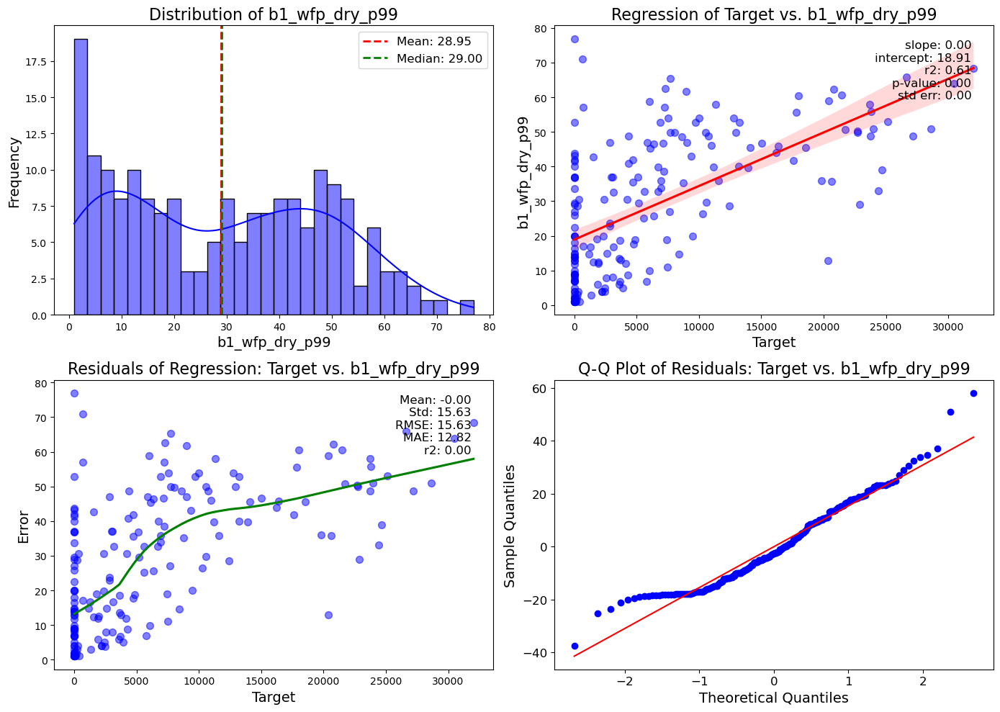

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_wfp_dry_p99_0_combined_plot_tr.JPG


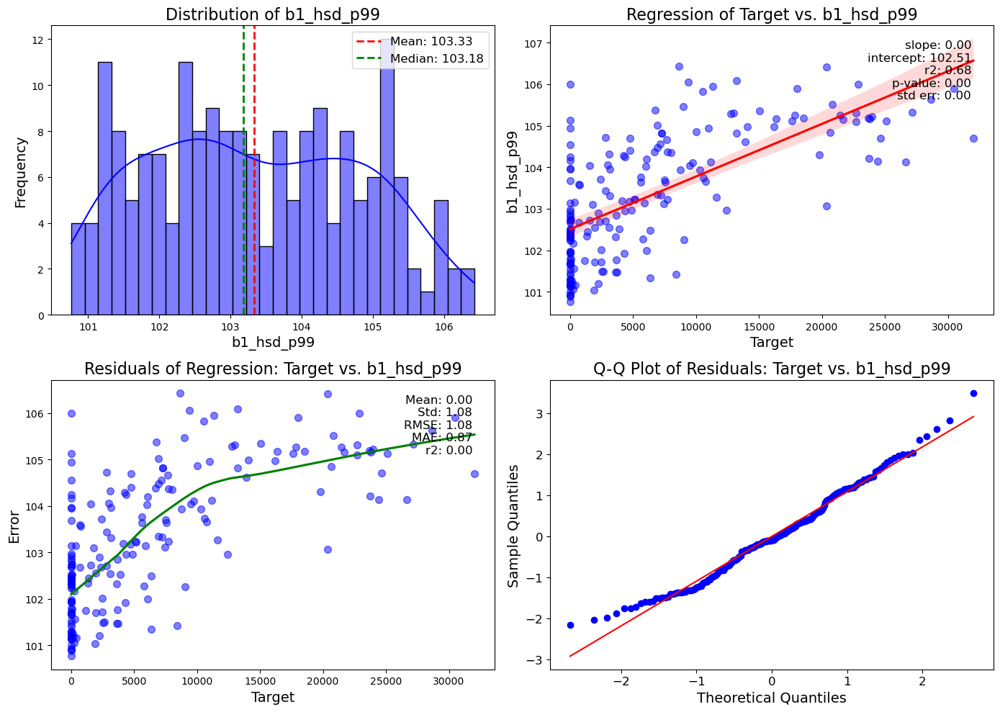

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hsd_p99_0_combined_plot_tr.JPG


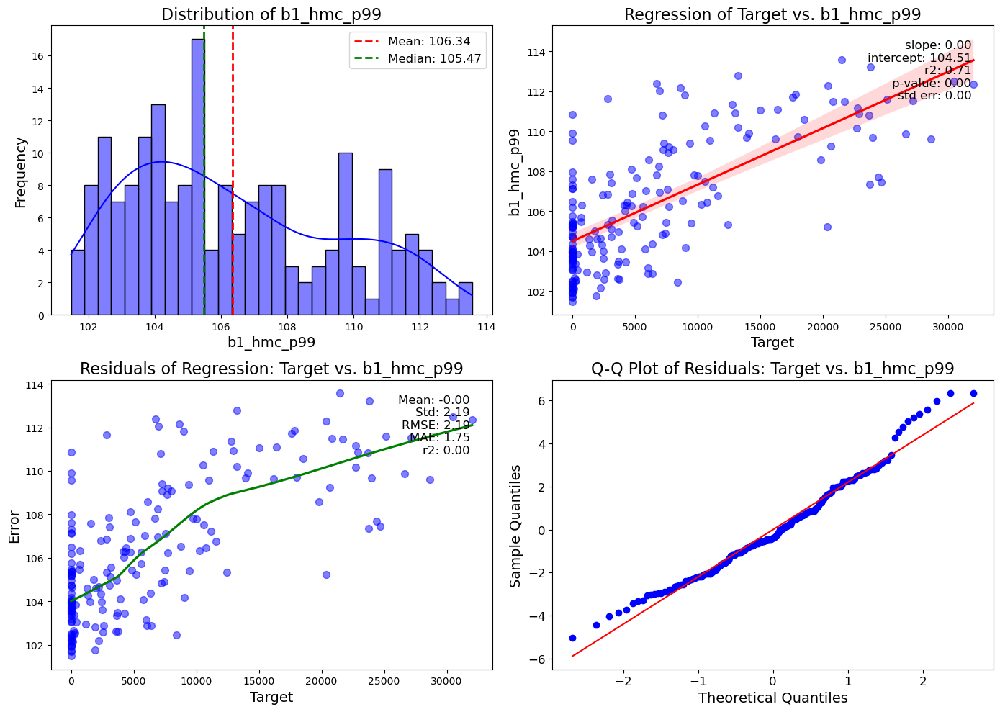

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hmc_p99_0_combined_plot_tr.JPG


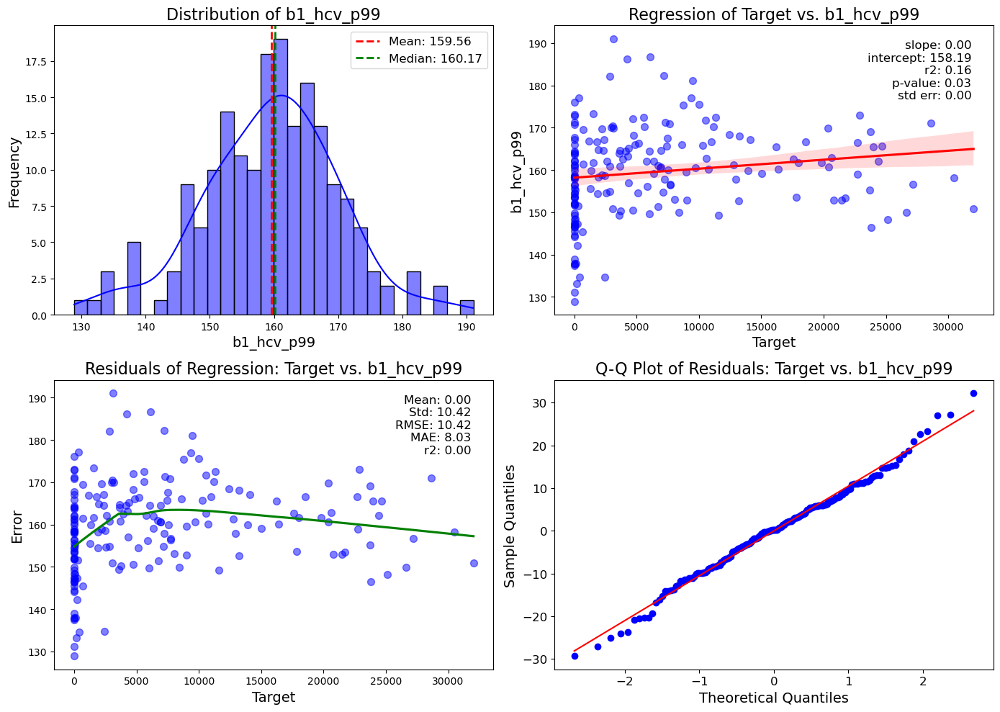

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hcv_p99_0_combined_plot_tr.JPG


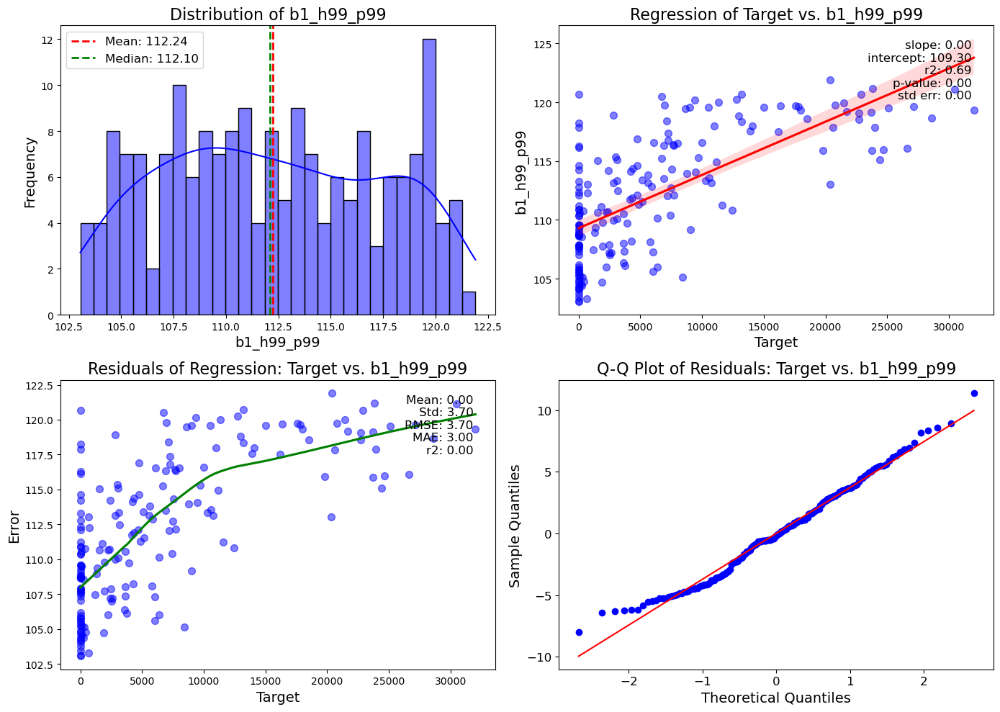

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_h99_p99_0_combined_plot_tr.JPG


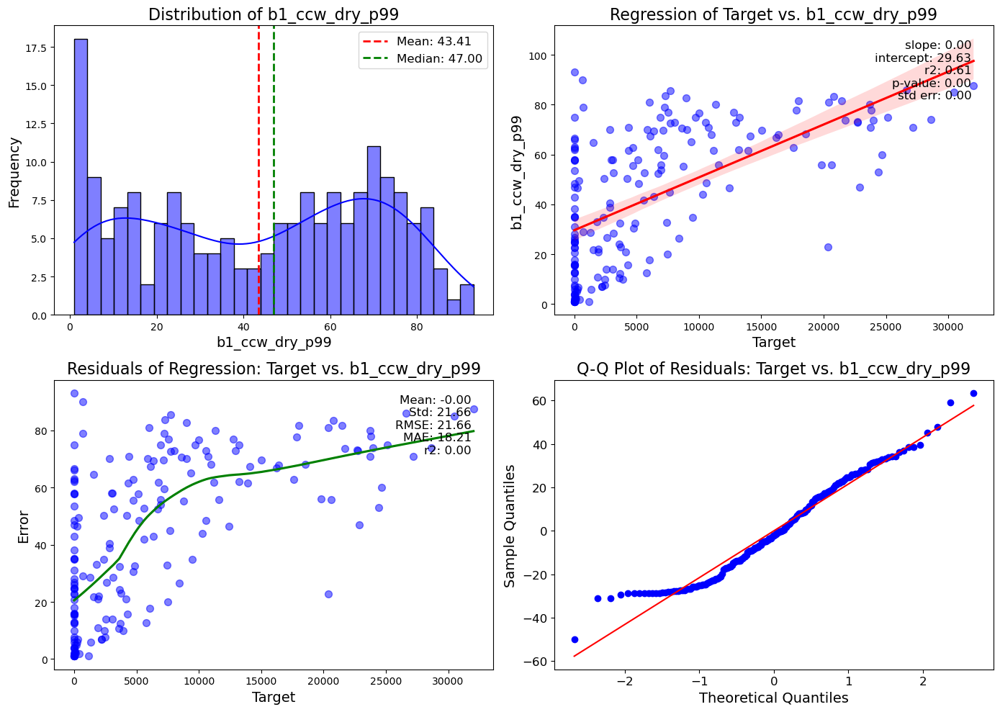

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_ccw_dry_p99_0_combined_plot_tr.JPG


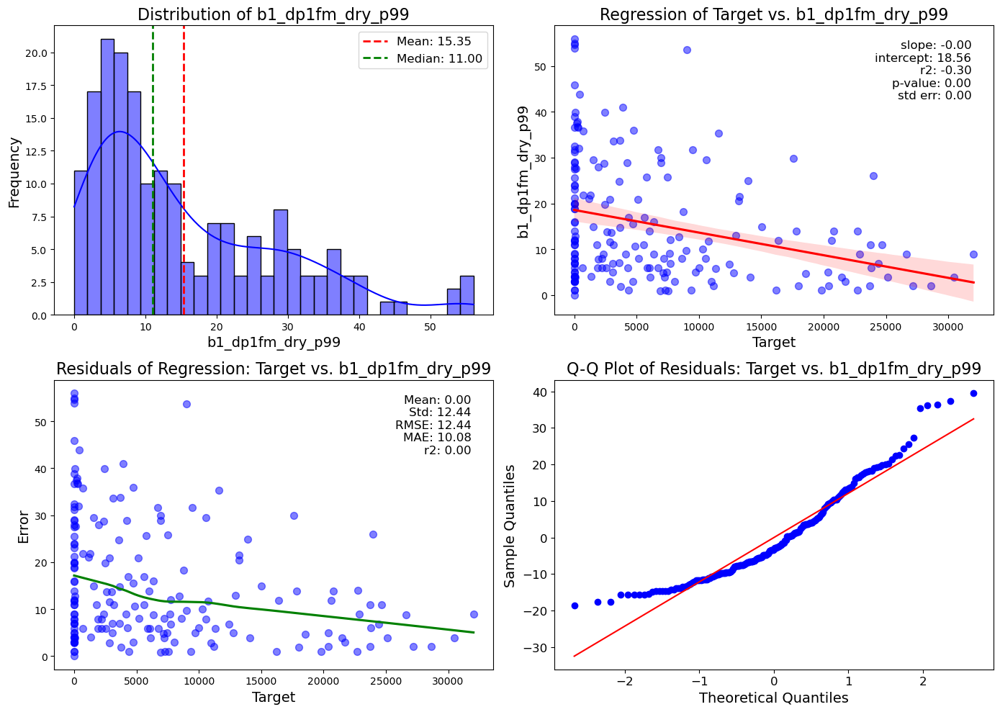

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_dp1fm_dry_p99_0_combined_plot_tr.JPG


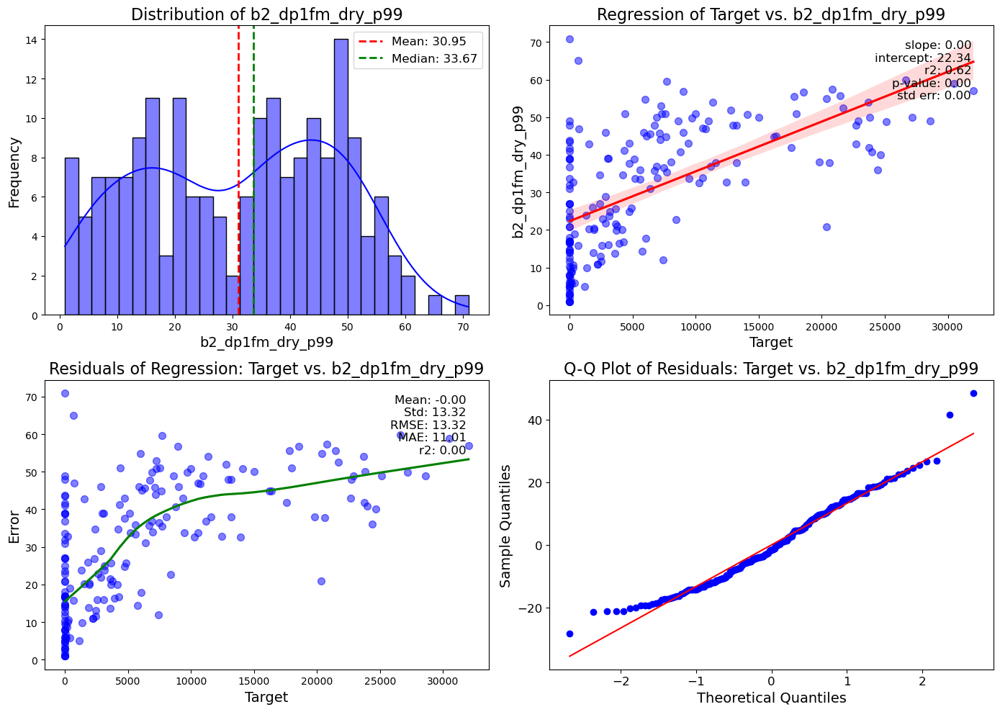

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b2_dp1fm_dry_p99_0_combined_plot_tr.JPG


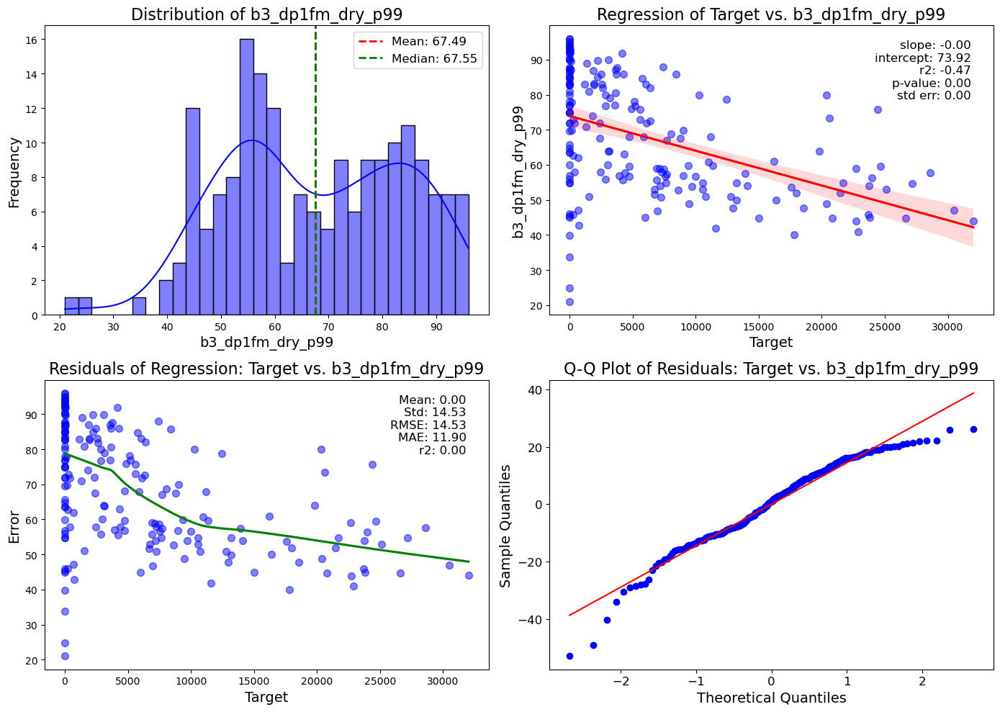

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b3_dp1fm_dry_p99_0_combined_plot_tr.JPG


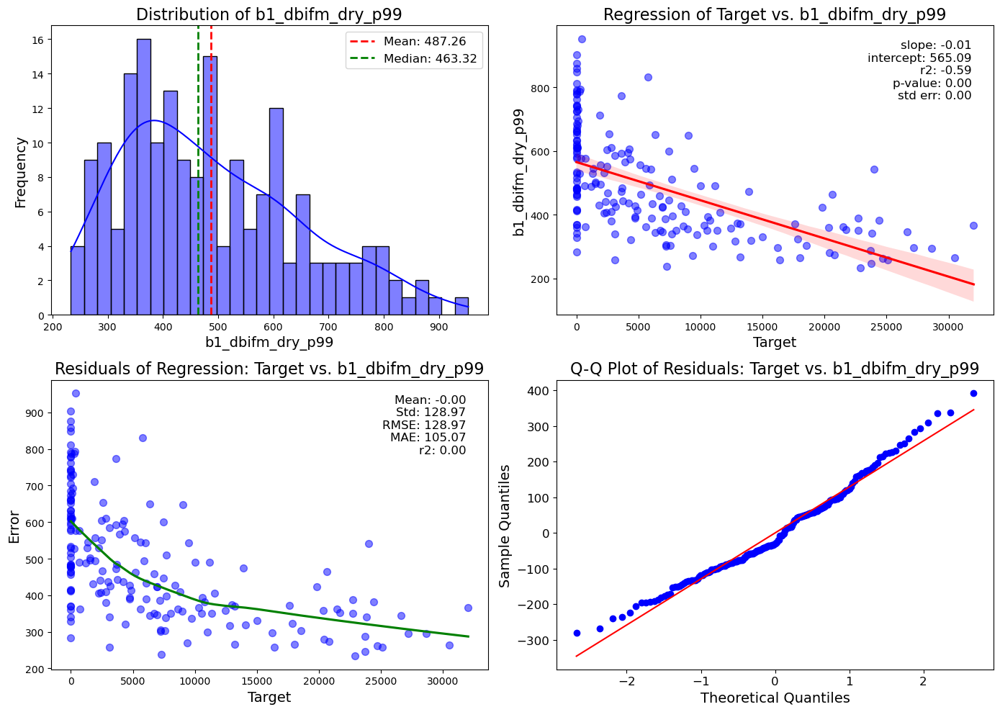

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_dbifm_dry_p99_0_combined_plot_tr.JPG


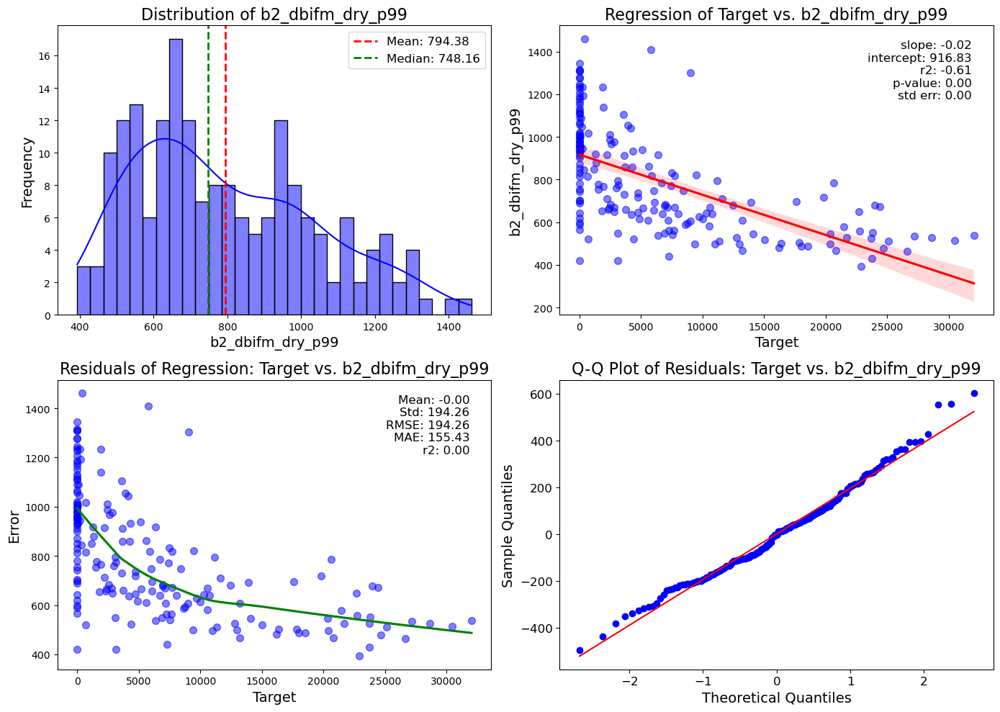

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b2_dbifm_dry_p99_0_combined_plot_tr.JPG


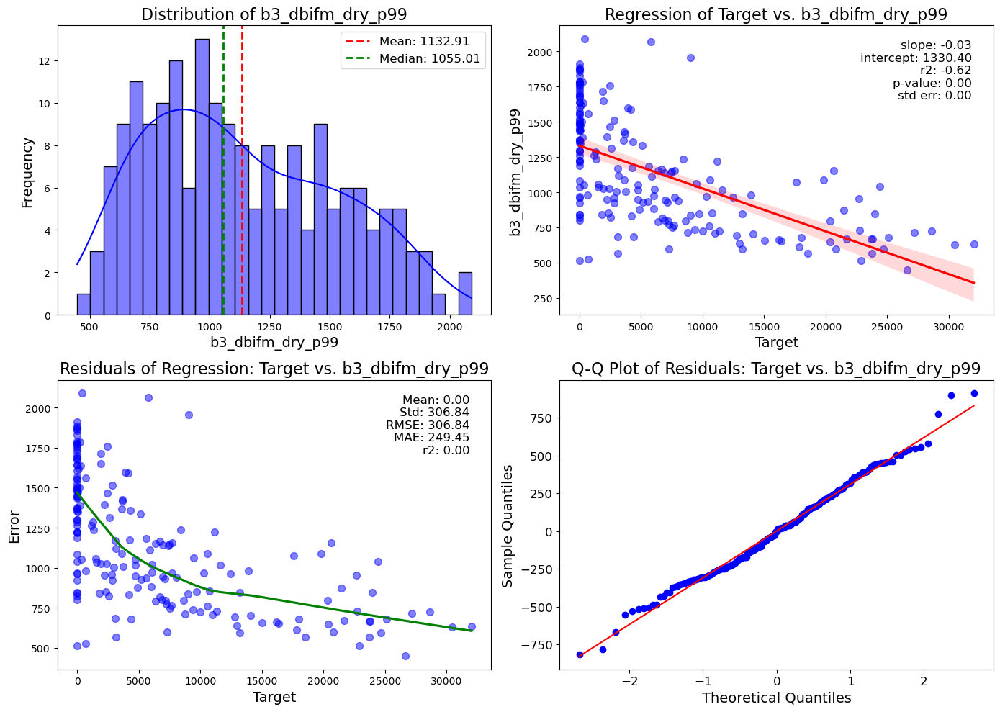

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b3_dbifm_dry_p99_0_combined_plot_tr.JPG


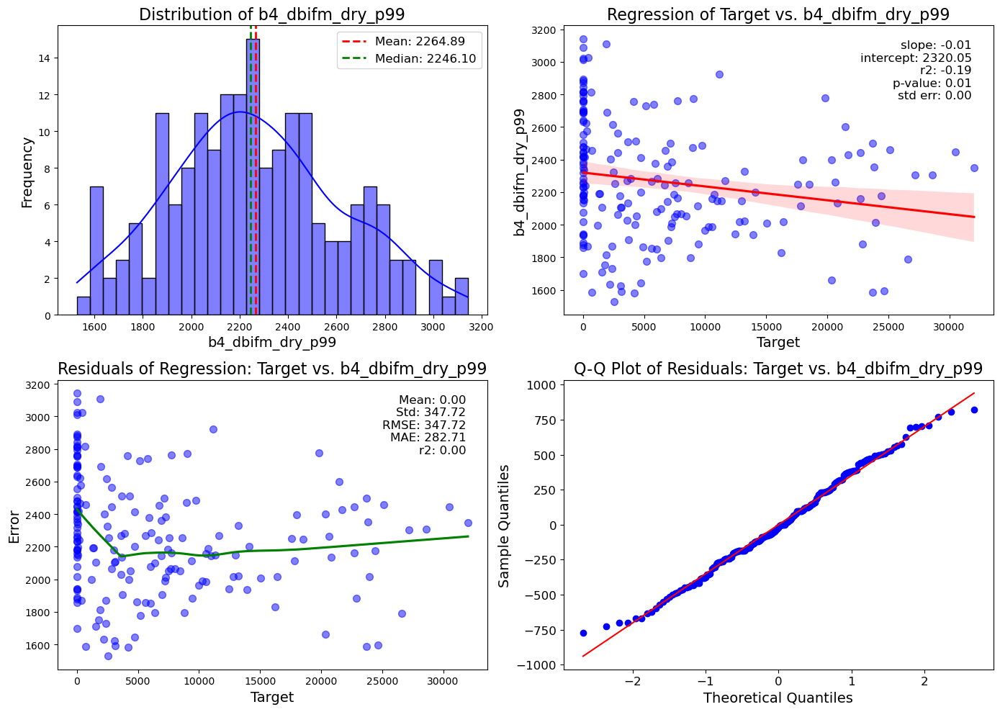

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b4_dbifm_dry_p99_0_combined_plot_tr.JPG


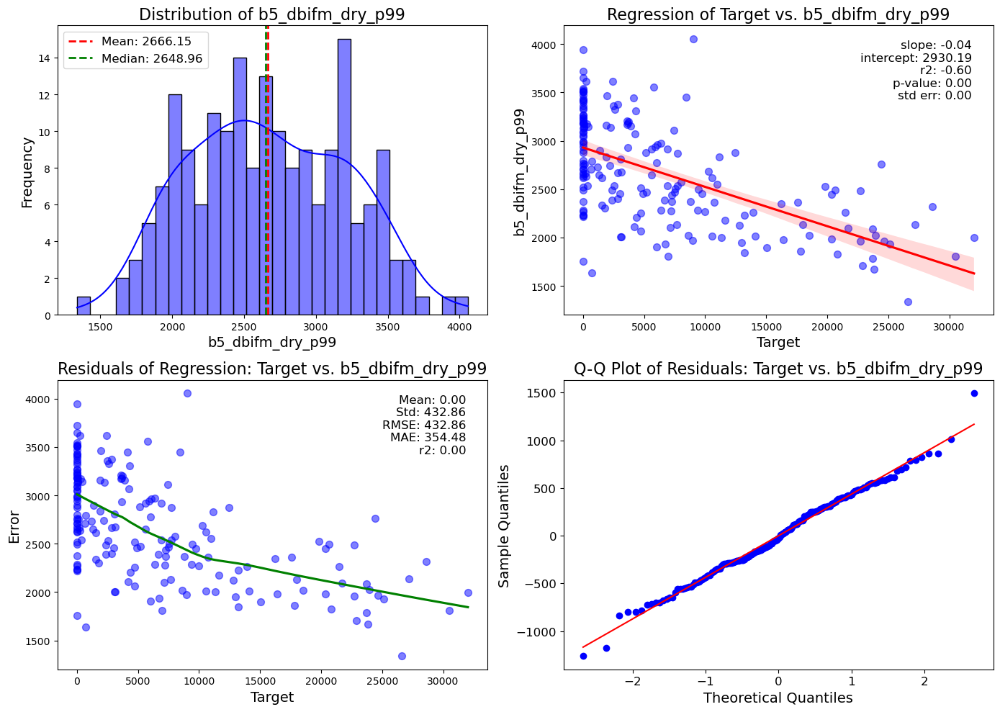

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b5_dbifm_dry_p99_0_combined_plot_tr.JPG


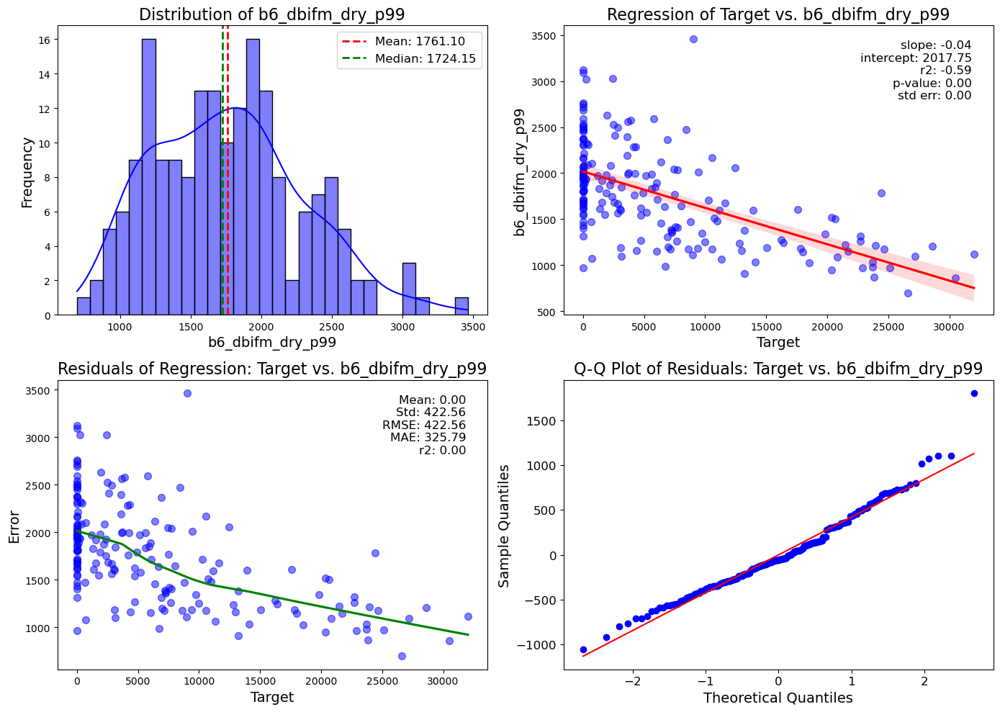

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b6_dbifm_dry_p99_0_combined_plot_tr.JPG


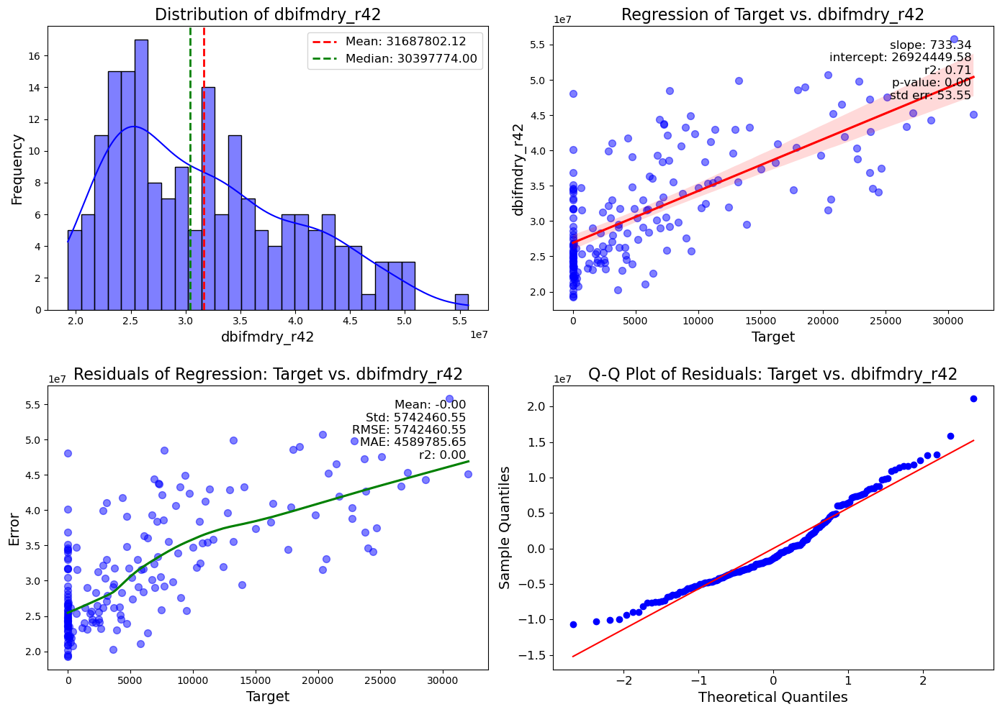

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r42_0_combined_plot_tr.JPG


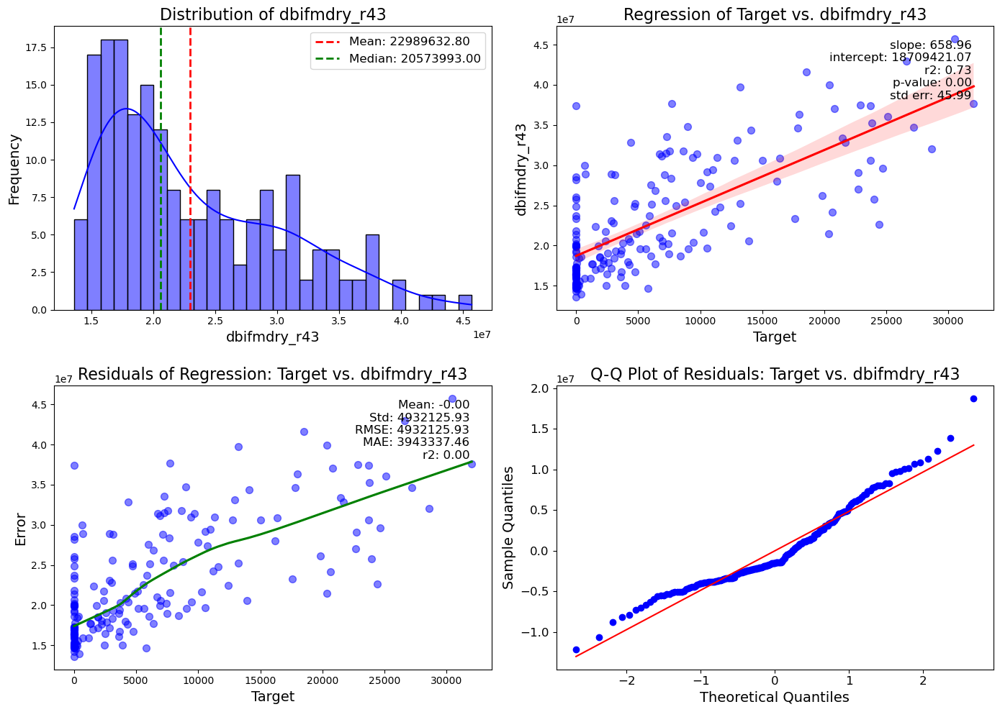

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r43_0_combined_plot_tr.JPG


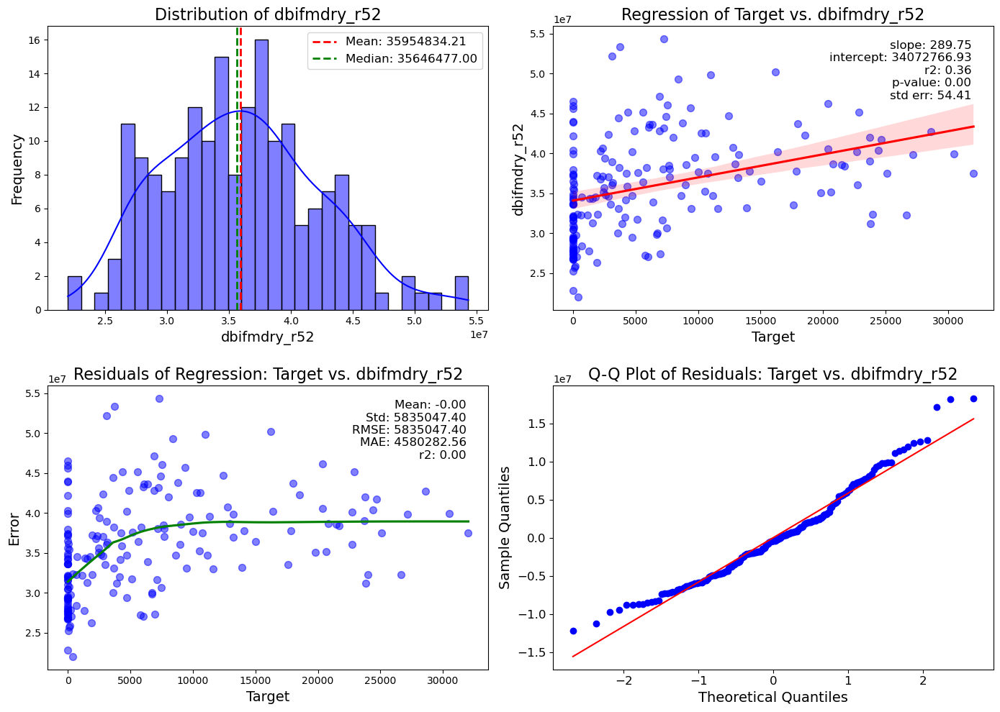

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r52_0_combined_plot_tr.JPG


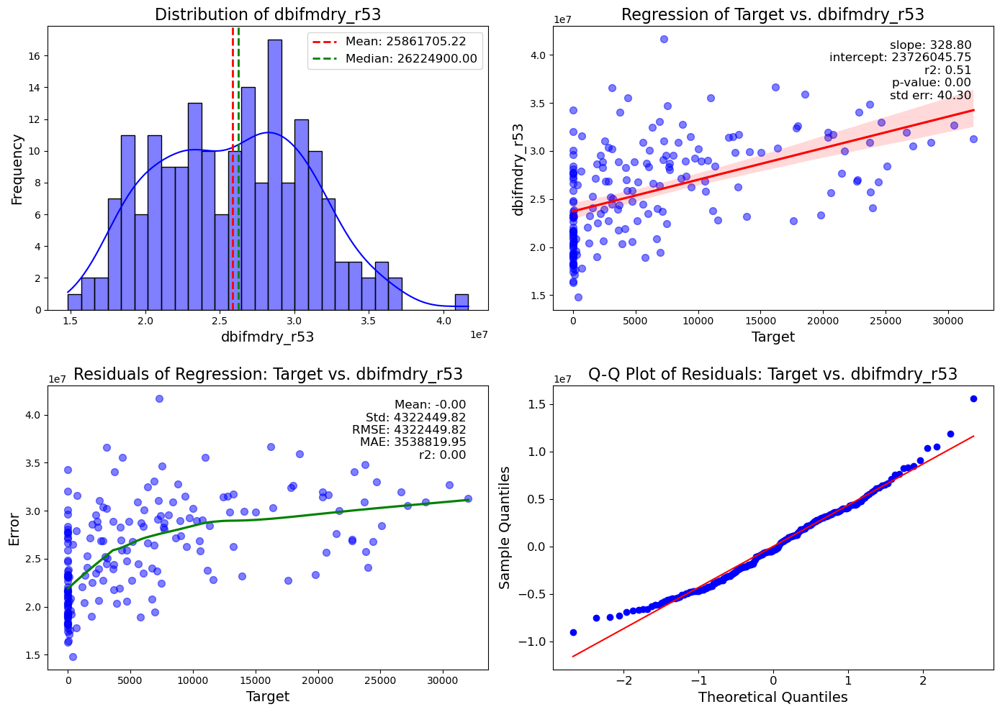

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r53_0_combined_plot_tr.JPG


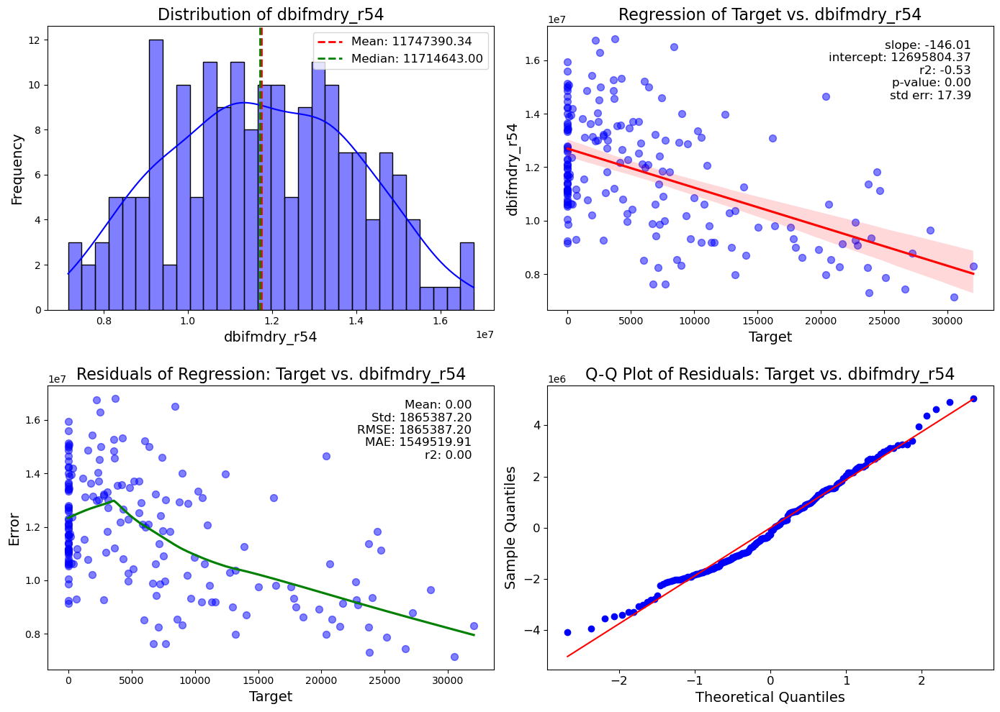

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r54_0_combined_plot_tr.JPG


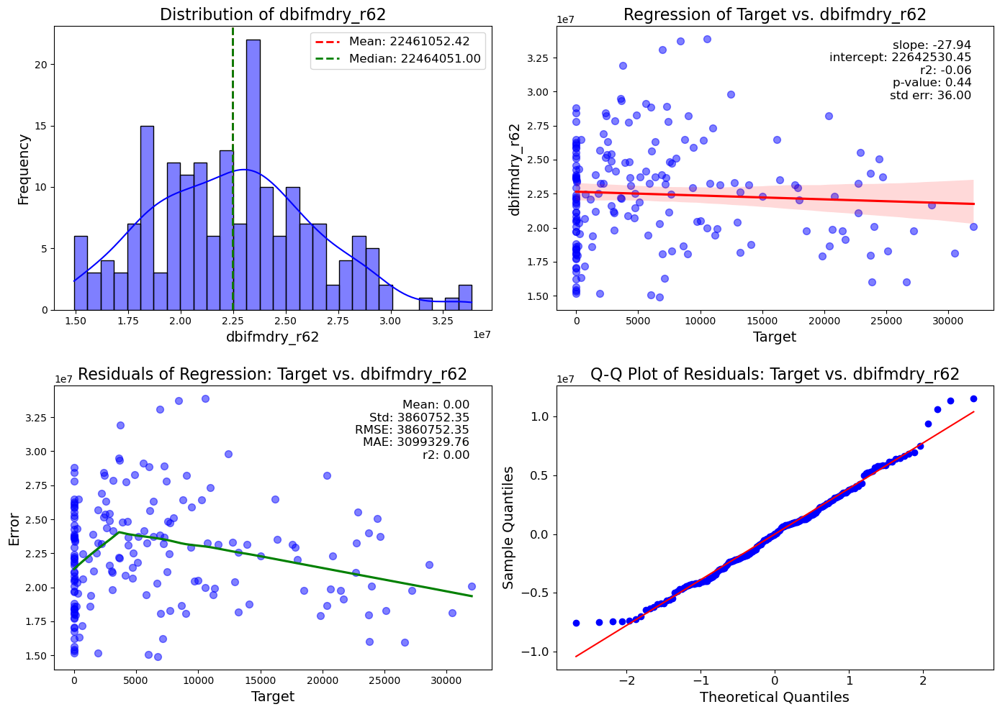

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r62_0_combined_plot_tr.JPG


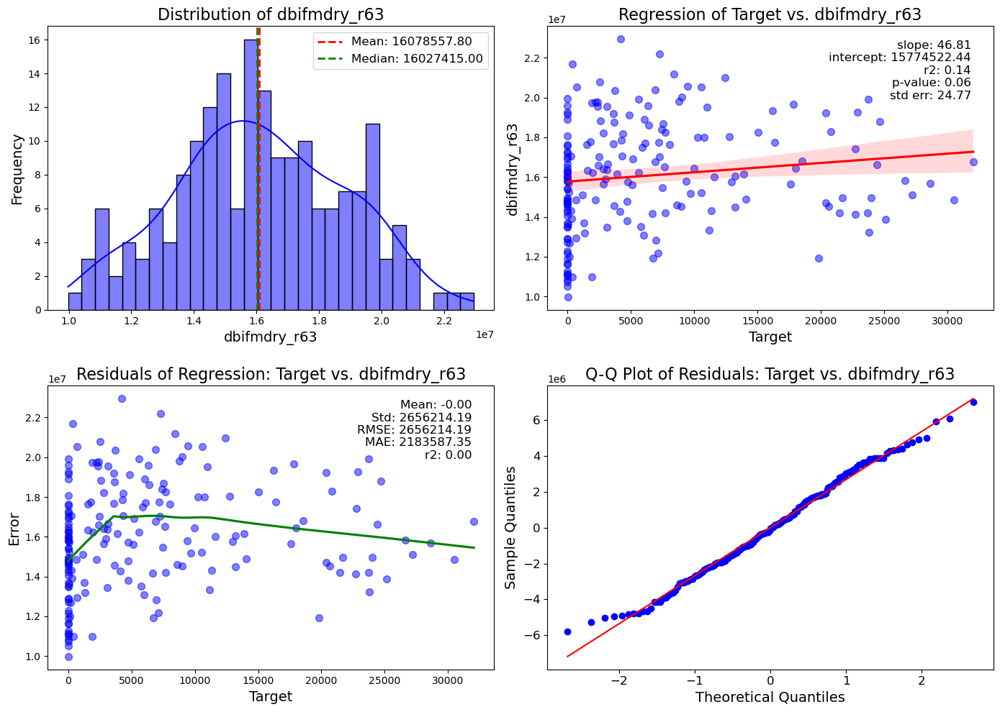

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r63_0_combined_plot_tr.JPG


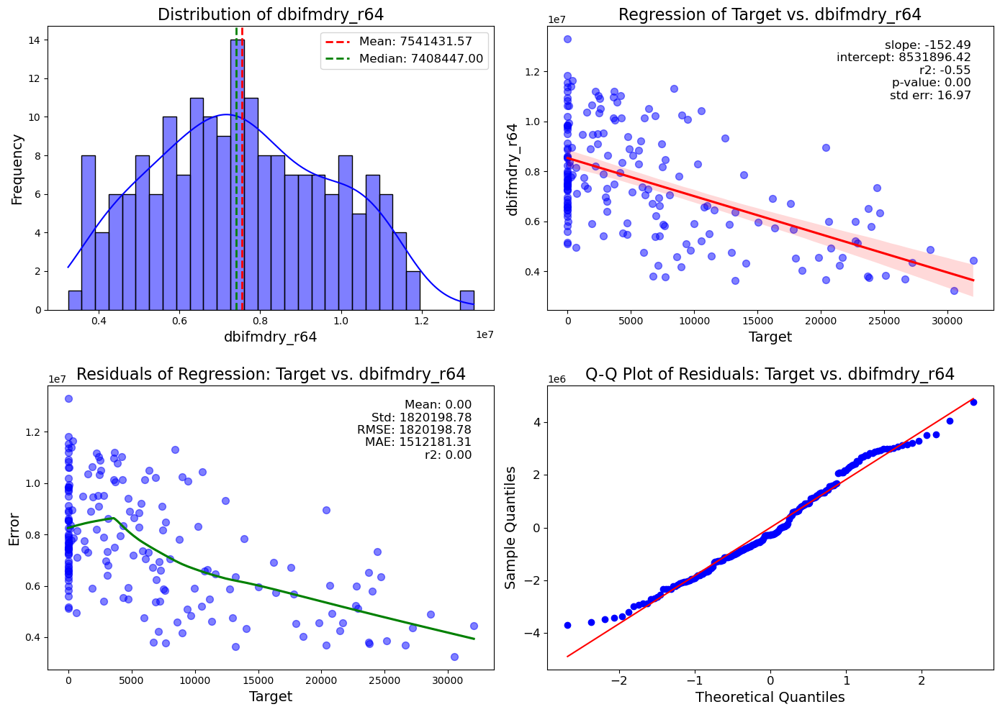

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r64_0_combined_plot_tr.JPG


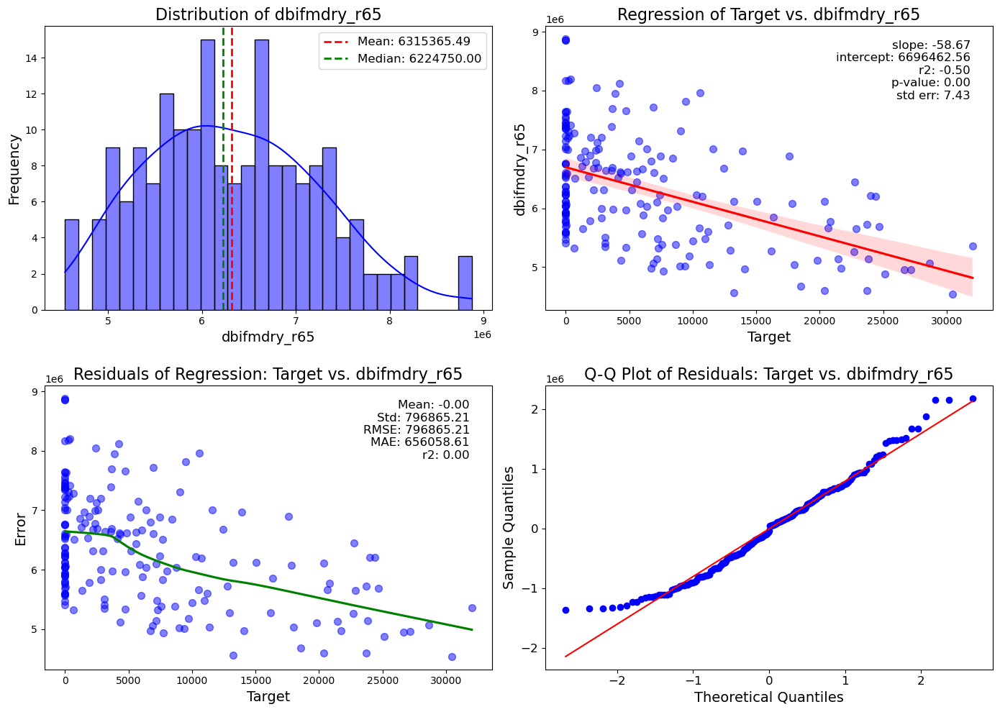

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_r65_0_combined_plot_tr.JPG


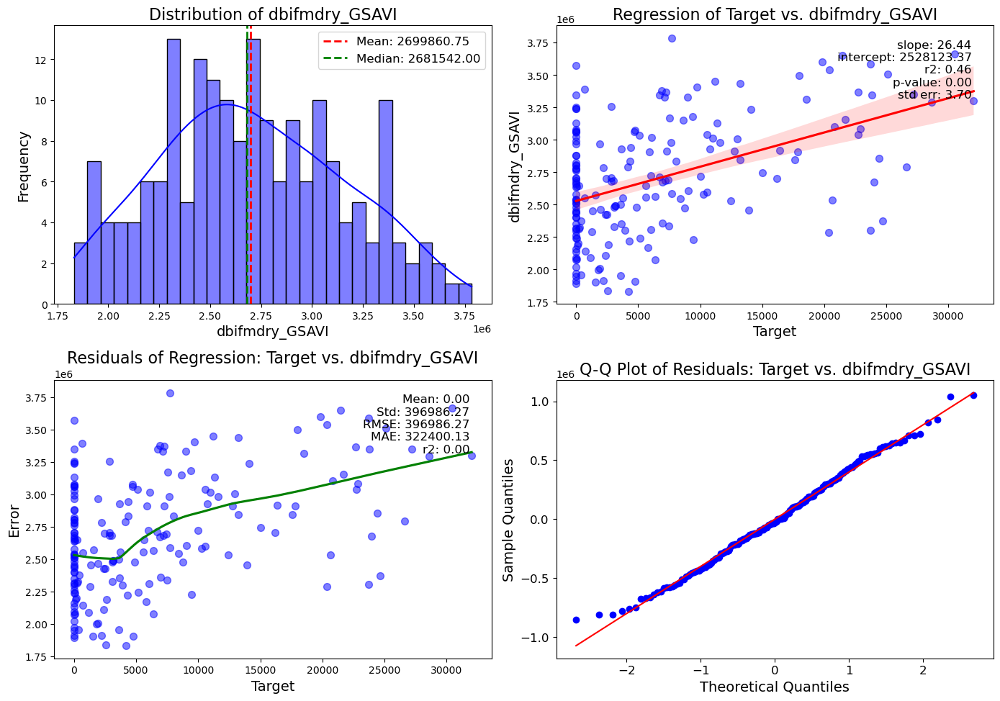

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_GSAVI_0_combined_plot_tr.JPG


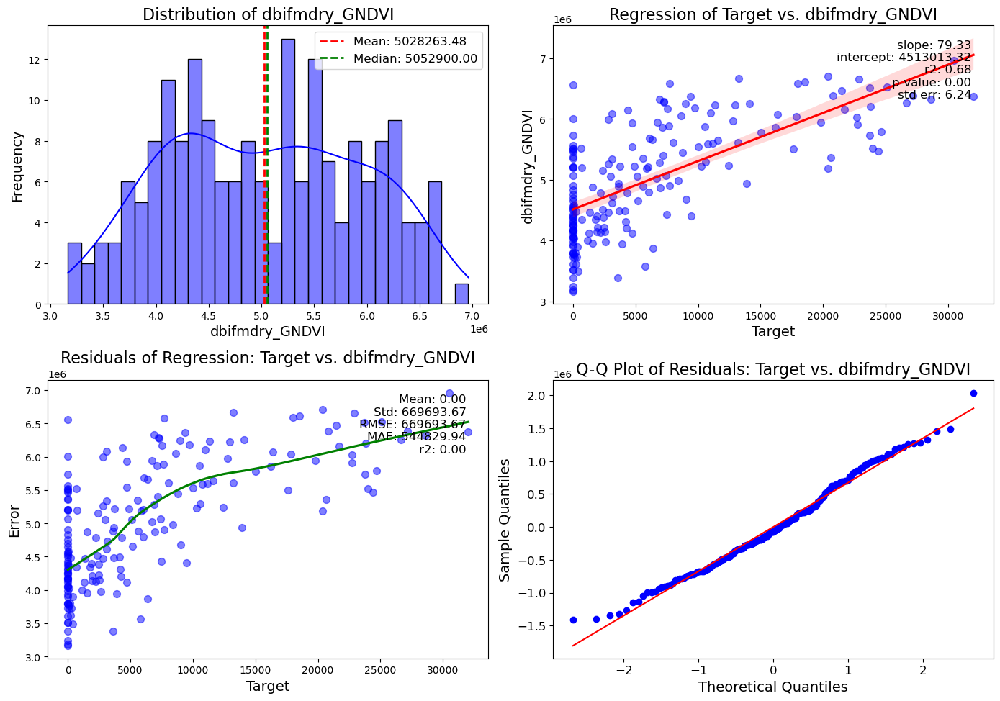

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_GNDVI_0_combined_plot_tr.JPG


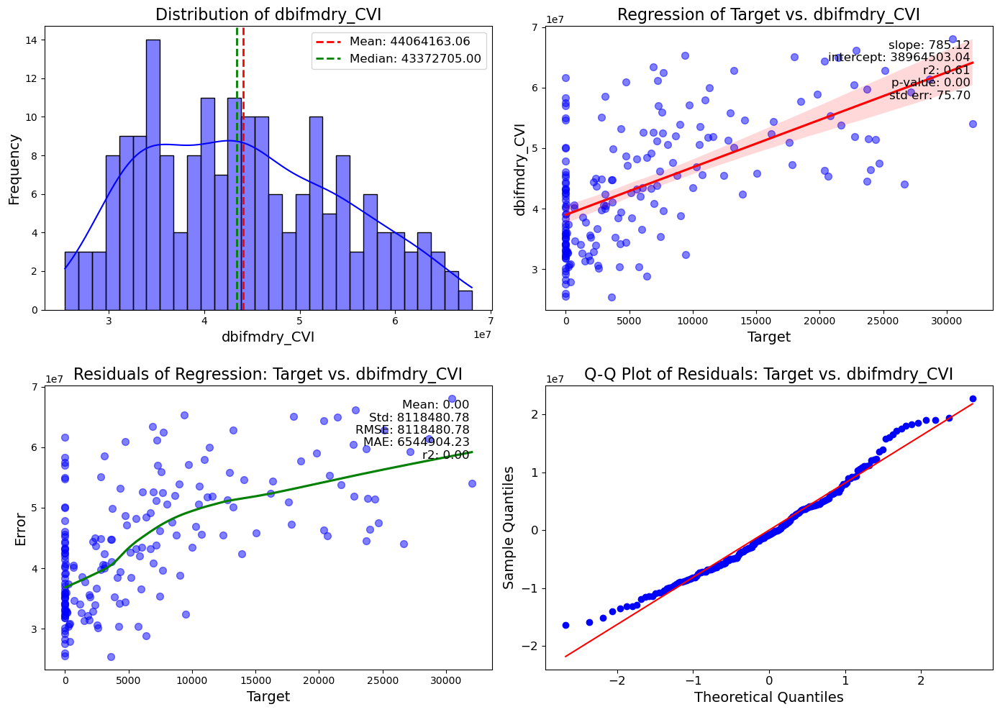

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_CVI_0_combined_plot_tr.JPG


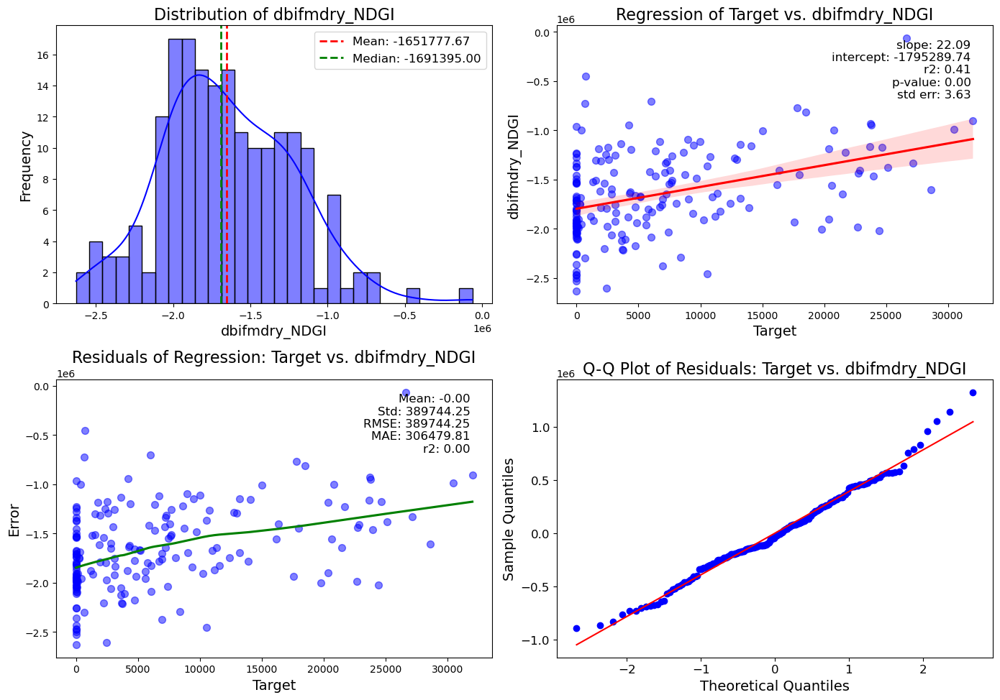

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_NDGI_0_combined_plot_tr.JPG


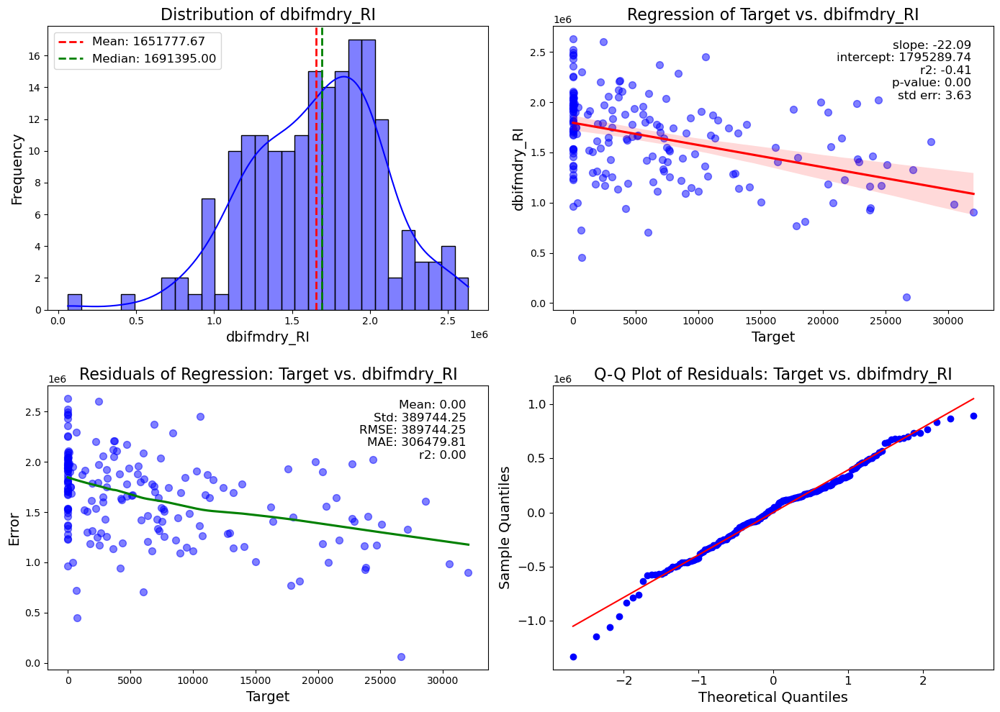

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_RI_0_combined_plot_tr.JPG


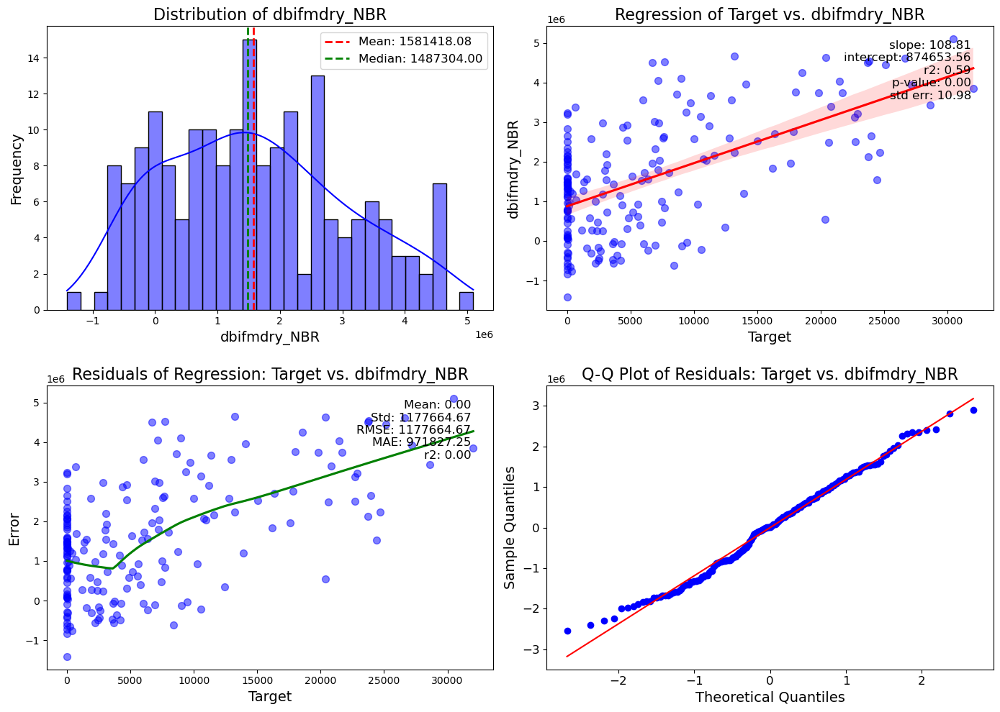

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_NBR_0_combined_plot_tr.JPG


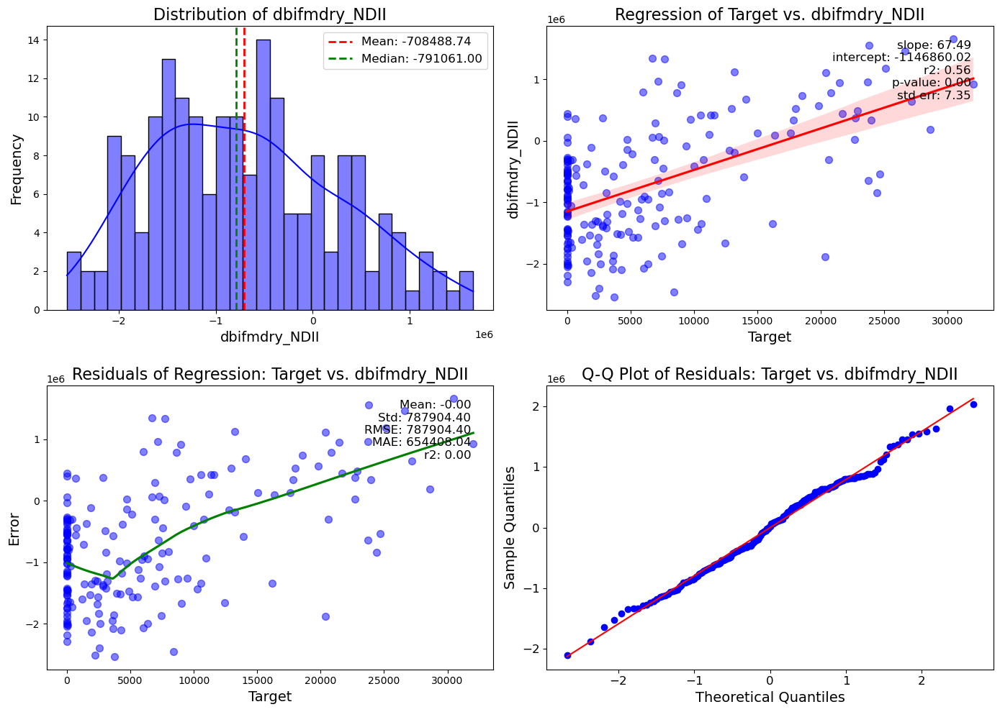

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_NDII_0_combined_plot_tr.JPG


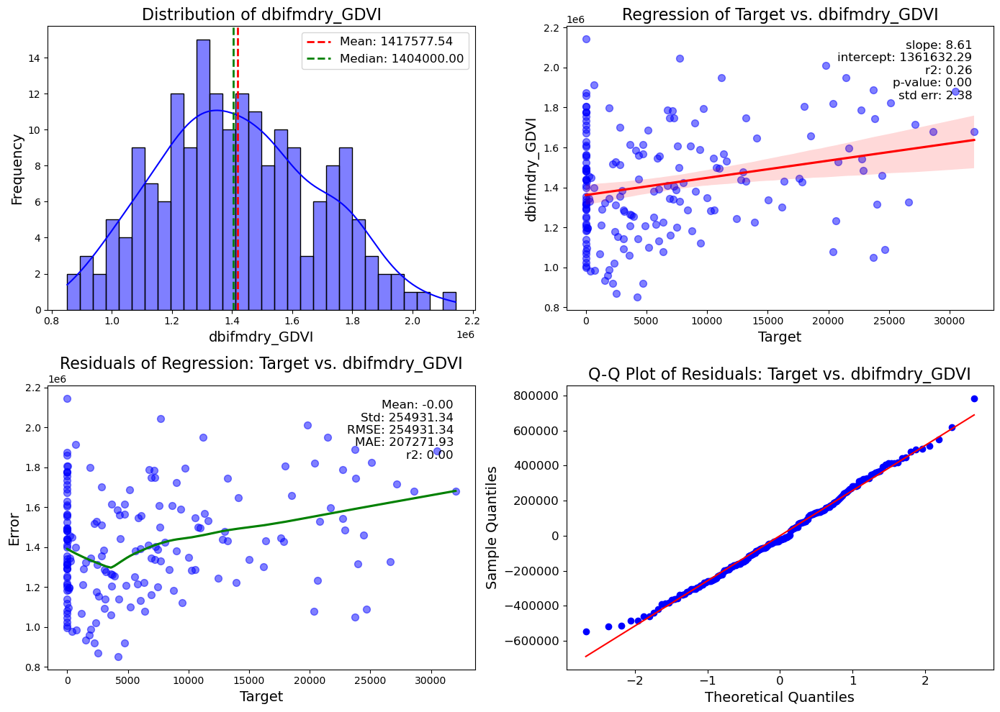

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_GDVI_0_combined_plot_tr.JPG


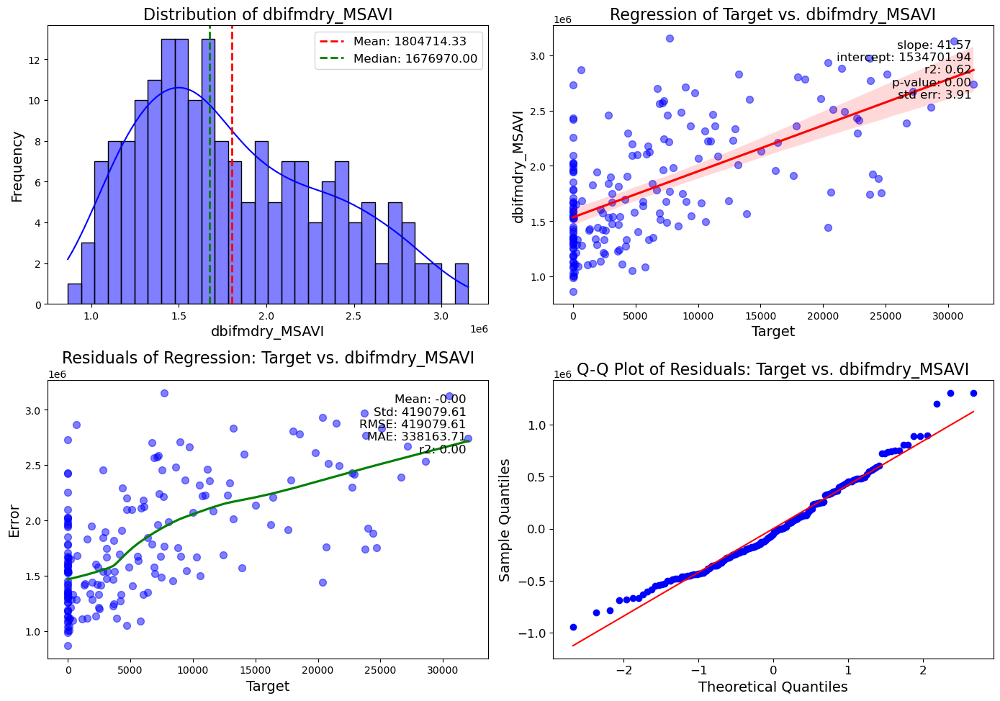

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_MSAVI_0_combined_plot_tr.JPG


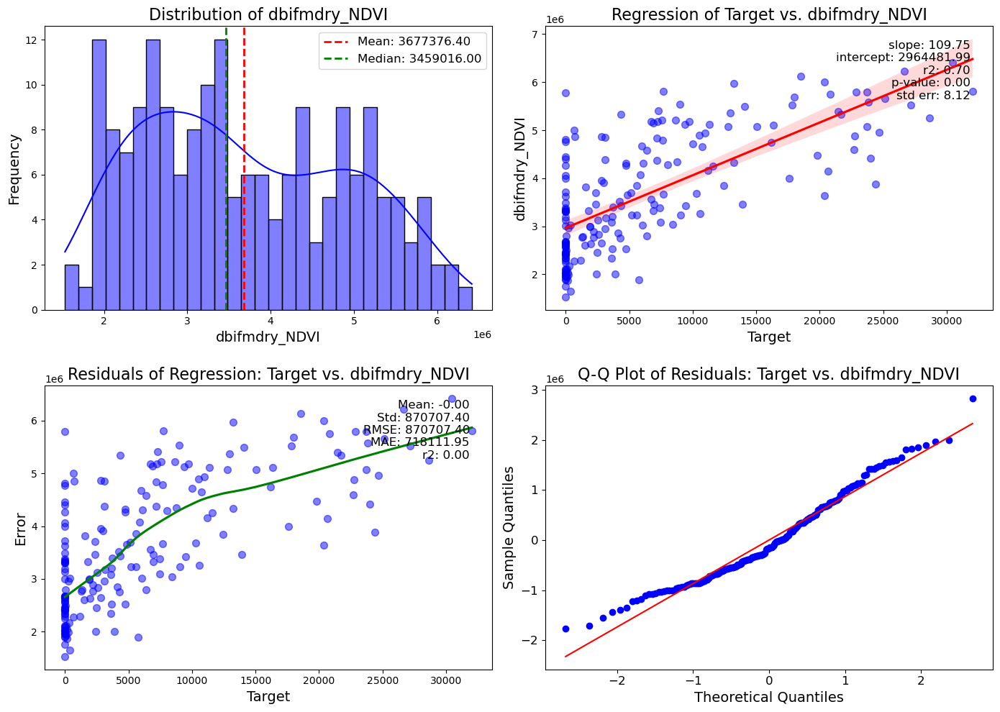

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_NDVI_0_combined_plot_tr.JPG


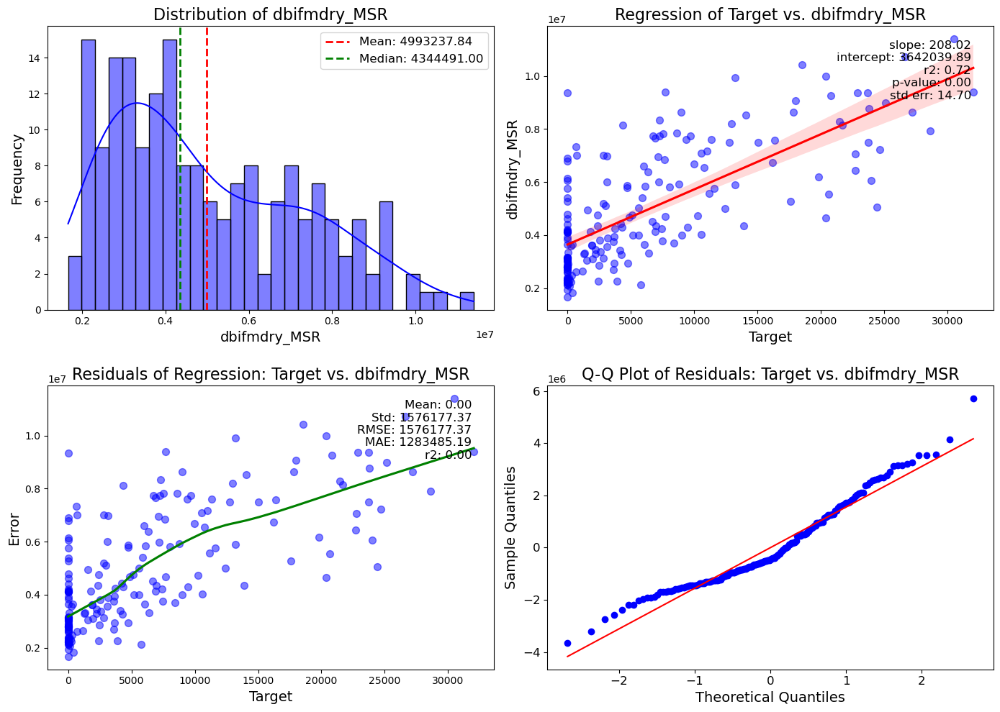

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_dbifmdry_MSR_0_combined_plot_tr.JPG


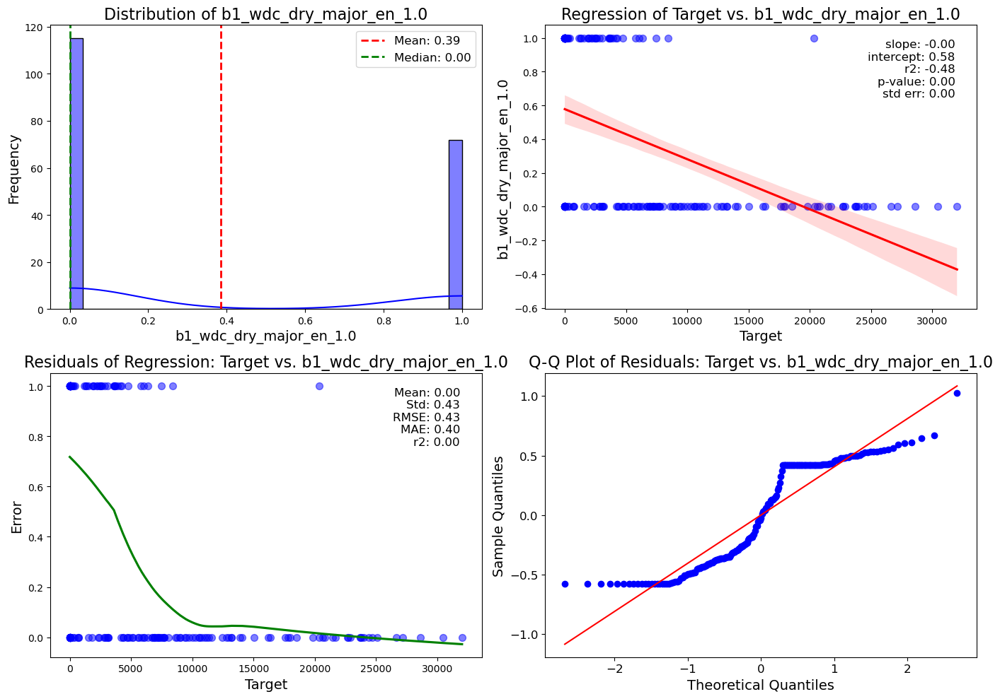

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_wdc_dry_major_en_1.0_0_combined_plot_tr.JPG


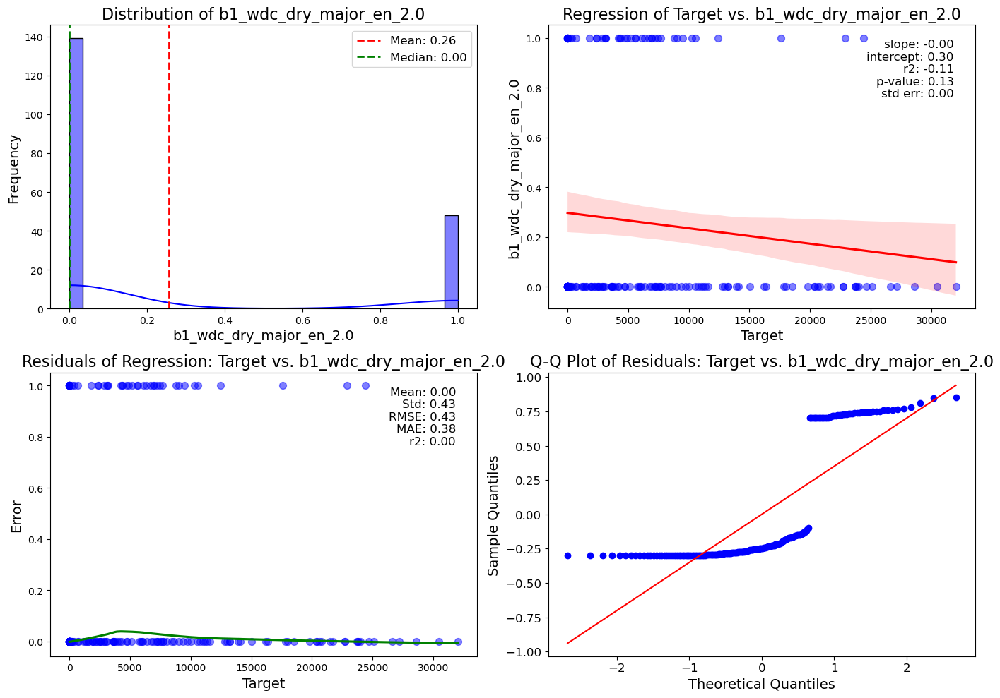

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_wdc_dry_major_en_2.0_0_combined_plot_tr.JPG


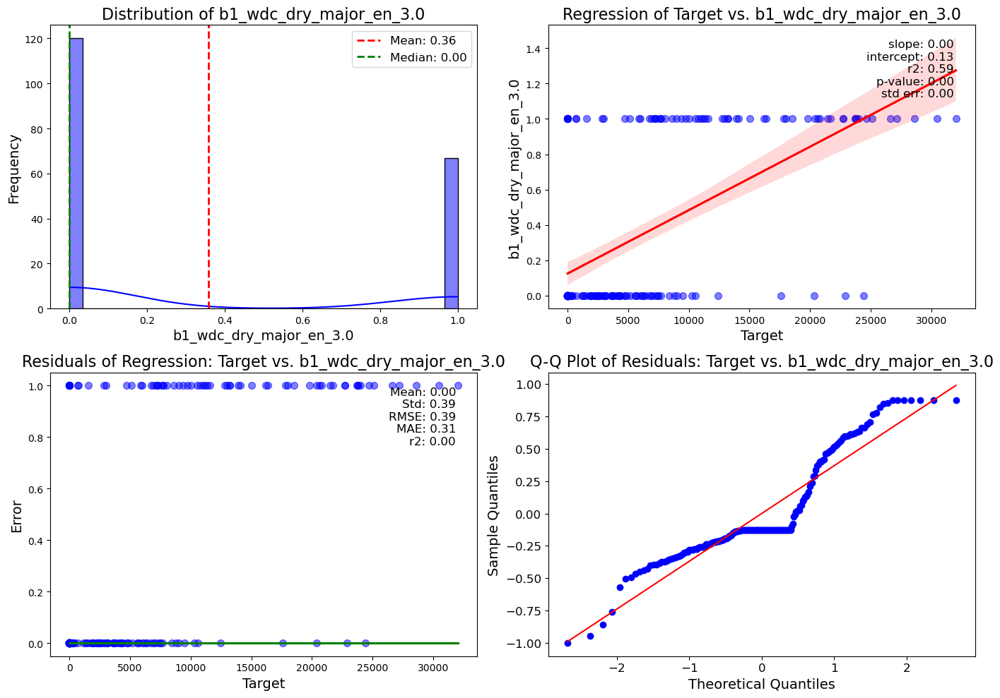

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_wdc_dry_major_en_3.0_0_combined_plot_tr.JPG


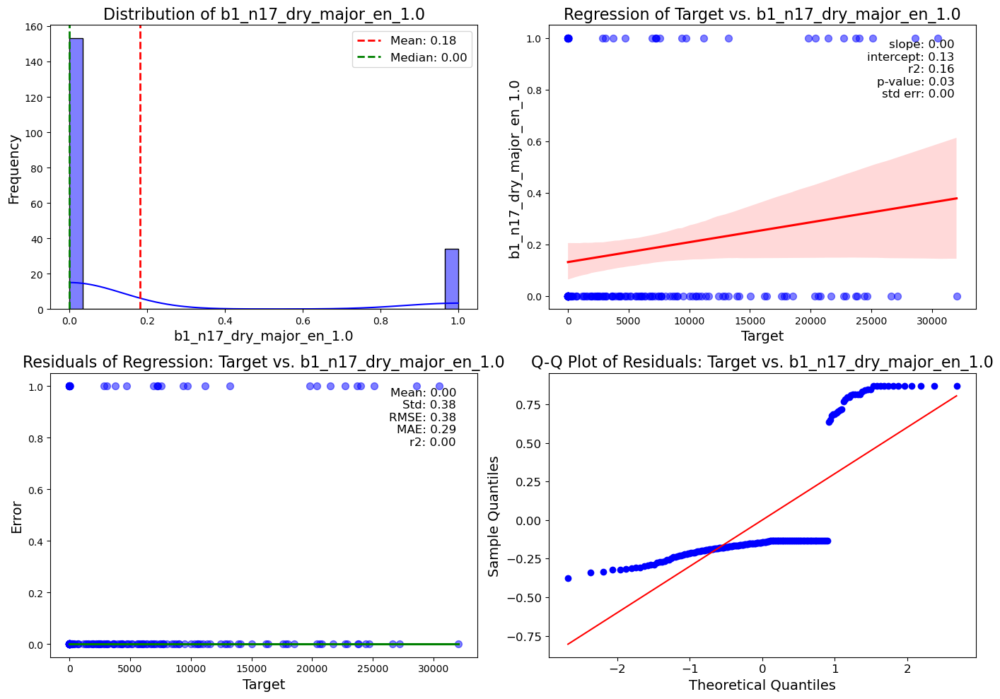

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_1.0_0_combined_plot_tr.JPG


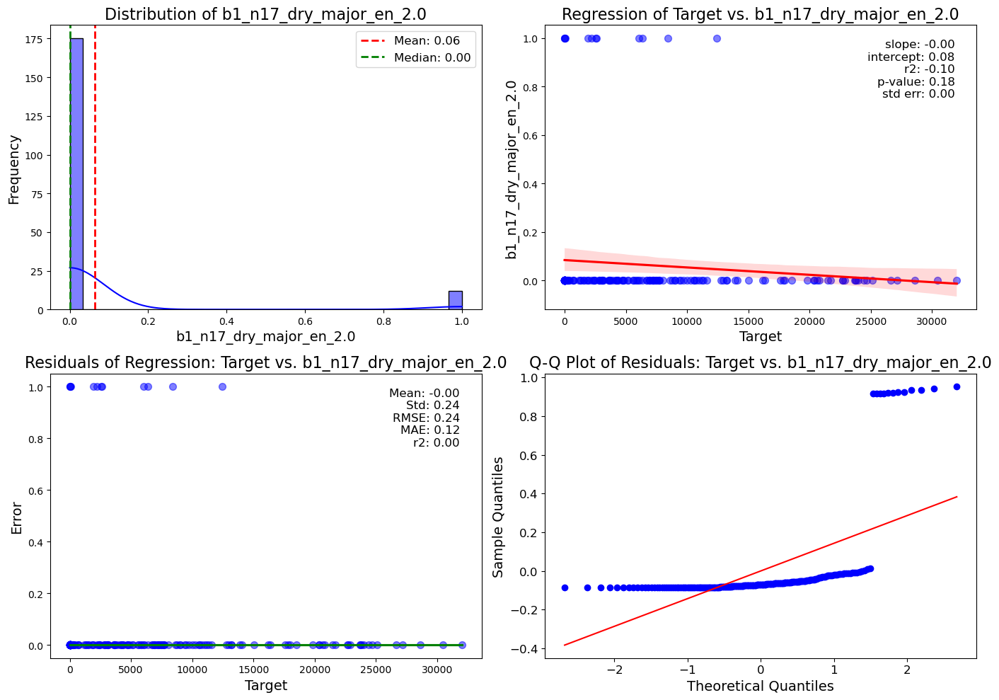

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_2.0_0_combined_plot_tr.JPG


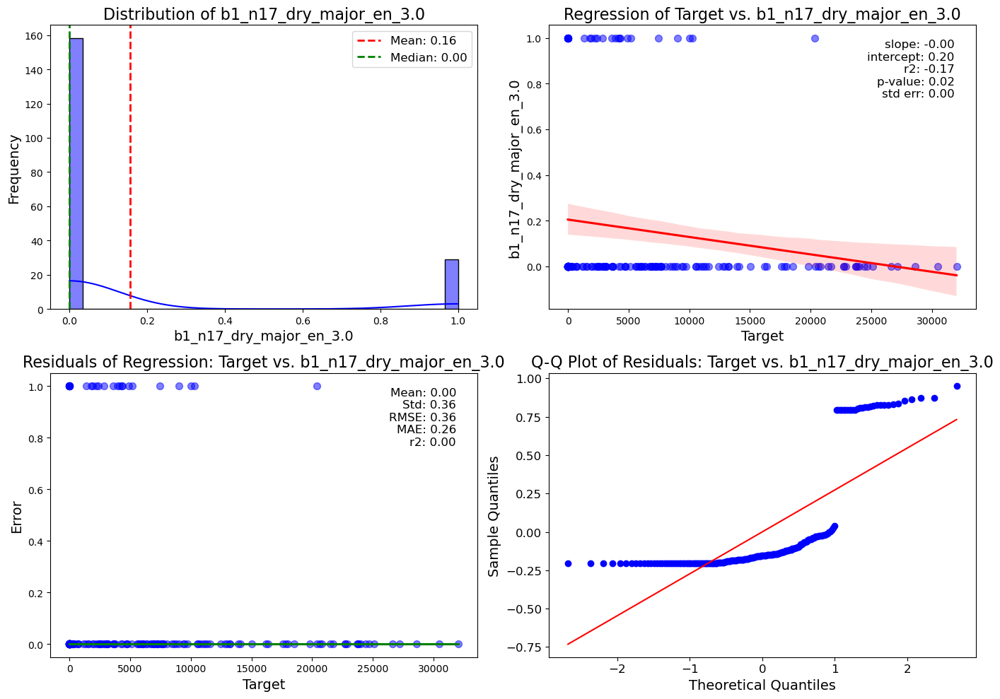

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_3.0_0_combined_plot_tr.JPG


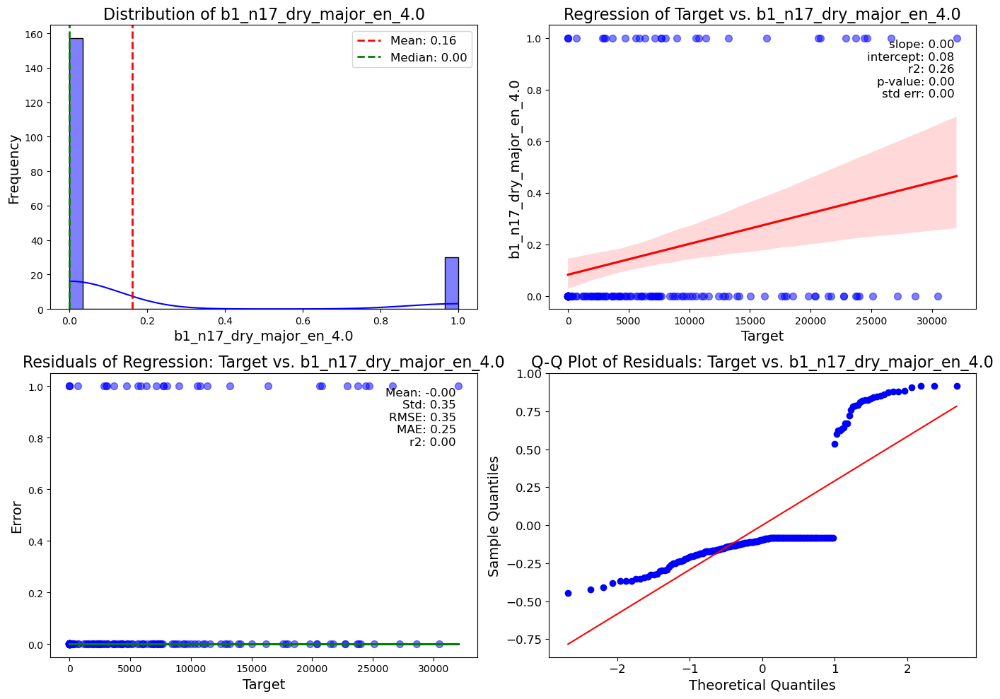

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_4.0_0_combined_plot_tr.JPG


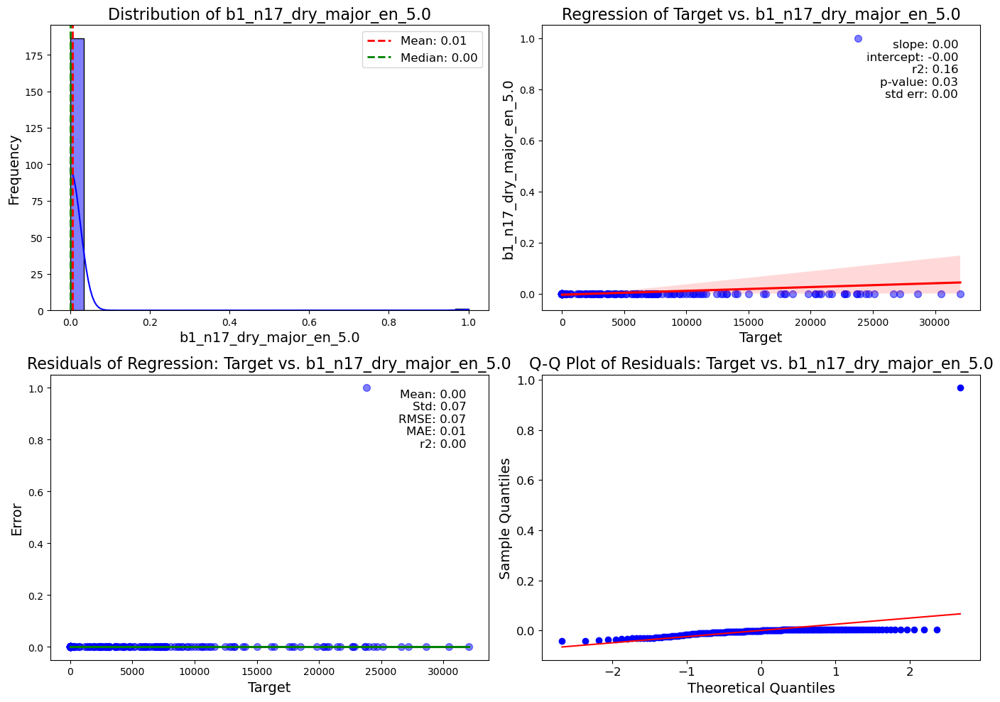

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_5.0_0_combined_plot_tr.JPG


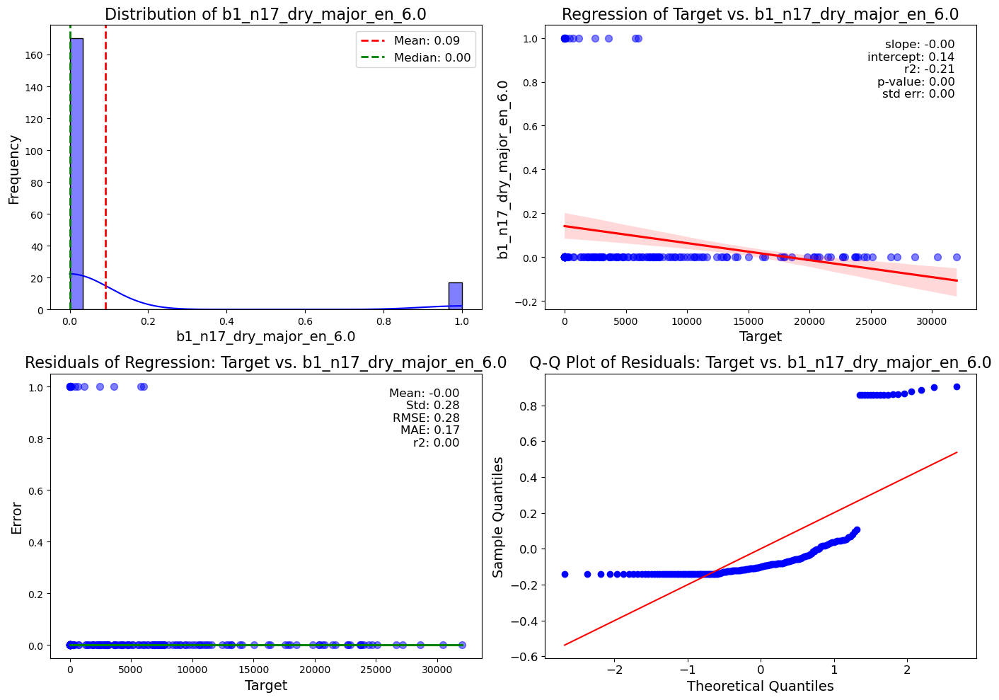

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_6.0_0_combined_plot_tr.JPG


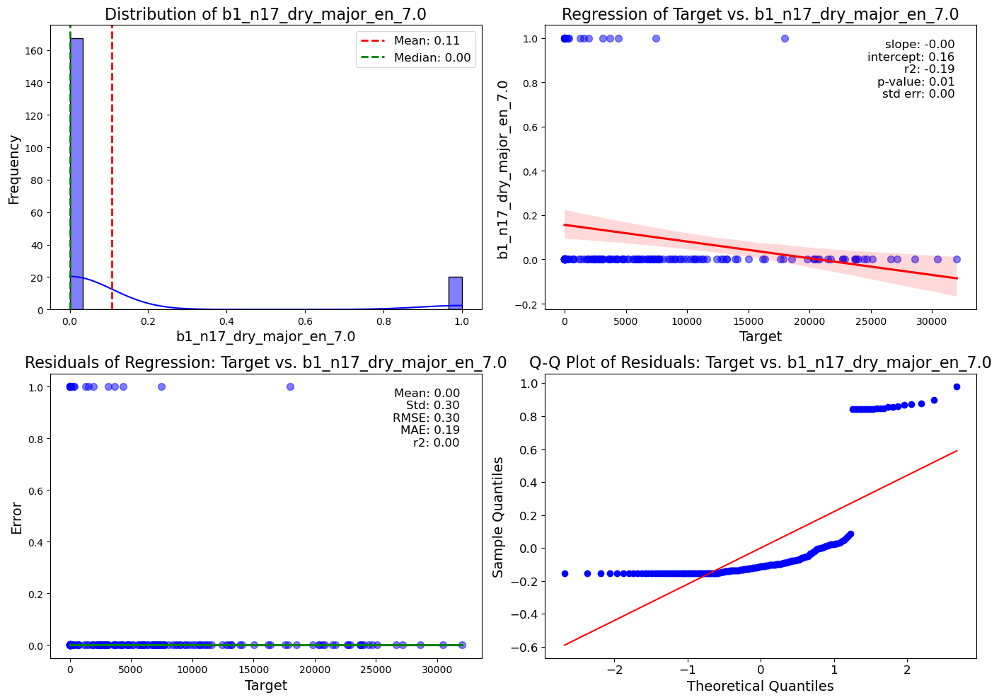

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_7.0_0_combined_plot_tr.JPG


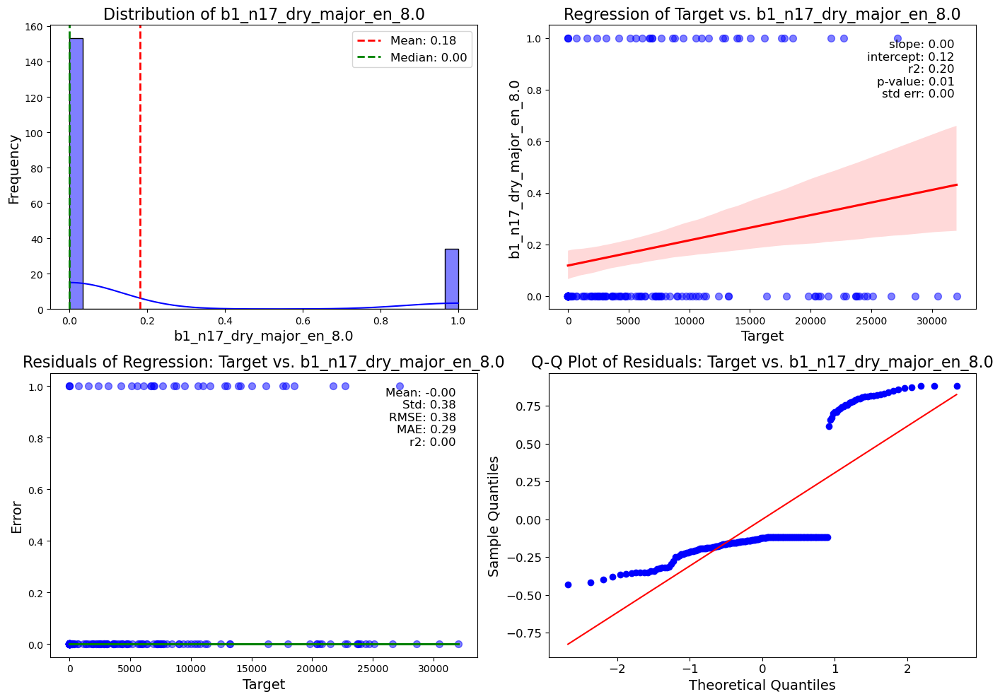

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_8.0_0_combined_plot_tr.JPG


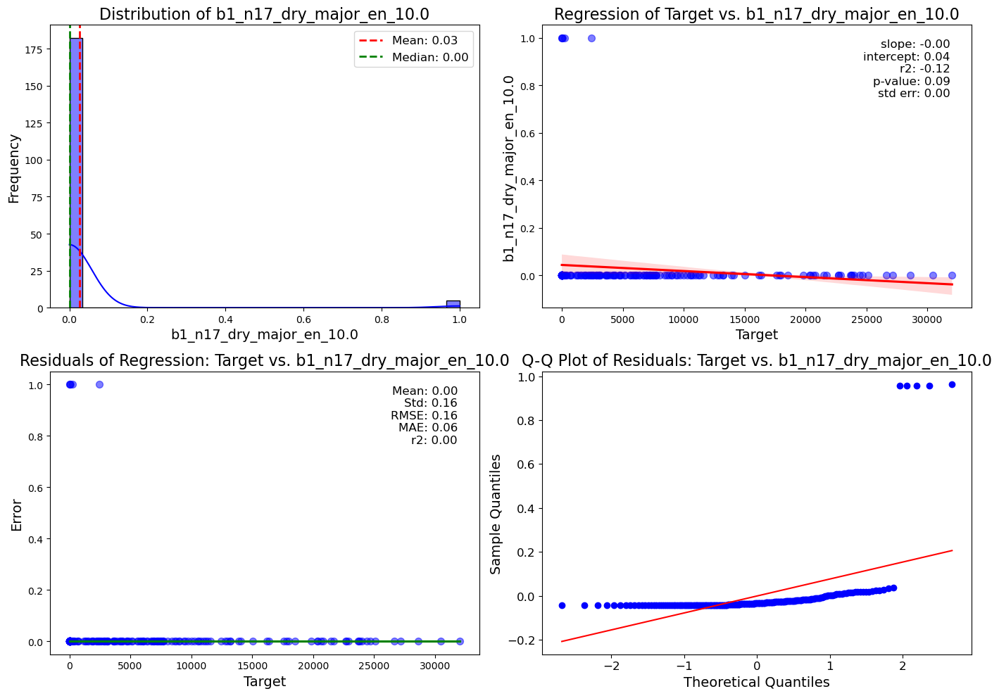

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_10.0_0_combined_plot_tr.JPG


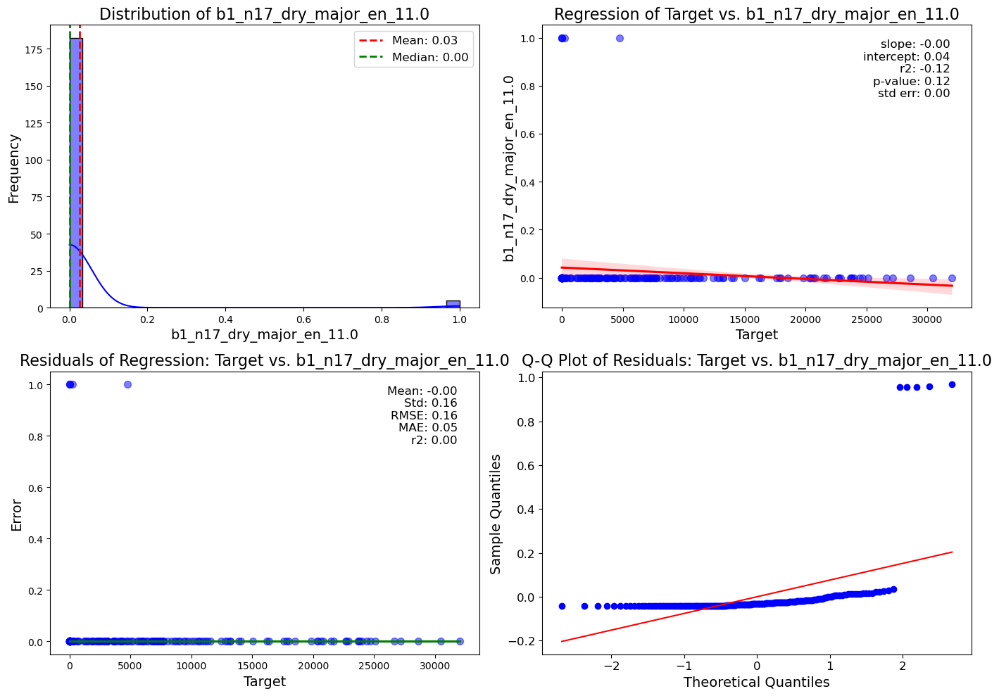

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_n17_dry_major_en_11.0_0_combined_plot_tr.JPG


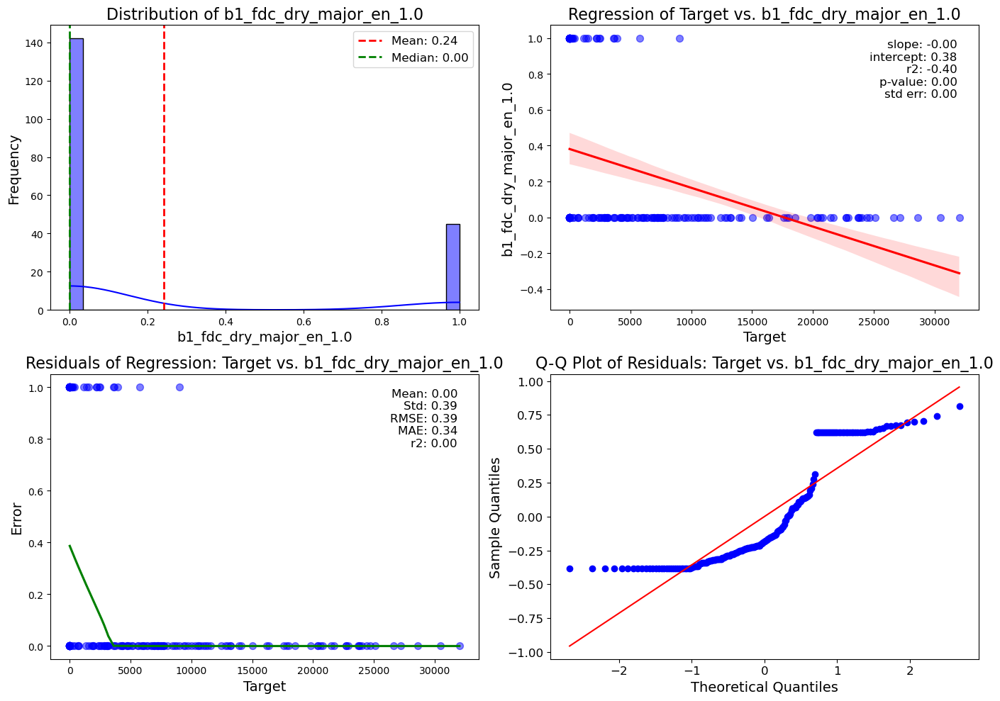

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_fdc_dry_major_en_1.0_0_combined_plot_tr.JPG


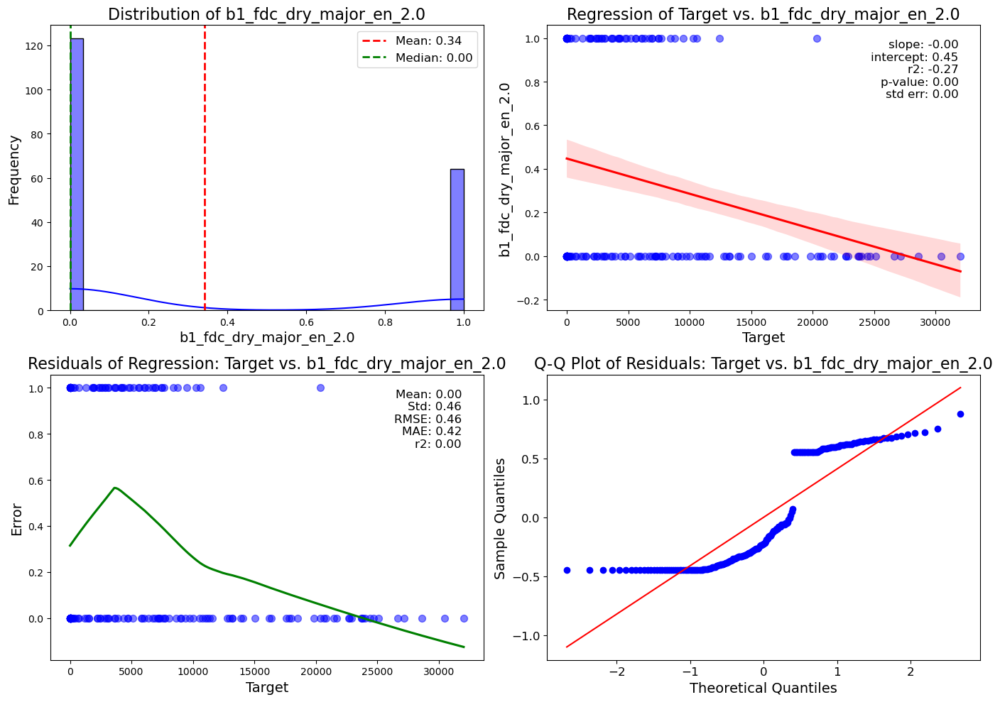

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_fdc_dry_major_en_2.0_0_combined_plot_tr.JPG


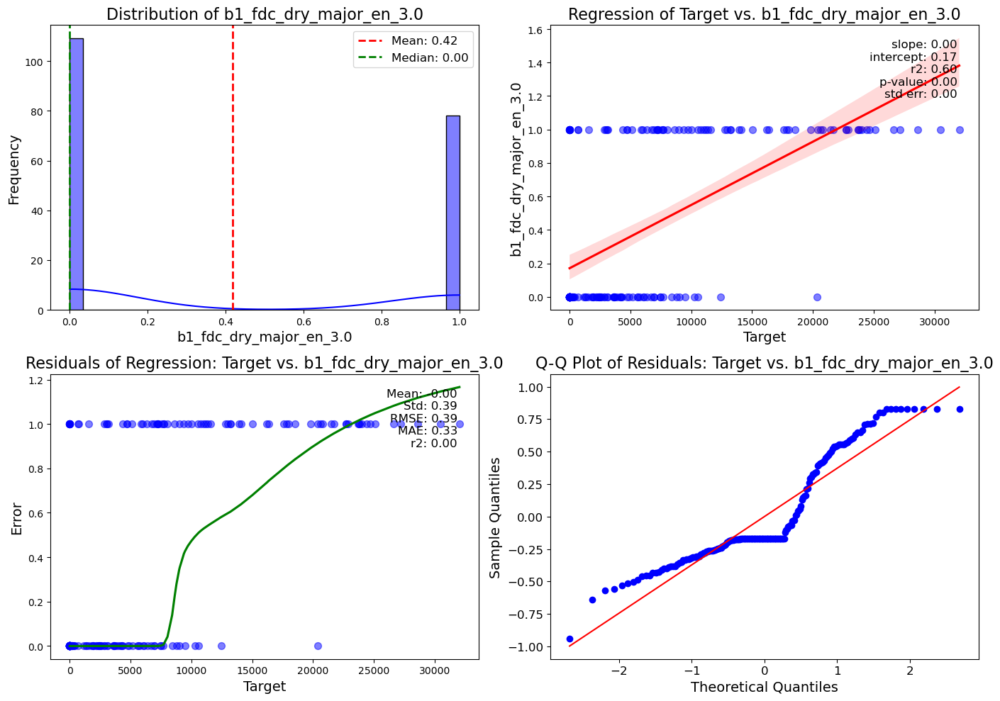

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_fdc_dry_major_en_3.0_0_combined_plot_tr.JPG


In [64]:
df = df_ml

def plot_with_mean_median(df, columns):
    for col in columns:
        plt.figure(figsize=(14, 10))

        # Top-left plot: Distribution with mean and median
        plt.subplot(2, 2, 1)
        sns.histplot(df[col], kde=True, color='blue', bins=30)
        
        # Calculate mean and median
        mean = df[col].mean()
        median = df[col].median()
        
        # Plot mean and median as dashed lines
        plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
        plt.axvline(median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median:.2f}')
        
        plt.title(f'Distribution of {col}', fontsize=16)
        plt.xlabel(col, fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.legend(fontsize=12)
        
        # Top-right plot: Regression plot
        value_x = 'target'
        C_value_x = "Target"
        value_y_loop = col

        plt.subplot(2, 2, 2)
        sns.regplot(data=df_ml, x=value_x, y=value_y_loop, line_kws={"color": "red"}, scatter_kws={'s': 50, 'alpha': 0.5, 'color': 'blue'})
        plt.xlabel(C_value_x, fontsize=14)
        plt.ylabel(value_y_loop, fontsize=14)
        plt.title(f"Regression of {C_value_x} vs. {value_y_loop}", fontsize=16)

        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_ml[value_x], df_ml[value_y_loop])

        # Annotate the stats
        plt.text(0.95, 0.95, f'slope: {slope:.2f}\nintercept: {intercept:.2f}\nr2: {r_value:.2f}\np-value: {p_value:.2f}\nstd err: {std_err:.2f}',
                 transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='right', fontsize=12)

        # Bottom-left plot: Residuals plot
        plt.subplot(2, 2, 3)
        sns.regplot(data=df_ml, x=value_x, y=value_y_loop, lowess=True, line_kws={"color": "green"}, scatter_kws={'s': 50, 'alpha': 0.5, 'color': 'blue'})
        plt.xlabel(C_value_x, fontsize=14)
        plt.ylabel("Error", fontsize=14)
        plt.title(f"Residuals of Regression: {C_value_x} vs. {value_y_loop}", fontsize=16)

        residuals = df_ml[value_y_loop] - (slope * df_ml[value_x] + intercept)

        # Compute additional residual statistics
        mean_res = np.mean(residuals)
        std_res = np.std(residuals)
        rmse_res = np.sqrt(np.mean(residuals**2))
        mae_res = np.mean(np.abs(residuals))
        r2_res = scipy.stats.linregress(df_ml[value_x], residuals)[2]**2

        # Annotate the residual stats
        plt.text(0.95, 0.95, f'Mean: {mean_res:.2f}\nStd: {std_res:.2f}\nRMSE: {rmse_res:.2f}\nMAE: {mae_res:.2f}\nr2: {r2_res:.2f}',
                 transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='right', fontsize=12)

        # Bottom-right plot: Q-Q plot
        plt.subplot(2, 2, 4)
        scipy.stats.probplot(residuals, dist="norm", plot=plt)
        plt.title(f"Q-Q Plot of Residuals: {C_value_x} vs. {value_y_loop}", fontsize=16)
        
        # Increase font size for Q-Q plot
        plt.xlabel('Theoretical Quantiles', fontsize=14)
        plt.ylabel('Sample Quantiles', fontsize=14)
        plt.tick_params(axis='both', which='major', labelsize=12)

        plt.tight_layout()

        # Save the plot
        plt_out = os.path.join(output, "plots", f"{var_}_{mdl}_{value_y_loop}_{rs}_combined_plot_tr.JPG")
        plt.savefig(plt_out, dpi=300)
        plt.show()
        print("plot: ", plt_out)
        plt.close()

# Assuming df_ml.columns[1:] contains the columns to be plotted
plot_with_mean_median(df, df_ml.columns[1:])

plt.close('all')

In [65]:
df = df_ml

def plot_with_mean_median(df, columns):
    for col in columns:
        plt.figure(figsize=(14, 10))

        # Top-left plot: Distribution with mean and median
        plt.subplot(2, 2, 1)
        sns.histplot(df[col], kde=True, color='blue', bins=30)
        
        # Calculate mean and median
        mean = df[col].mean()
        median = df[col].median()
        
        # Plot mean and median as dashed lines
        plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
        plt.axvline(median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median:.2f}')
        
        plt.title(f'Distribution of {col}', fontsize=16)
        plt.xlabel(col, fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.legend(fontsize=12)
        
        # Top-right plot: Regression plot
        value_x = 'target'
        C_value_x = 'Target'
        value_y_loop = col

        plt.subplot(2, 2, 2)
        sns.regplot(data=df_ml, x=value_x, y=value_y_loop, line_kws={"color": "red"}, scatter_kws={'s': 50, 'alpha': 0.5, 'color': 'blue'})
        plt.xlabel(C_value_x, fontsize=14)
        plt.ylabel(value_y_loop, fontsize=14)
        plt.title(f"Regression of {C_value_x} vs. {value_y_loop}", fontsize=16)

        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_ml[value_x], df_ml[value_y_loop])

        # Annotate the stats
        plt.text(0.95, 0.05, f'slope: {slope:.2f}\nintercept: {intercept:.2f}\nr2: {r_value:.2f}\np-value: {p_value:.2f}\nstd err: {std_err:.2f}',
                 transform=plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='right', fontsize=12)

        # Bottom-left plot: Residuals plot
        plt.subplot(2, 2, 3)
        sns.regplot(data=df_ml, x=value_x, y=value_y_loop, lowess=True, line_kws={"color": "green"}, scatter_kws={'s': 50, 'alpha': 0.5, 'color': 'blue'})
        plt.xlabel(C_value_x, fontsize=14)
        plt.ylabel("Error", fontsize=14)
        plt.title(f"Residuals of Regression: {C_value_x} vs. {value_y_loop}", fontsize=16)

        residuals = df_ml[value_y_loop] - (slope * df_ml[value_x] + intercept)

        # Compute additional residual statistics
        mean_res = np.mean(residuals)
        std_res = np.std(residuals)
        rmse_res = np.sqrt(np.mean(residuals**2))
        mae_res = np.mean(np.abs(residuals))
        r2_res = scipy.stats.linregress(df_ml[value_x], residuals)[2]**2

        # Annotate the residual stats
        plt.text(0.95, 0.05, f'Mean: {mean_res:.2f}\nStd: {std_res:.2f}\nRMSE: {rmse_res:.2f}\nMAE: {mae_res:.2f}\nr2: {r2_res:.2f}',
                 transform=plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='right', fontsize=12)

        # Bottom-right plot: Q-Q plot
        plt.subplot(2, 2, 4)
        scipy.stats.probplot(residuals, dist="norm", plot=plt)
        plt.title(f"Q-Q Plot of Residuals: {C_value_x} vs. {value_y_loop}", fontsize=16)
        
        # Increase font size for Q-Q plot
        plt.xlabel('Theoretical Quantiles', fontsize=14)
        plt.ylabel('Sample Quantiles', fontsize=14)
        plt.tick_params(axis='both', which='major', labelsize=12)

        plt.tight_layout()

        # Save the plot
        plt_out = os.path.join(output, "plots", f"{var_}_{mdl}_{value_y_loop}_{rs}_combined_plot_br.JPG")
        plt.savefig(plt_out, dpi=300)
        #plt.show()
        print("plot: ", plt_out)
        plt.close()

# Assuming df_ml.columns[1:] contains the columns to be plotted
plot_with_mean_median(df, df_ml.columns[1:])

plt.close('all')

plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_wfp_dry_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hsd_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hmc_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_hcv_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_h99_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_ccw_dry_p99_0_combined_plot_br.JPG
plot:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_b1_dp1fm_dry_p99_0_combined_plot_br.JPG
plot: 

# Model

### Split off unseen test and train data

In [66]:
#select random state
#rs = 0

# randomly split data into train and test datasets, the user needs to define the variables 
xdata1 = df_ml.iloc[:, 1:].astype('float32')
ydata1 = df_ml[[value_x]].astype('float32')
ydata2 = ydata1.values
ydata = ydata2.ravel()
#y_data_float=ydata.astype("float32")
x_unseen, x_remaining, y_unseen, y_remaining = train_test_split(xdata1, ydata, train_size=0.20, random_state=rs) 
x_train, x_test, y_train, y_test = train_test_split(x_remaining, y_remaining, train_size=0.70, random_state=rs)  
print(x_unseen.shape, y_unseen.shape)
print("remaining.....")
print(x_remaining.shape, y_remaining.shape)
print("-"*50)
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(37, 51) (37,)
remaining.....
(150, 51) (150,)
--------------------------------------------------
(105, 51) (105,)
(45, 51) (45,)


In [67]:

from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error


# Scale the input features
#scaler_X = MinMaxScaler()
scaler_X = StandardScaler()
x_train_scaled = scaler_X.fit_transform(x_train)
x_test_scaled = scaler_X.transform(x_test)
x_unseen_scaled = scaler_X.transform(x_unseen)

# Scale the target variable
scaler_y = MinMaxScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()
y_unseen_scaled = scaler_y.transform(y_unseen.reshape(-1, 1)).flatten()


In [68]:
x_train_scaled

array([[-0.68447846,  0.42384744, -0.44814047, ..., -0.48507127,
         1.3008873 , -0.88298416],
       [-0.8886388 , -0.62485594, -0.57713836, ..., -0.48507127,
         1.3008873 , -0.88298416],
       [ 1.0645654 ,  1.7443684 ,  1.2693096 , ..., -0.48507127,
        -0.76870614,  1.1325232 ],
       ...,
       [-0.31614786, -0.46892852, -0.3728758 , ..., -0.48507127,
         1.3008873 , -0.88298416],
       [ 0.38473257,  0.8406686 ,  0.50287306, ..., -0.48507127,
        -0.76870614,  1.1325232 ],
       [-1.2990644 , -0.6003332 , -0.7869205 , ...,  2.0615528 ,
        -0.76870614, -0.88298416]], dtype=float32)

### Plot up Histograms for train and test datasets

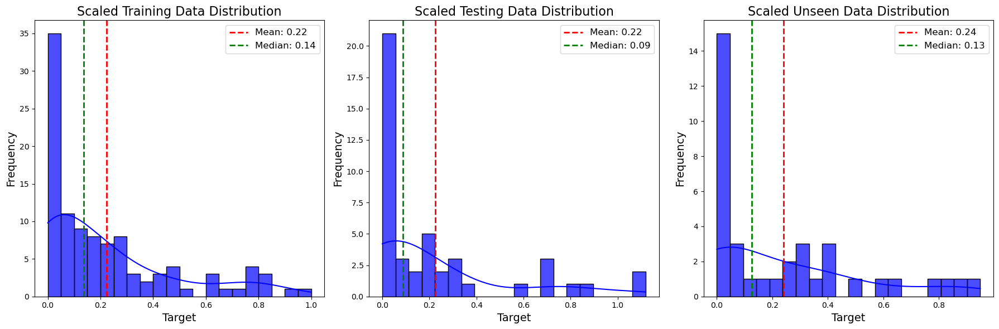

saved to:  C:\Users\robot\projects\biomass\model\keras_all_data_sddv3_h99\plots\keras_all_data_sddv3_h99_mlpr_0_train_test_unseen_distribution.JPG


In [69]:
import numpy as np
# output = '.'  # Replace with your actual output directory
# var_ = 'example_var'
# mdl = 'example_model'
# rs = 'example_run'

# Create subplots: 1 row, 3 columns
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust figsize as needed

# Define the data and titles for each subplot
data = [y_train_scaled, y_test_scaled, y_unseen_scaled]
titles = ['Scaled Training Data Distribution', 'Scaled Testing Data Distribution', 'Scaled Unseen Data Distribution']

for i, (data_set, title) in enumerate(zip(data, titles)):
    mean = np.mean(data_set)
    median = np.median(data_set)
    
    # Plot histogram with seaborn
    sns.histplot(data_set, kde=True, bins=20, ax=axs[i], color='blue', alpha=0.7)
    
    # Plot mean and median lines
    axs[i].axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
    axs[i].axvline(median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median:.2f}')
    
    axs[i].set_title(title, fontsize=16)
    axs[i].set_xlabel('Target', fontsize=14)
    axs[i].set_ylabel('Frequency', fontsize=14)
    axs[i].legend(fontsize=12)

# Adjust layout
plt.tight_layout()

# Save the figure
out = os.path.join(output, "plots", f"{var_}_{mdl}_{rs}_train_test_unseen_distribution.JPG")
plt.savefig(out, dpi=300)
plt.show()

print("saved to: ", out)

### Parameterise the Random Forest Regressor algorithm

for details see: http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html

In [70]:
print(ydata)

[0.00000000e+00 0.00000000e+00 2.46708008e+04 3.08615991e+03
 2.83203198e+03 0.00000000e+00 0.00000000e+00 6.65280029e+02
 0.00000000e+00 6.00600000e+03 0.00000000e+00 0.00000000e+00
 0.00000000e+00 4.26887988e+03 3.08615991e+03 1.34904004e+03
 7.39199982e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.89419995e+03 6.91222021e+03
 9.99550977e+03 6.94678271e+03 7.65854248e+03 9.38175000e+03
 4.21067480e+03 7.20719971e+02 8.76869043e+03 0.00000000e+00
 2.43936011e+03 7.27558984e+03 2.39804609e+04 1.79947598e+04
 3.12312012e+03 7.47858984e+03 1.07633223e+04 0.00000000e+00
 2.66362949e+04 2.14691406e+04 2.26993906e+04 1.11804004e+04
 3.74219995e+03 0.00000000e+00 1.29608154e+04 1.40824375e+04
 1.32178555e+04 0.00000000e+00 2.21760010e+03 0.00000000e+00
 3.64839307e+03 4.72399902e+03 7.71539990e+03 9.70896484e+03
 4.71718799e+03 1.61970898e+04 1.27756299e+04 4.87277686e+03
 8.03145020e+03 3.156902

In [ ]:
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import numpy as np

import warnings
from sklearn.exceptions import ConvergenceWarning

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# Define custom scorer for RMSE
def custom_rmse_scorer(y_true, y_pred):
    rmse = -np.sqrt(mean_squared_error(y_true, y_pred))
    return rmse

# Define custom scorer for MAE
def custom_mae_scorer(y_true, y_pred):
    mae = -mean_absolute_error(y_true, y_pred)
    return mae

# Define custom scorer for R2
def custom_r2_scorer(y_true, y_pred):
    y_mean = np.mean(y_true)
    ss_residual = np.sum((y_true - y_pred) ** 2)
    ss_total = np.sum((y_true - y_mean) ** 2)
    r2 = 1 - (ss_residual / ss_total)
    return r2

# Make it a scorer
rmse_scorer = make_scorer(custom_rmse_scorer)
mae_scorer = make_scorer(custom_mae_scorer)
r2_scorer = make_scorer(custom_r2_scorer)

# Define the parameter grid for MLPRegressor
param_grid_mlp = {
    'mlp__hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'mlp__activation': ['tanh', 'relu'],
    'mlp__solver': ['sgd', 'adam', 'lbfgs'],
    'mlp__alpha': [0.0001, 0.05],
    'mlp__learning_rate': ['constant', 'adaptive'],
}

# Create a pipeline that scales the data then fits the model
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=100000))
])

# Choose model based on 'mdl'
if mdl == "rfr":
    # Define model
    model = rfr()

    # Define parameter grid
    param_grid = {
        'n_estimators': [2, 5, 10, 30, 40, 50, 100, 150, 200, 300],
        'max_depth': [None, 2, 3, 4, 5, 10, 20],
        'max_features': ['auto', 'sqrt'],
        'bootstrap': [True, False]
    }
elif mdl == "gbr":
    # Define model
    model = gbr()

    # Define parameter grid
    param_grid = {
        'n_estimators': [2, 5, 10, 30, 40, 50, 100, 150, 200, 300],
        'learning_rate': [0.01, 0.1, 1.0],
    }
elif mdl == "abr":
    # Define model
    model = abr()

    # Define parameter grid
    param_grid = {
        'n_estimators': [2, 5, 10, 30, 40, 50, 100, 150, 200, 300],
        'learning_rate': [0.01, 0.1, 1.0],
    }
elif mdl == "mlpr":
    model = pipeline_mlp
    param_grid = param_grid_mlp
else:
    print("ERROR__" * 100)

# Create GridSearchCV object with RMSE scoring
grid_search_rmse = GridSearchCV(model, param_grid, scoring=rmse_scorer, cv=5) #KFold(n_splits=5))
grid_search_rmse.fit(x_train, y_train)

print(mdl)
print("-" * 100)
print("RMSE Best Score: ", grid_search_rmse.best_score_)
print("RMSE Best Parameters: ", grid_search_rmse.best_params_)

# Create GridSearchCV object with MAE scoring
grid_search_mae = GridSearchCV(model, param_grid, scoring=mae_scorer, cv=5)# KFold(n_splits=5))
grid_search_mae.fit(x_train, y_train)

print("MAE Best Score: ", grid_search_mae.best_score_)
print("MAE Best Parameters: ", grid_search_mae.best_params_)

# Create GridSearchCV object with r2 scoring
grid_search_r2 = GridSearchCV(model, param_grid, scoring="r2", cv=5)# KFold(n_splits=5))
grid_search_r2.fit(x_train, y_train)

print("r2 Best Score: ", grid_search_r2.best_score_)
print("r2 Best Parameters: ", grid_search_r2.best_params_)

In [ ]:
# Get best RMSE parameters
#best_params = grid_search_rmse.best_params_
best_model = grid_search_rmse.best_estimator_
fac = "RMSE"
print("RMSE Best Score: ", grid_search_rmse.best_score_)
print("RMSE Best Parameters: ", grid_search_rmse.best_params_)
score = rmse_scorer
print(best_model)

In [ ]:
# Get best MAE parameters
#best_params = grid_search_rmse.best_params_
best_model = grid_search_mae.best_estimator_
fac = "MAE"
print("MAE Best Score: ", grid_search_mae.best_score_)
print("MAE Best Parameters: ", grid_search_mae.best_params_)
score = mae_scorer
print(best_model)

In [ ]:
# Get best R2 parameters
#best_params = grid_search_rmse.best_params_
best_model = grid_search_r2.best_estimator_
fac = "r2"
print("r2 Best Score: ", grid_search_r2.best_score_)
print("r2 Best Parameters: ", grid_search_r2.best_params_)
score = "r2"
print(best_model)

In [ ]:
print(best_model)

In [ ]:
#print(grid_search_mae.best_estimator_)

### Enter manualy when required

In [ ]:
#Manual 
#best_model = rfr(n_estimators=100)

### Fit regressor model and compute variable importance score 

may need to restrict the number of variables for the bar graph to be legible



In [ ]:
#tree_model = best_model.fit(X_1, y_1)
tree_model = best_model.fit(x_train, y_train)

##### good info on the feature importance score - http://stackoverflow.com/questions/15810339/how-are-feature-importances-in-randomforestclassifier-determined

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# Ensure x_train, x_test, y_train, y_test are defined

# Create and fit the model
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=10000, random_state=rs, hidden_layer_sizes=(100, 50),))
])

# Define parameter grid for GridSearchCV
param_grid = {
    'mlp__hidden_layer_sizes': [(50, 25), (100, 50), (150, 75)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__solver': ['adam', 'lbfgs'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate': ['constant', 'adaptive']
}

# Define GridSearchCV with r2 scoring
grid_search = GridSearchCV(model, param_grid, scoring='r2', cv=5)

# Fit GridSearchCV
grid_search.fit(x_train, y_train)

# Extract the best model
best_model = grid_search.best_estimator_

# Evaluate the model on the training data
y_train_pred = best_model.predict(x_train)
y_test_pred = best_model.predict(x_test)

# Compute permutation importance
results = permutation_importance(best_model, x_test, y_test, scoring='r2')
importances = results.importances_mean

# Get feature importance scores
indices = np.argsort(importances)[::-1]
feature_names = x_train.columns

# Limit to the top 20 features
top_n = 20
top_indices = indices[:top_n]
top_importances = importances[top_indices]
top_features = feature_names[top_indices]

# Plot feature importances horizontally
plt.figure(figsize=(10, 6))
plt.title("Top 20 Feature Importances")
plt.barh(range(top_n), top_importances, align="center")
plt.yticks(range(top_n), top_features)
plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

# Print top 20 feature importances
print("Top 20 Feature Importances:")
for i in range(top_n):
    print(f"{i + 1}. {top_features[i]} ({top_importances[i]})")

# Extract top 12 performing features
top_12_indices = indices[:12]
top_12_importances = importances[top_12_indices]
top_12_features = feature_names[top_12_indices]

# Create a list of the top 12 performing features
top_12_performing_features = [(top_12_features[i], top_12_importances[i]) for i in range(12)]
print("\nTop 12 Performing Features:")
for i, (feature, importance) in enumerate(top_12_performing_features):
    print(f"{i + 1}. {feature}: {importance}")

# Prepare to plot observed vs. predicted values for training data
r2_train = round(r2_score(y_train, y_train_pred), 2)
mse_train = round(mean_squared_error(y_train, y_train_pred), 2)
rmse_train = round(np.sqrt(mse_train), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, y_train, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x_train_line = [min(y_train_pred.min(), y_train.min()) - 500, max(y_train_pred.max(), y_train.max()) + 500]
y_train_line = x_train_line

# Sets the limits of the axis
plt.xlim(x_train_line[0], x_train_line[1])
plt.ylim(x_train_line[0], x_train_line[1])

plt.plot(x_train_line, y_train_line, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Training Data Used in MLP Regressor Evaluation', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2_train:.2f}\nMSE: {mse_train:.2f}\nRMSE: {rmse_train:.2f}\nn: {len(y_train)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the training plot
train_plot_out = os.path.join("output_path", "mlp_regressor_train_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(train_plot_out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved training plot to: ", train_plot_out)

# Prepare to plot observed vs. predicted values for test data
r2_test = round(r2_score(y_test, y_test_pred), 2)
mse_test = round(mean_squared_error(y_test, y_test_pred), 2)
rmse_test = round(np.sqrt(mse_test), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred, y_test, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x_test_line = [min(y_test_pred.min(), y_test.min()) - 500, max(y_test_pred.max(), y_test.max()) + 500]
y_test_line = x_test_line

# Sets the limits of the axis
plt.xlim(x_test_line[0], x_test_line[1])
plt.ylim(x_test_line[0], x_test_line[1])

plt.plot(x_test_line, y_test_line, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Test Data Used in MLP Regressor Evaluation', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2_test:.2f}\nMSE: {mse_test:.2f}\nRMSE: {rmse_test:.2f}\nn: {len(y_test)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the test plot
test_plot_out = os.path.join("output_path", "mlp_regressor_test_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(test_plot_out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved test plot to: ", test_plot_out)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.inspection import permutation_importance
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

# Define your training and test data
# Ensure you have x_train, x_test, y_train, y_test defined

# Create and fit the model
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=10000, random_state=rs, hidden_layer_sizes=(100, 50),))
])

# r2 Best Score:  -0.682634430543344
# r2 Best Parameters:  {'mlp__hidden_layer_sizes': (100, 50)}
# Pipeline(steps=[('scaler', StandardScaler()),
#                 ('mlp',
#                  MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=100000))])

pipeline_mlp.fit(x_train, y_train)

# Evaluate the model
y_train_pred = pipeline_mlp.predict(x_train)
y_test_pred = pipeline_mlp.predict(x_test)

# Compute permutation importance
results = permutation_importance(pipeline_mlp, x_test, y_test, scoring='r2')
importances = results.importances_mean

# Get feature importance scores
indices = np.argsort(importances)[::-1]
feature_names = x_train.columns

# Limit to the top 20 features
top_n = 20
top_indices = indices[:top_n]
top_importances = importances[top_indices]
top_features = feature_names[top_indices]

# Plot feature importances horizontally
plt.figure(figsize=(10, 6))
plt.title("Top 20 Feature Importances")
plt.barh(range(top_n), top_importances, align="center")
plt.yticks(range(top_n), top_features)
plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

# Print top 20 feature importances
print("Top 20 Feature Importances:")
for i in range(top_n):
    print(f"{i + 1}. {top_features[i]} ({top_importances[i]})")

# Prepare to plot observed vs. predicted values
r2 = round(pipeline_mlp.score(x_train, y_train), 2)
mse = round(mean_squared_error(y_train, y_train_pred), 2)
rmse = round(np.sqrt(mse), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, y_train, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x = [-500, 40000]
y = [-500, 40000]

# Sets the limits of the axis
plt.xlim(-500, 40000)
plt.ylim(-500, 40000)

plt.plot(x, y, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Training Data Used in MLP Regressor Training', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_train)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the plot
out = os.path.join(output, "mlp_regressor_train_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved to: ", out)

In [ ]:
# Prepare to plot observed vs. predicted values for test data
r2_test = round(r2_score(y_test, y_test_pred), 2)
mse_test = round(mean_squared_error(y_test, y_test_pred), 2)
rmse_test = round(np.sqrt(mse_test), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred, y_test, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x_test_line = [min(y_test_pred.min(), y_test.min()) - 500, max(y_test_pred.max(), y_test.max()) + 500]
y_test_line = x_test_line

# Sets the limits of the axis
plt.xlim(x_test_line[0], x_test_line[1])
plt.ylim(x_test_line[0], x_test_line[1])

plt.plot(x_test_line, y_test_line, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Test Data Used in MLP Regressor Evaluation', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2_test:.2f}\nMSE: {mse_test:.2f}\nRMSE: {rmse_test:.2f}\nn: {len(y_test)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the test plot
test_plot_out = os.path.join(output, "mlp_regressor_test_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(test_plot_out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved test plot to: ", test_plot_out)

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import os
# from sklearn.inspection import permutation_importance
# from sklearn.metrics import mean_squared_error

# # Ensure x_train, x_test, y_train, y_test are defined
# # Fit the best_model to the training data
# best_model.fit(x_train, y_train)

# # Evaluate the model on the test data
# y_test_pred = best_model.predict(x_test)

# # Compute permutation importance
# results = permutation_importance(best_model, x_test, y_test, scoring=score)
# importances = results.importances_mean

# # Get feature importance scores
# indices = np.argsort(importances)[::-1]
# feature_names = x_train.columns

# # Limit to the top 20 features
# top_n = 20
# top_indices = indices[:top_n]
# top_importances = importances[top_indices]
# top_features = feature_names[top_indices]

# # Plot feature importances horizontally
# plt.figure(figsize=(10, 6))
# plt.title("Top 20 Feature Importances")
# plt.barh(range(top_n), top_importances, align="center")
# plt.yticks(range(top_n), top_features)
# plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
# plt.xlabel('Importance')
# plt.ylabel('Features')
# plt.show()

# # Print top 20 feature importances
# print("Top 20 Feature Importances:")
# for i in range(top_n):
#     print(f"{i + 1}. {top_features[i]} ({top_importances[i]})")

# # Prepare to plot observed vs. predicted values
# r2 = round(best_model.score(x_test, y_test), 2)
# mse = round(mean_squared_error(y_test, y_test_pred), 2)
# rmse = round(np.sqrt(mse), 2)

# plt.figure(figsize=(10, 6))
# plt.scatter(y_test_pred, y_test, s=70, alpha=0.5, color='blue', edgecolors='w')

# # Data for the 1:1 line
# x = [-500, 40000]
# y = [-500, 40000]

# # Sets the limits of the axis
# plt.xlim(-500, 40000)
# plt.ylim(-500, 40000)

# plt.plot(x, y, color='red')

# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title('Test Data Used in MLP Regressor Evaluation', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_test)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# # Save the plot
# out = os.path.join(output, "mlp_regressor_test_plot.JPG")  # Ensure "output_path" is defined
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()

# print("Saved to: ", out)

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import os
# from sklearn.inspection import permutation_importance
# from sklearn.metrics import mean_squared_error
# from sklearn.pipeline import Pipeline
# from sklearn.preprocessing import StandardScaler
# from sklearn.neural_network import MLPRegressor

# # Define your training and test data
# # Ensure you have x_train, x_test, y_train, y_test defined

# # Create the best_model pipeline with StandardScaler and MLPRegressor
# best_model = Pipeline([
#     ('scaler', StandardScaler()),
#     ('mlp', MLPRegressor(activation='tanh', hidden_layer_sizes=(100, 50), max_iter=100000))
# ])

# # Fit the best_model to the training data
# best_model.fit(x_train, y_train)

# # Evaluate the model on the test data
# y_test_pred = best_model.predict(x_test)

# # Compute permutation importance
# results = permutation_importance(best_model, x_test, y_test, scoring=score)
# importances = results.importances_mean

# # Get feature importance scores
# indices = np.argsort(importances)[::-1]
# feature_names = x_train.columns

# # Limit to the top 20 features
# top_n = 20
# top_indices = indices[:top_n]
# top_importances = importances[top_indices]
# top_features = feature_names[top_indices]

# # Plot feature importances horizontally
# plt.figure(figsize=(10, 6))
# plt.title("Top 20 Feature Importances")
# plt.barh(range(top_n), top_importances, align="center")
# plt.yticks(range(top_n), top_features)
# plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
# plt.xlabel('Importance')
# plt.ylabel('Features')
# plt.show()

# # Print top 20 feature importances
# print("Top 20 Feature Importances:")
# for i in range(top_n):
#     print(f"{i + 1}. {top_features[i]} ({top_importances[i]})")

# # Prepare to plot observed vs. predicted values
# r2 = round(best_model.score(x_test, y_test), 2)
# mse = round(mean_squared_error(y_test, y_test_pred), 2)
# rmse = round(np.sqrt(mse), 2)

# plt.figure(figsize=(10, 6))
# plt.scatter(y_test_pred, y_test, s=70, alpha=0.5, color='blue', edgecolors='w')

# # Data for the 1:1 line
# x = [min(y_test_pred.min(), y_test.min()) - 500, max(y_test_pred.max(), y_test.max()) + 500]
# y = x

# # Sets the limits of the axis
# plt.xlim(x[0], x[1])
# plt.ylim(x[0], x[1])

# plt.plot(x, y, color='red')

# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title('Test Data Used in MLP Regressor Evaluation', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_test)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# # Save the plot
# out = os.path.join(output, "mlp_regressor_test_plot.JPG")  # Ensure "output_path" is defined
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()

# print("Saved to: ", out)

In [ ]:
# plt.figure(figsize=(10, 6))
# feature_importance = tree_model.feature_importances_

# ### TRY THIS
# # use "feature importance" scores to see what the top 10 important features are
# fi = enumerate(tree_model.feature_importances_)
# cols = xdata1.columns
# fiResult = [(value,cols[i]) for (i,value) in fi]

# r2 = round(tree_model.score(x_train, y_train),2)
# mse = round(np.mean((y_train - tree_model.predict(x_train))**2), 2)
# rmse = round(np.sqrt(np.mean((y_train - tree_model.predict(x_train))**2)), 2)
              

# plt.scatter(tree_model.predict(x_train), y_train, s= 70, alpha=0.5, color='blue', edgecolors='w')  
# # data for the 1 for 1 line
# x = [-500,40000]
# y = [-500,40000]

# #sets the limits of the axis
# plt.xlim(-500,40000)
# plt.ylim(-500, 40000)

# plt.plot(x, y, color='red')#, linestyle='dashed', linewidth=2)

# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title(f'Training Data Used in {model_name} Training', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_train)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# out = os.path.join(output, "{0}_{1}_{2}_{3}_train.JPG".format(var_, mdl, fac, str(rs)))
# #print(out)                   
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()

# print("saved to: ", out)

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import os
# from sklearn.inspection import permutation_importance
# from sklearn.neural_network import MLPRegressor
# from sklearn.preprocessing import StandardScaler
# from sklearn.pipeline import Pipeline
# from sklearn.metrics import mean_squared_error

# # Define your training and test data
# # Ensure you have x_train, x_test, y_train, y_test defined

# # Create and fit the model
# pipeline_mlp = Pipeline([
#     ('scaler', StandardScaler()),
#     ('mlp', MLPRegressor(max_iter=10000, random_state=rs))
# ])

# pipeline_mlp.fit(x_train, y_train)

# # Evaluate the model
# y_train_pred = pipeline_mlp.predict(x_train)
# y_test_pred = pipeline_mlp.predict(x_test)

# # Compute permutation importance
# results = permutation_importance(pipeline_mlp, x_test, y_test, scoring=score)
# importances = results.importances_mean

# # Get feature importance scores
# indices = np.argsort(importances)[::-1]
# feature_names = x_train.columns

# # Limit to the top 20 features
# top_n = 20
# top_indices = indices[:top_n]
# top_importances = importances[top_indices]
# top_features = feature_names[top_indices]

# # Plot feature importances horizontally
# plt.figure(figsize=(10, 6))
# plt.title("Feature Importances")
# plt.barh(range(x_train.shape[1]), importances[indices], align="center")
# plt.yticks(range(x_train.shape[1]), feature_names[indices])
# plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
# plt.xlabel('Importance')
# plt.ylabel('Features')
# plt.show()

# # Prepare to plot observed vs. predicted values
# r2 = round(pipeline_mlp.score(x_train, y_train), 2)
# mse = round(mean_squared_error(y_train, y_train_pred), 2)
# rmse = round(np.sqrt(mse), 2)

# plt.figure(figsize=(10, 6))
# plt.scatter(y_train_pred, y_train, s=70, alpha=0.5, color='blue', edgecolors='w')

# # Data for the 1:1 line
# x = [-500, 40000]
# y = [-500, 40000]

# # Sets the limits of the axis
# plt.xlim(-500, 40000)
# plt.ylim(-500, 40000)

# plt.plot(x, y, color='red')

# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title('Training Data Used in MLP Regressor Training', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_train)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# # Save the plot
# out = os.path.join("output_path", "mlp_regressor_train_plot.JPG")  # Ensure "output_path" is defined
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()

# print("Saved to: ", out)

In [ ]:
# plt.figure(figsize=(10, 6))
# y2_predict = tree_model.predict(x_test)

# r2 = round(tree_model.score(x_test, y_test),2)
# mse = round(np.mean((y_test - tree_model.predict(x_test))** 2), 2)
# rmse = round(np.sqrt(np.mean((y2_predict - y_test) ** 2)), 2)
# bias = round(np.mean(y_test) - np.mean(y2_predict), 2)
# var = round(explained_variance_score(y_test, y2_predict), 2)

# plt.scatter(y2_predict, y_test, s= 70, alpha=0.5, color='blue', edgecolors='w')# ,s=10, c='b', marker='o')
# # data for the 1 for 1 line
# x = [-500,40000]
# y = [-500,40000]

# #sets the limits of the axis
# plt.xlim(-500,40000)
# plt.ylim(-500, 40000)
# # plt.ylabel('Observed AGB')
# # plt.xlabel('Predicted AGB')
# # plt.title(f'Testing data: {mdl}')
# # 1 for 1 line
# plt.plot(x, y, color = 'r')



# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title(f'Testing Data Used in {model_name} Training', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nBias: {bias:.2f}\nn: {len(y_test)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# # Explained variance is R2
# out_plot = os.path.join(output, "{0}_{1}_{2}_{3}_test_data.JPG".format(var_, mdl, fac, str(rs)))
# # Save the plot
# plt.savefig(out_plot, dpi=300)
# plt.show()
# print("Plot: ", out_plot)

In [ ]:
# # Generate feature importance and related data
# fi = enumerate(feature_importance)
# cols = xdata1.columns
# fiResult = np.array([(value, cols[i]) for (i, value) in fi])

# score = fiResult[:, 0].astype(float)
# score_4 = np.around(score, decimals=4)
# band = fiResult[:, 1]

# df_band = pd.DataFrame(dict(band=band, n=score_4))
# df_band['n'] = df_band['n'].astype(float)
# dfsort = df_band.sort_values(['n'], ascending=[False]).head(20)  # Select top 20 features

# ind = np.arange(len(dfsort))
# width = 0.4

# # Increase figure size
# fig, ax = plt.subplots(figsize=(12, 8))

# # Bar plot
# ax.barh(ind, dfsort['n'], width, color='blue')

# # Adjust y-tick labels
# wrapped_labels = [textwrap.fill(label, 10) for label in dfsort['band']]
# ax.set(yticks=ind, yticklabels=wrapped_labels, ylim=[-1, len(dfsort)])
# ax.set_xlabel('Importance Score', fontsize=12)
# ax.set_ylabel('Features', fontsize=12)
# ax.set_title(f'Top 20 Feature Importance ({model_name})', fontsize=14)

# # Reverse the order of y-axis to display highest to lowest
# ax.invert_yaxis()

# # Adjust layout
# plt.tight_layout()

# out = os.path.join(output, f"{var_}_{fac}_{mdl}_Top20_Feature_Importance_Score.JPG")
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()
# print(out)

In [ ]:
# plt.figure(figsize=(12, 8))
# fiResult = np.array(fiResult)
# score = (fiResult[:,0])
# arr_unicode =score
# # Convert Unicode strings to float values
# arr_float = arr_unicode.astype(np.float)

# # Round float values to two decimal places
# score_4 = np.around(arr_float, decimals=4)

# band = fiResult[:,1]
# a = fiResult[np.argsort(fiResult[:, 1])]

# df_band = pd.DataFrame(dict(band=band,n=score_4))
# df_band['n'].astype('float')
# dfsort = df_band.sort_values(['n'], ascending=[False])
# print(dfsort)
 
# ## my complicated way to get the bar plot to sort in ascending order and display the assocated band names in the y axis
# dfsort2 = df_band.sort_values(['n'], ascending=[True])
# b = dfsort2[['band']]
# c = b.values.tolist()
# # convert the list of band names in the correct order to a string
# e = str(c)
# # strips all the rubbish from the string
# f = e.replace('[','').replace(']','').replace("'",'').replace(",",' ')
# # convert the cleaned up string back into a list to plot the band names in the bar graph
# g = f.split()
 
# ind = np.arange(len(df_band))
# width = 0.4
# print("ind: ", ind) 
# fig, ax = plt.subplots()
# ax.barh(ind, dfsort2.n, width, color='blue')
# ax.set(yticks=ind + width, yticklabels= g, ylim=[2*width - 1, len(df_band)])
# ax.set_xlabel('Performance') #, rotation=45)
# ax.set_ylabel('Ranked variables') #, rotation=45)
# plt.xticks(rotation='vertical')
# ax.set_title('Variable Importance Rank')

# # Adjust layout
# plt.tight_layout()


# out = os.path.join(output, "{0}_{1}_{2}_Band_Importance_Score.JPG".format(var_, fac, mdl))
# plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()
# print(out)

### Predict the selected model on the test data

In [ ]:
# Limit to the top 20 features Keras MLPRegressor
sel_num = 12
top_indices = indices[:sel_num]
top_importances = importances[top_indices]
top_features = feature_names[top_indices]

In [ ]:
importance_dict = {"band": top_features,
"n": top_importances,}

In [ ]:
dfsort = pd.DataFrame(importance_dict)

In [ ]:
dfsort

In [ ]:
column_var = top_features

In [ ]:
#dfsort.shape

In [ ]:
#df_band.info()

In [ ]:
# dfsort['n'].astype('float')
# dfsort.info()
# dfsort['n'] = dfsort['n'].astype('float')
# dfsort.info()

In [ ]:
#Plot has value at the top with very small n value 

In [ ]:
#Plot has value at the top with very small n value

# sel_num = 12
# df_var = dfsort.head(sel_num)

In [ ]:
#df_var = dfsort[dfsort['n'] > 0.01]

In [ ]:
#column_var = df_var.band.tolist()

In [ ]:
column_var.insert(0, 'target')

In [ ]:
column_var = column_var.tolist()

In [ ]:
df_ml

In [ ]:
x_train, x_test, y_train, y_test, 

In [ ]:
sel_x_train = x_train[column_var]
sel_x_train.shape

In [ ]:
sel_x_test = x_test[column_var]
sel_x_test.shape

In [ ]:
select_df = df_ml[column_var]

In [ ]:
df_corr = select_df.corr()
df_corr

In [ ]:
dfsort.to_csv(os.path.join(output, "{0}_{1}_{2}_variable_score.csv".format(var_, fac, mdl)))
df_corr.to_csv(os.path.join(output, "{0}_{1}_{2}_select_variable_correlation.csv".format(var_, fac, mdl)))

In [ ]:
# Create heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')

# Save the plot
plot_out = os.path.join(output, "{0}_{1}_{2}_variable_score.JPG".format(var_, fac, mdl))
plt.savefig(plot_out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()
print("Plot: ", plot_out)

In [ ]:
select_df

# Rerun on Selected data

In [ ]:
# xdata = select_df.iloc[:, 1:].astype('float32')
# ydata1 = select_df[[value_x]].astype('float32')
# ydata2 = ydata1.values
# ydata = ydata2.ravel()

# X_1, X_2, y_1, y_2 = train_test_split(xdata, ydata, train_size=0.70)  
         
# print(X_1.shape, y_1.shape)
# print(X_2.shape, y_2.shape)

In [ ]:
select_df

# Set model with feature names for Notebook testing

In [ ]:
x_train = sel_x_train
x_test = sel_x_test

In [ ]:
x_train

In [ ]:
select_tree_model = best_model.fit(sel_x_train, y_train)

## Re-train model on selected paramiters

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.inspection import permutation_importance
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

# Define your training and test data
# Ensure you have sel_x_train, x_test, y_train, y_test defined

# Create and fit the model
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=10000, random_state=rs, hidden_layer_sizes=(100, 50),))
])

# r2 Best Score:  -0.682634430543344
# r2 Best Parameters:  {'mlp__hidden_layer_sizes': (100, 50)}
# Pipeline(steps=[('scaler', StandardScaler()),
#                 ('mlp',
#                  MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=100000))])

pipeline_mlp.fit(sel_x_train, y_train)

# Evaluate the model
y_train_pred = pipeline_mlp.predict(sel_x_train)
y_test_pred = pipeline_mlp.predict(x_test)

# Compute permutation importance
results = permutation_importance(pipeline_mlp, x_test, y_test, scoring='r2')
importances = results.importances_mean

# Get feature importance scores
indices = np.argsort(importances)[::-1]
feature_names = sel_x_train.columns

# Limit to the top 20 features
top_n = 12
top_indices = indices[:top_n]
top_importances = importances[top_indices]
top_features = feature_names[top_indices]

# Plot feature importances horizontally
plt.figure(figsize=(10, 6))
plt.title("Top 20 Feature Importances")
plt.barh(range(top_n), top_importances, align="center")
plt.yticks(range(top_n), top_features)
plt.gca().invert_yaxis()  # Invert y axis to have the highest importance at the top
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

# Print top 20 feature importances
print("Top 20 Feature Importances:")
for i in range(top_n):
    print(f"{i + 1}. {top_features[i]} ({top_importances[i]})")

# Prepare to plot observed vs. predicted values
r2 = round(pipeline_mlp.score(sel_x_train, y_train), 2)
mse = round(mean_squared_error(y_train, y_train_pred), 2)
rmse = round(np.sqrt(mse), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, y_train, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x = [-500, 40000]
y = [-500, 40000]

# Sets the limits of the axis
plt.xlim(-500, 40000)
plt.ylim(-500, 40000)

plt.plot(x, y, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Training Data Used in MLP Regressor Training', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nn: {len(y_train)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the plot
out = os.path.join(output, "mlp_regressor_train_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved to: ", out)

In [ ]:
# Prepare to plot observed vs. predicted values for test data
r2_test = round(r2_score(y_test, y_test_pred), 2)
mse_test = round(mean_squared_error(y_test, y_test_pred), 2)
rmse_test = round(np.sqrt(mse_test), 2)

plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred, y_test, s=70, alpha=0.5, color='blue', edgecolors='w')

# Data for the 1:1 line
x_test_line = [min(y_test_pred.min(), y_test.min()) - 500, max(y_test_pred.max(), y_test.max()) + 500]
y_test_line = x_test_line

# Sets the limits of the axis
plt.xlim(x_test_line[0], x_test_line[1])
plt.ylim(x_test_line[0], x_test_line[1])

plt.plot(x_test_line, y_test_line, color='red')

# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title('Test Data Used in MLP Regressor Evaluation', fontsize=16)

# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2_test:.2f}\nMSE: {mse_test:.2f}\nRMSE: {rmse_test:.2f}\nn: {len(y_test)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# Save the test plot
test_plot_out = os.path.join(output, "mlp_regressor_test_plot.JPG")  # Ensure "output_path" is defined
plt.savefig(test_plot_out, dpi=300)  # dpi sets the resolution in dots per inch
plt.show()

print("Saved test plot to: ", test_plot_out)

In [ ]:
variable_imp_list = dfsort.band.to_list()
print(variable_imp_list)

# =================================================================

# STOP - do you realy want to save this model?

# remember to change the cPickle file name !!

# Save current fitted model and apply to unseen validation data 

In [ ]:
select_tree_model

In [ ]:
import pickle

#rfrL8CHM = rfr()
#rfrL8CHM.fit(X_1, y_1)
pickle_file = os.path.join(output, "{0}_{1}_{2}_sel_{3}_{4}_model.pickle".format(var_, fac, mdl, sel_num, samp))
with open(pickle_file, 'wb') as f:
    pickle.dump(select_tree_model, f)
print("pickle saved: ", pickle_file)

In [ ]:
# read in your validation dataset which has never been seen by rfr model - NOTE in this example I am just reading the same data used to train the model
y_unseen
x_unseen
#unseen_data

In [ ]:
c_list = x_unseen.columns.tolist()
c_list

In [ ]:
unseen_df = x_unseen

In [ ]:
select_unseen_df = unseen_df[column_var]

In [ ]:
# Insert array as the first column
select_unseen_df.insert(0, 'target', y_unseen)

In [ ]:
unseen_out = os.path.join(output, "unseen_data.csv")
select_unseen_df.to_csv(unseen_out, index=False)

In [ ]:
select_unseen_df.columns

In [ ]:
column_var

In [ ]:
unseen_xdata = select_unseen_df.iloc[:, 1:].astype('float32')
ydata1 = select_unseen_df[[value_x]].astype('float32')
ydata2 = ydata1.values
ydata3 = ydata2.ravel()

unseen_ydata = ydata3.reshape(-1, 1)

In [ ]:
unseen_xdata.shape

In [ ]:
unseen_ydata.shape

In [ ]:
# x_validation = unseen_xdata
# y_validation = unseen_ydata

# import pickle
# from sklearn.pipeline import Pipeline
# from sklearn.preprocessing import StandardScaler
# from sklearn.neural_network import MLPRegressor

# # Ensure your validation data is defined
# # x_validation, y_validation

# # Load the pickled model
# with open(pickle_file, 'rb') as f:
#     pipeline_mlp = pickle.load(f)

# # Extract the scaler and the MLPRegressor from the pipeline
# scaler = pipeline_mlp.named_steps['scaler']
# mlp_model = pipeline_mlp.named_steps['mlp']

# # Transform the validation data using the scaler
# x_validation_scaled = scaler.transform(x_validation)

# # Optionally, if you want to further train the model on validation data
# # This is typically not done in practice as validation data is used for evaluation
# # mlp_model.fit(x_validation_scaled, y_validation)

# # Predict using the loaded and scaled model on the validation data
# y_validation_pred = mlp_model.predict(x_validation_scaled)

# # Evaluate the performance
# r2_validation = r2_score(y_validation, y_validation_pred)
# mse_validation = mean_squared_error(y_validation, y_validation_pred)
# rmse_validation = np.sqrt(mse_validation)

# print(f"Validation R2 Score: {r2_validation:.2f}")
# print(f"Validation MSE: {mse_validation:.2f}")
# print(f"Validation RMSE: {rmse_validation:.2f}")

# # Plot observed vs predicted for validation data
# plt.figure(figsize=(10, 6))
# plt.scatter(y_validation_pred, y_validation, s=70, alpha=0.5, color='blue', edgecolors='w')

# # Data for the 1:1 line
# x_val_line = [min(y_validation_pred.min(), y_validation.min()) - 500, max(y_validation_pred.max(), y_validation.max()) + 500]
# y_val_line = x_val_line

# # Sets the limits of the axis
# plt.xlim(x_val_line[0], x_val_line[1])
# plt.ylim(x_val_line[0], x_val_line[1])

# plt.plot(x_val_line, y_val_line, color='red')

# # Add labels and title
# plt.ylabel('Observed Target', fontsize=14)
# plt.xlabel('Predicted Target', fontsize=14)
# plt.title('Validation Data Evaluation', fontsize=16)

# # Annotate the stats in the top left corner
# plt.text(0.05, 0.95, f'r2: {r2_validation:.2f}\nMSE: {mse_validation:.2f}\nRMSE: {rmse_validation:.2f}\nn: {len(y_validation)}',
#          transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)

# # Save the validation plot
# validation_plot_out = os.path.join(output, "mlp_regressor_validation_plot.JPG")  # Ensure "output_path" is defined
# plt.savefig(validation_plot_out, dpi=300)  # dpi sets the resolution in dots per inch
# plt.show()

# print("Saved validation plot to: ", validation_plot_out)


In [ ]:
plt.figure(figsize=(10, 6))
with open(pickle_file, 'rb') as f:
        rf = pickle.load(f)

        predicted = rf.predict(unseen_xdata)


r2 = round(rf.score(unseen_xdata, unseen_ydata),2)
mse = round(np.mean((unseen_ydata - rf.predict(unseen_xdata))** 2), 2)
rmse = round(np.sqrt(np.mean((predicted - unseen_ydata) ** 2)), 2)
bias = round(np.mean(unseen_ydata) - np.mean(predicted), 2)
var = round(explained_variance_score(unseen_ydata, predicted), 2)


# plot up predicted and observed data 
plt.scatter(predicted, unseen_ydata, s= 70, alpha=0.5, color='blue', edgecolors='w') #,s=8, c='b', marker='o')

# data for the 1 for 1 line
x = [-500,40000]
y = [-500,40000]

#sets the limits of the axis
plt.xlim(-500, 40000)
plt.ylim(-500, 40000)

# # Add text to the plot
# plt.text(500, 28000, f'r2: {r2}', fontsize=10, color='black')
# plt.text(500, 26500, f'MSE: {mse}', fontsize=10, color='black')
# plt.text(500, 25000, f'RMSE: {rmse}', fontsize=10, color='black')
# plt.text(500, 23500, f'Bias: {bias}', fontsize=10, color='black')
# plt.text(500, 22000, f'Exp var: {var}', fontsize=10, color='black')
# plt.text(500, 20500, f'n: {len(y_1)}', fontsize=10, color='black')


# Add labels and title
plt.ylabel('Observed Target', fontsize=14)
plt.xlabel('Predicted Target', fontsize=14)
plt.title(f'Unseen Data Used in {model_name} Testing', fontsize=16)


# Annotate the stats in the top left corner
plt.text(0.05, 0.95, f'r2: {r2:.2f}\nMSE: {mse:.2f}\nRMSE: {rmse:.2f}\nBias: {bias:.2f}\nn: {len(unseen_ydata)}',
         transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment='left', fontsize=12)


# 1 for 1 line

fig = plt.figure(1)
plt.plot(x, y, color = 'black')
output_plot = os.path.join(output, "{0}_{1}_{2}_sel_{3}_data.JPG".format(var_, fac, mdl, str(sel_num)))
fig.savefig(output_plot,dpi=600)
plt.show()
print("plot output: ", output_plot)
print("Using: ", "{0}_{1}_{2}_sel_{3}_model.pickle".format(var_, fac, mdl, sel_num))

In [ ]:
# Load the pickled model
import pickle

with open(pickle_file, 'rb') as file:
    model = pickle.load(file)

# Load the dataset
import pandas as pd

# unseen x data
data = unseen_xdata

# Check the feature names used during training
training_feature_names = model.feature_names_in_

# Check the feature names in the new dataset
new_feature_names = data.columns

print("Training feature names:", training_feature_names)
print("New feature names:", new_feature_names)

# Adjust to export model with no feature names

In [ ]:
xarray = X_1.to_numpy()
yarray = y_1

In [ ]:
select_tree_model_no_headers = best_model.fit(xarray, yarray)

## Export selected model as pickle

In [ ]:
import pickle

#rfrL8CHM = rfr()
#rfrL8CHM.fit(X_1, y_1)
pickle_file_no_headers = os.path.join(output, "{0}_{1}_{2}_sel_{3}_{4}_model_no_headers.pickle".format(var_, fac, mdl, sel_num, samp))
with open(pickle_file_no_headers, 'wb') as f:
    pickle.dump(select_tree_model_no_headers, f)
print("pickle saved: ", pickle_file_no_headers)

In [ ]:
plt.close('all')